## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_quantile"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "quantile"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


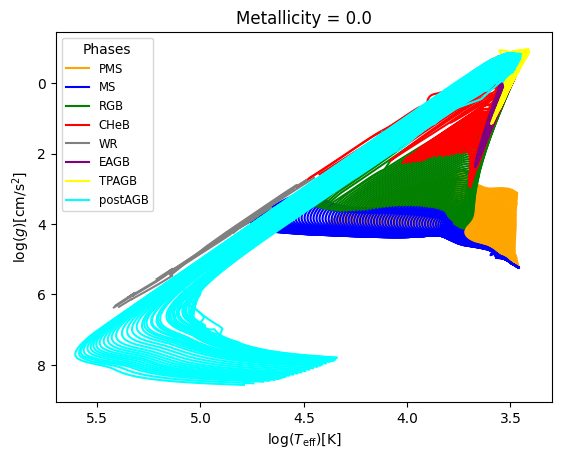

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
630600,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
630601,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
630602,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
630603,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


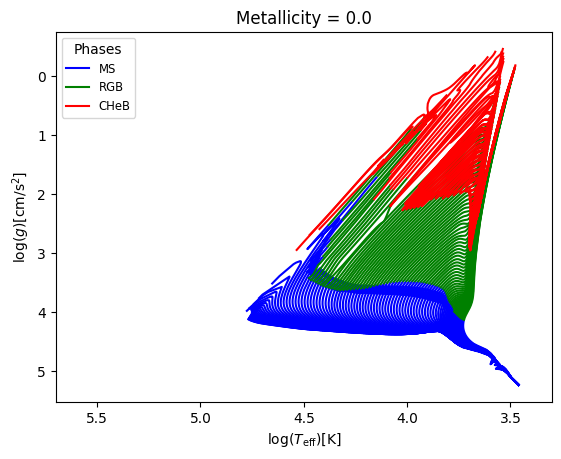

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.1154, Median : 8.15

log_Teff  : Range : 3.34 - 5.3788, Mean : 4.0283, Median : 3.9761

log_g  : Range : -1.08 - 6.2594, Mean : 3.5075, Median : 3.8521

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 298.5448, Mean : 11.4145, Median : 2.8996

log_R  : Range : -1.0 - 3.1298, Mean : 0.735, Median : 0.7005



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 5.378801600728572
Median value in train data for the log_Teff parameter: 3.976722754899366
Mean value in train data for the log_Teff parameter: 4.028639708216513

Range in train data for the log_g parameter : -1.0828963170617296 - 6.259434356871683
Median value in train data for the log_g parameter: 3.852761890388139
Mean value in train data for the log_g parameter: 3.508503471076473

Range in train data for the log_R parameter : -0.9974628481553472 - 3.129269620812593
Median value in train data for the log_R parameter: 0.7005259212303901
Mean value in train data for the log_R parameter: 0.7346615625058007

Testing set statistics:
Range in test data for the log_Teff parameter : 3.3447003632081813 - 5.3787504733463445
Median value in test data for the log_Teff parameter: 3.9741415586935043
Mean value in test data for the log_Teff parameter: 4.027301245585765

Range in test data for the log_g pa

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.8776469903235318
  RMSE :  0.14105010778619193
  MAE :  0.11864441659301242
  MedAE :  0.1190318837347879
  CORR :  0.938506539021327
  MAX_ER :  0.6983122337425676
  Percentiles : 
    75th percentile :  0.15943562396345923
    90th percentile :  0.1957891564961751
    95th percentile :  0.22712214332942546
    99th percentile :  0.3888485921728808

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.7910034425526862
  RMSE :  0.15252300726657073
  MAE :  0.11345104335506576
  MedAE :  0.08803759504561448
  CORR :  0.8895476708545759
  MAX_ER :  0.654500185023335
  Percentiles : 
    75th percentile :  0.1456085178599975
    90th percentile :  0.2439626087429643
    95th per

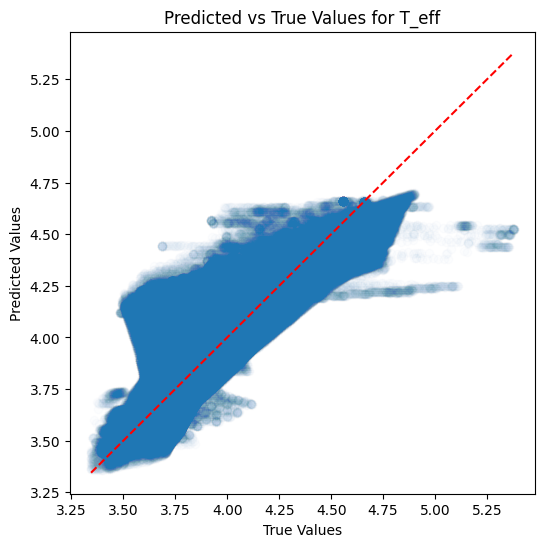

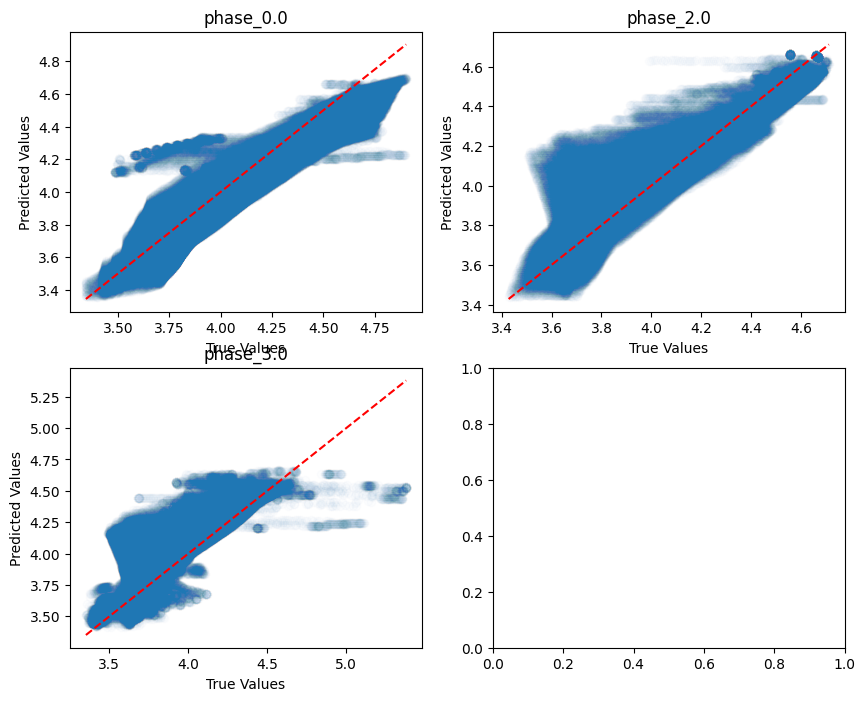

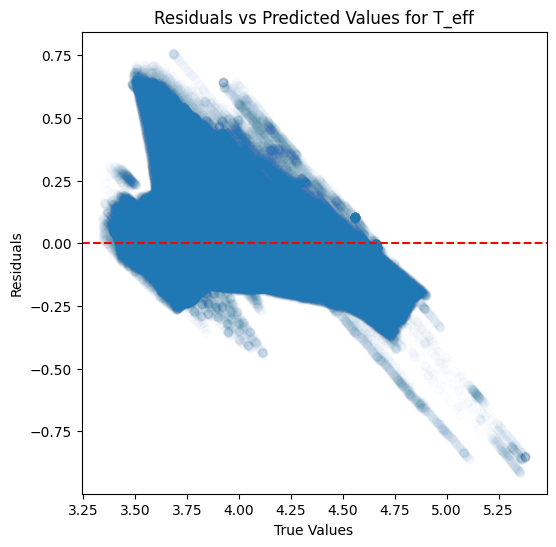

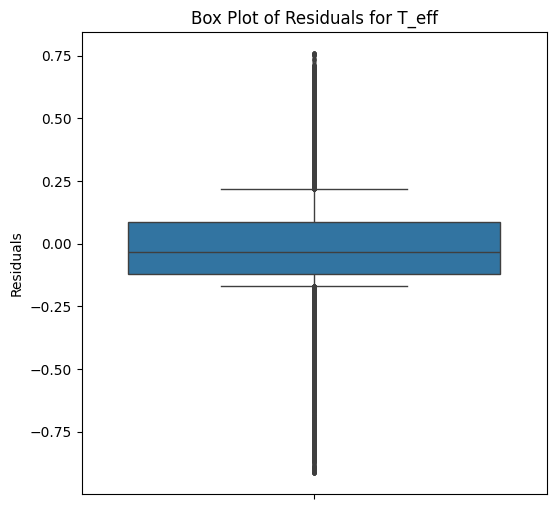

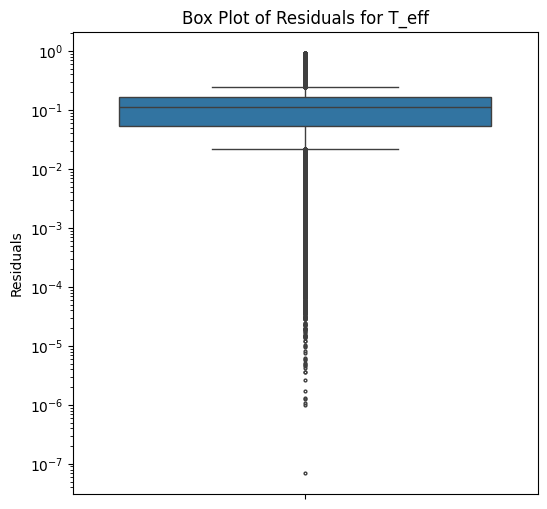

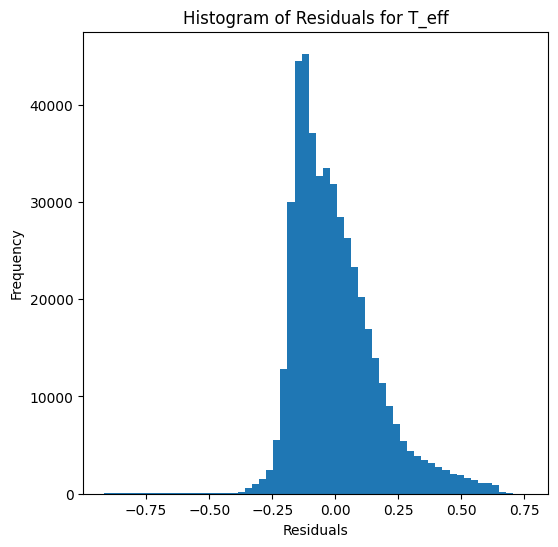

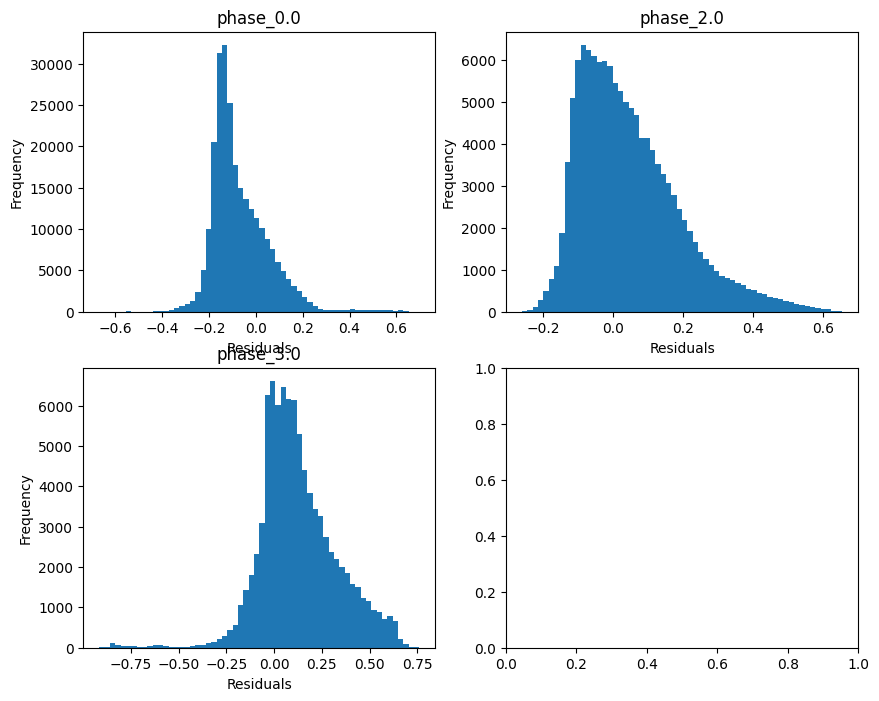

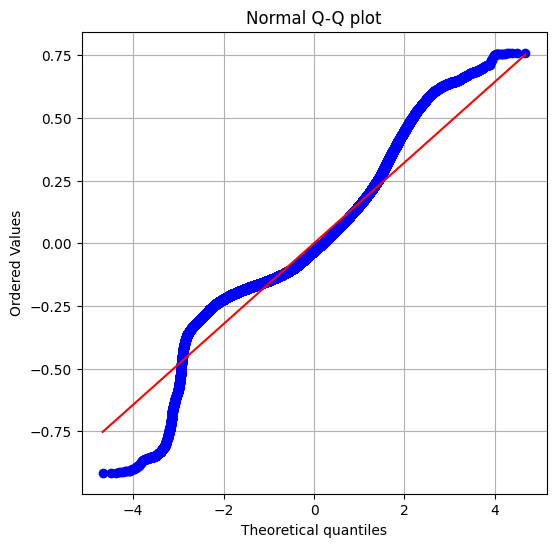

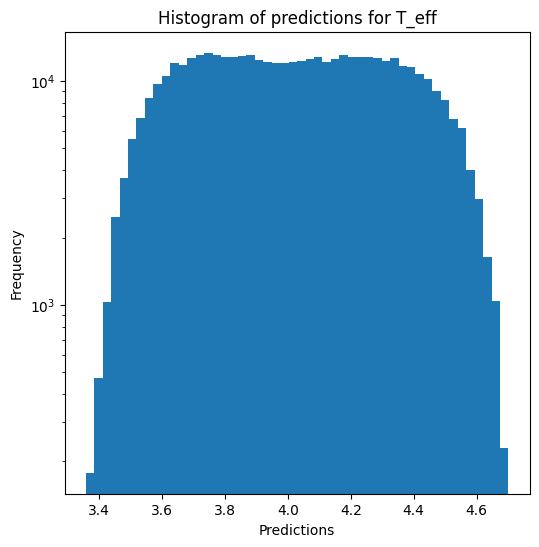

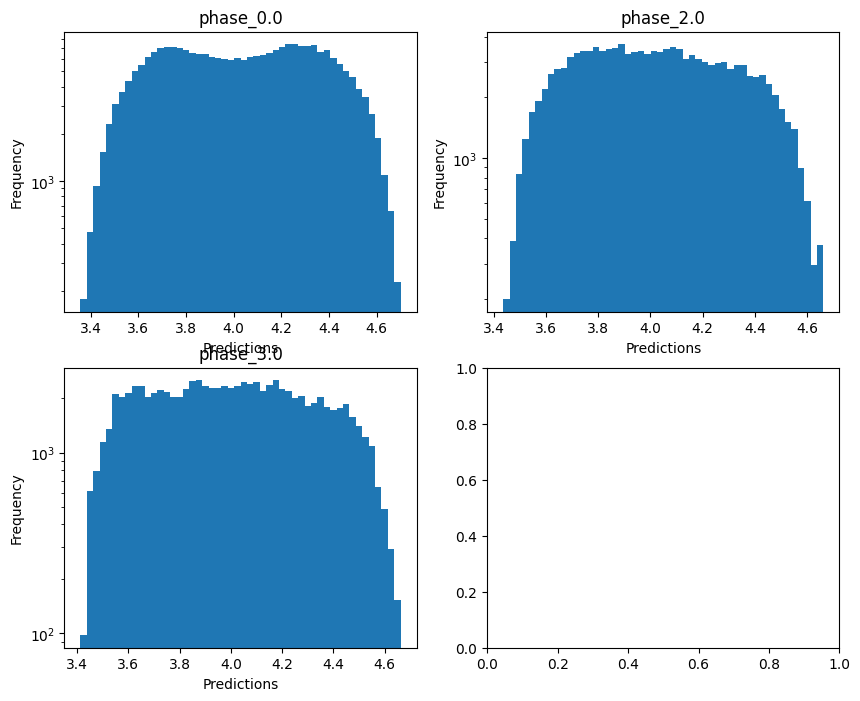

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  -0.17479167445925192
  RMSE :  0.8256546226000472
  MAE :  0.7181210016210489
  MedAE :  0.7421355630205517
  CORR :  0.6142673652047831
  MAX_ER :  3.570324241788162
  Percentiles : 
    75th percentile :  0.9426833569144832
    90th percentile :  1.185200515134263
    95th percentile :  1.42090921665047
    99th percentile :  1.8253604076536574

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.156831205485903
  RMSE :  0.893067102554223
  MAE :  0.6734199578395589
  MedAE :  0.5032371261866455
  CORR :  0.3960287670926846
  MAX_ER :  2.941282857666635
  Percentiles : 
    75th percentile :  0.9036651803651158
    90th percentile :  1.5696356348339071
    95th percentile :  1.9700013230922526
    99th percentile :  2.4989170473935394

log_g results for the phase categor

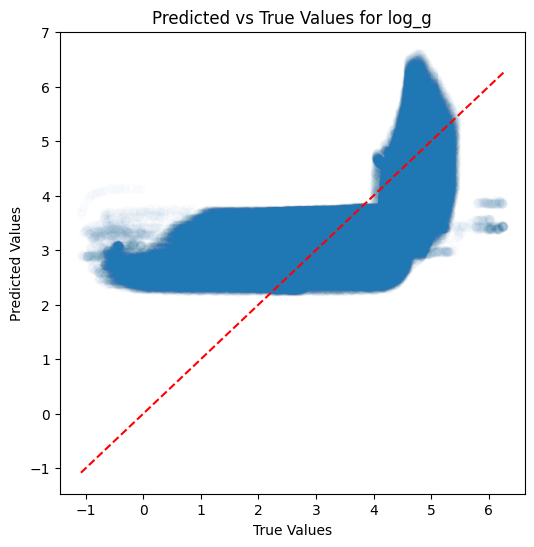

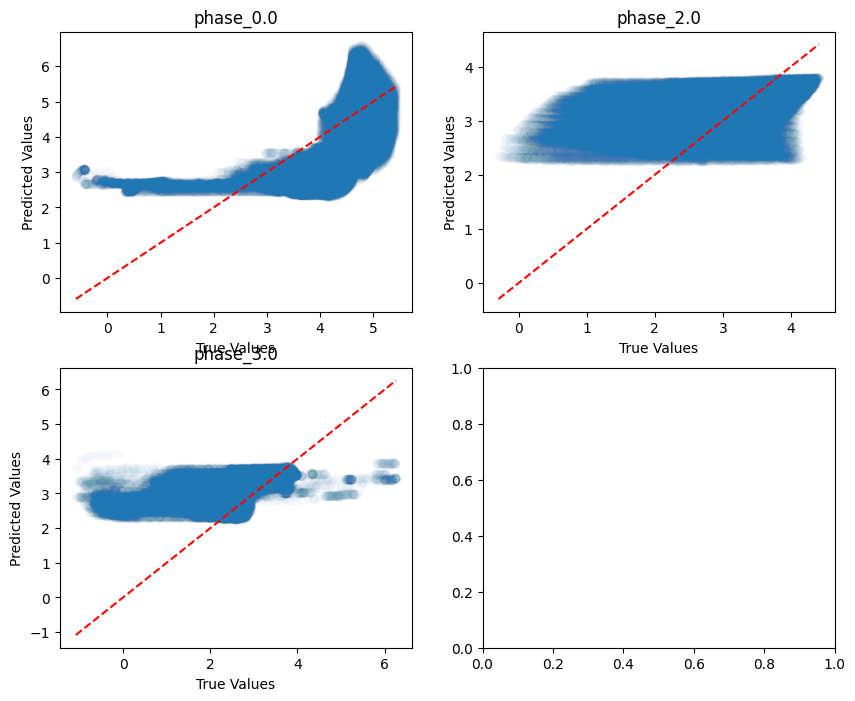

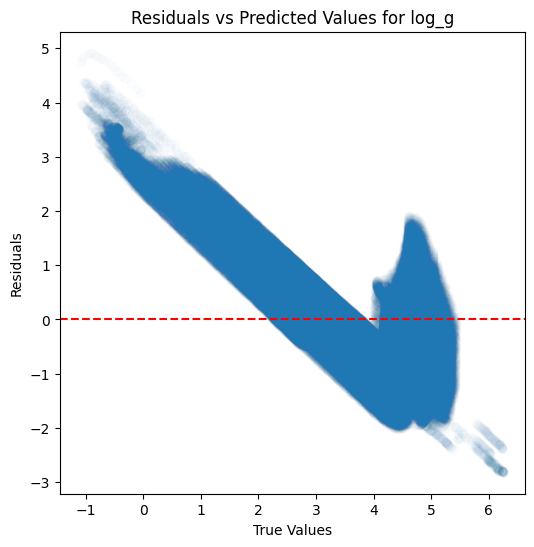

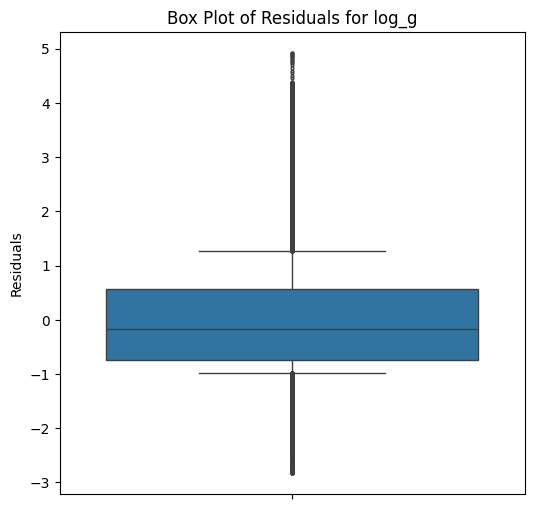

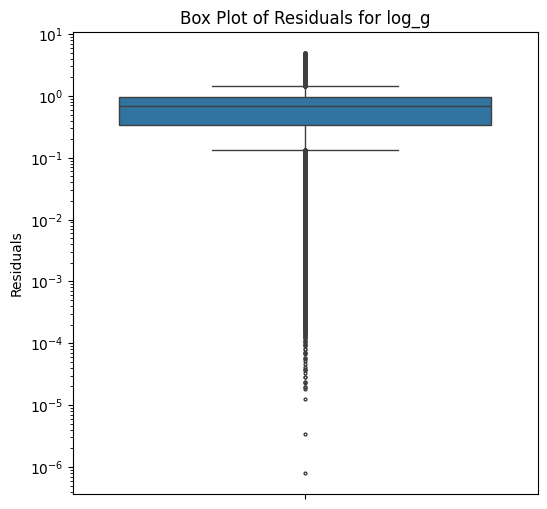

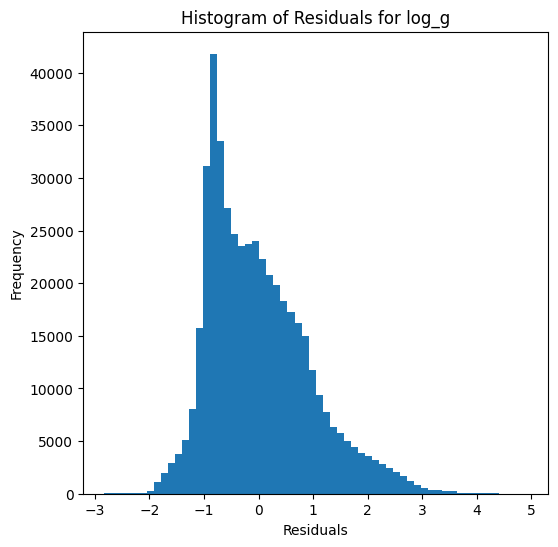

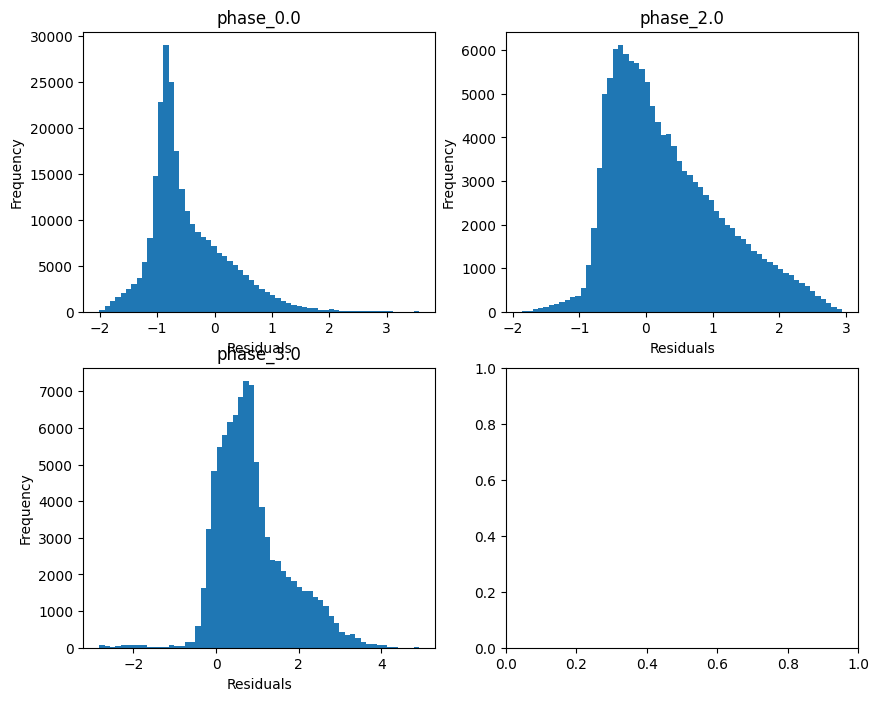

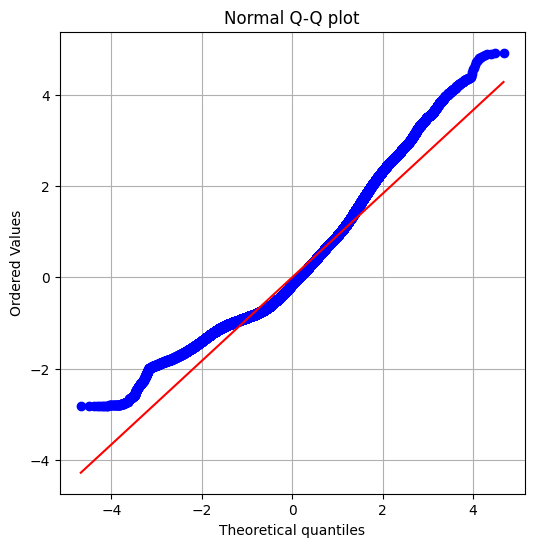

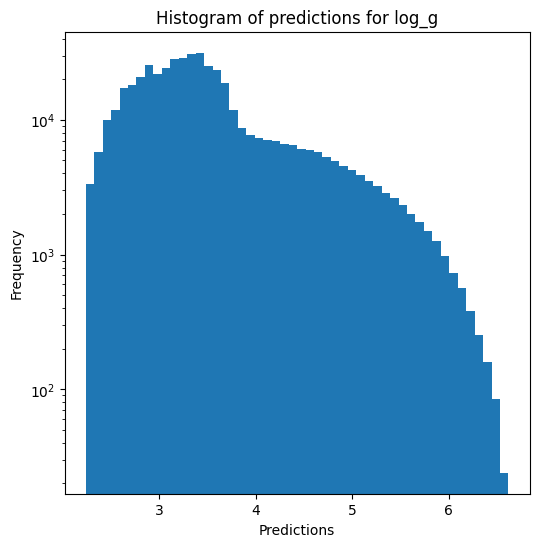

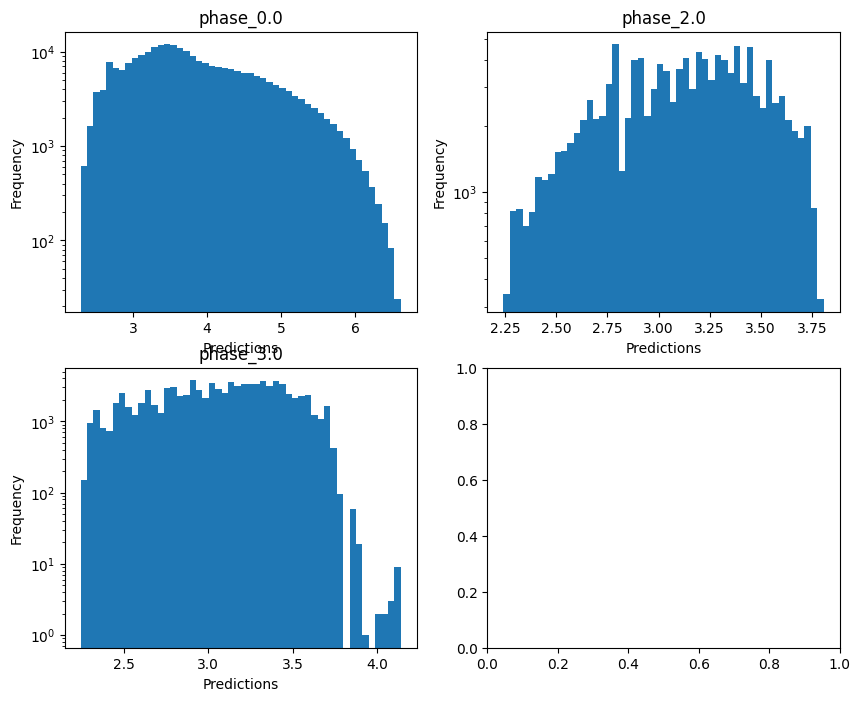


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.6213945971705614
  RMSE :  0.42159722835346997
  MAE :  0.3656503241954251
  MedAE :  0.37030780397632
  CORR :  0.8325393214118922
  MAX_ER :  1.7402596365041112
  Percentiles : 
    75th percentile :  0.4943918804372679
    90th percentile :  0.6070405900221092
    95th percentile :  0.7204426617067936
    99th percentile :  0.9313105922709488

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.21430543200315177
  RMSE :  0.46222017564788137
  MAE :  0.3526822316966955
  MedAE :  0.2733582458906847
  CORR :  0.4988639802509385
  MAX_ER :  1.5482754807229981
  Percentiles : 
    75th percentile :  0.46466177384052465
    90th percentile :  0.8007807913578572
    95th percentile :  1.0140919496606027
    99th percentile :  1.3025311536352957

radius results for the phase category with a 

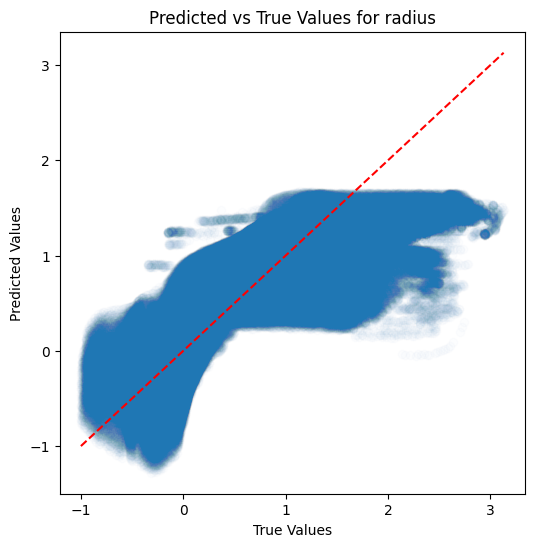

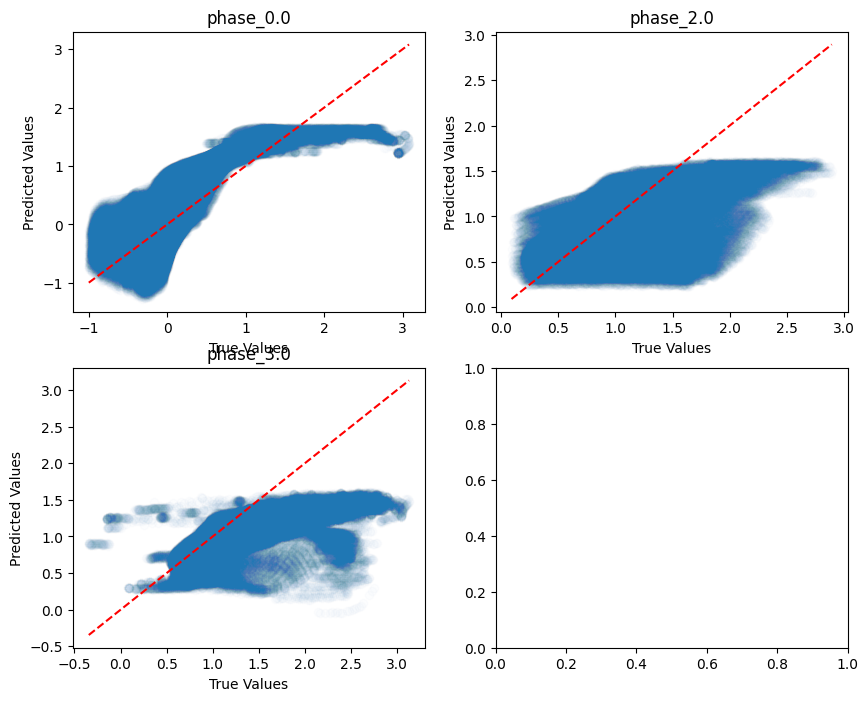

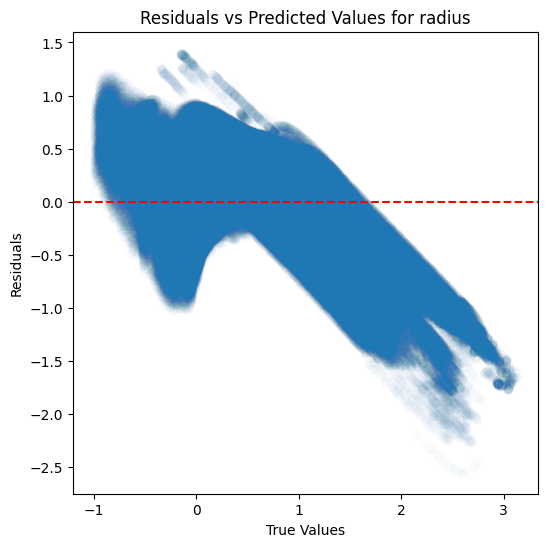

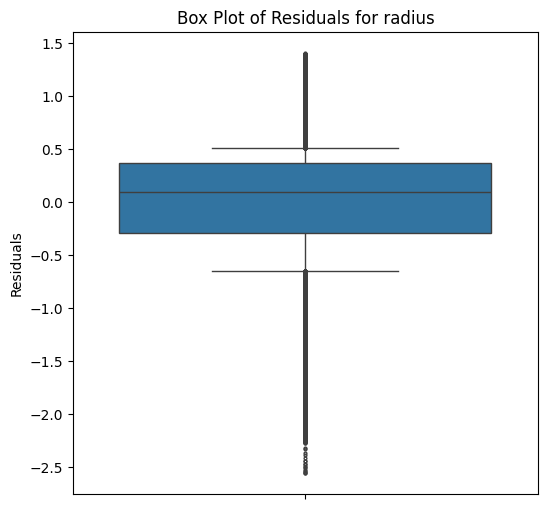

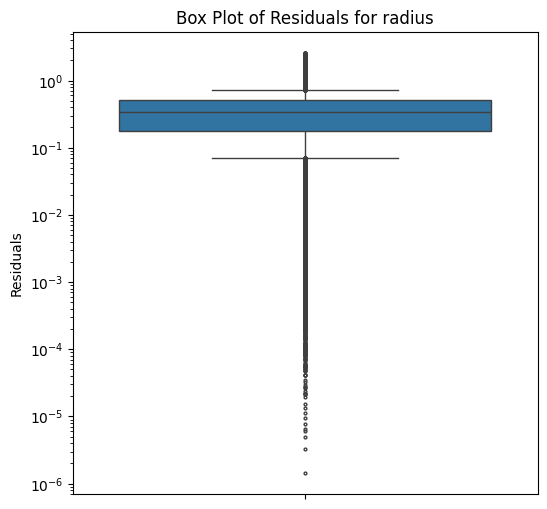

...

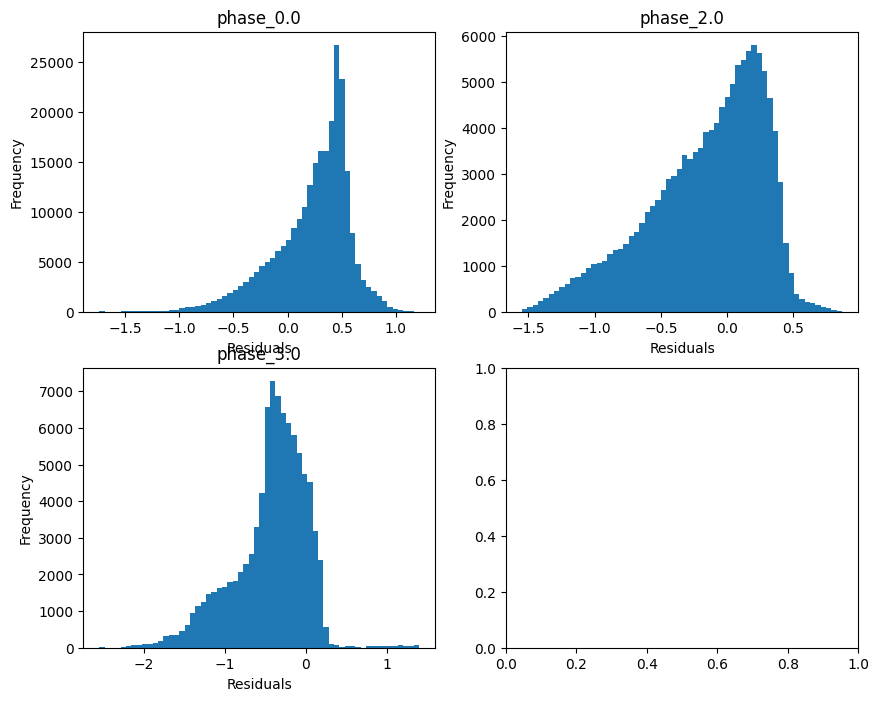

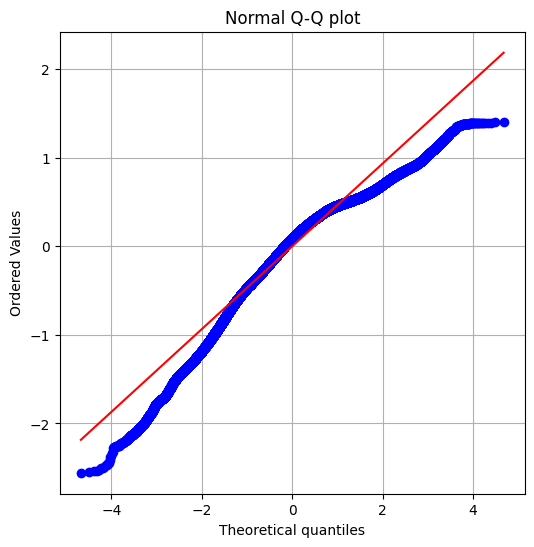

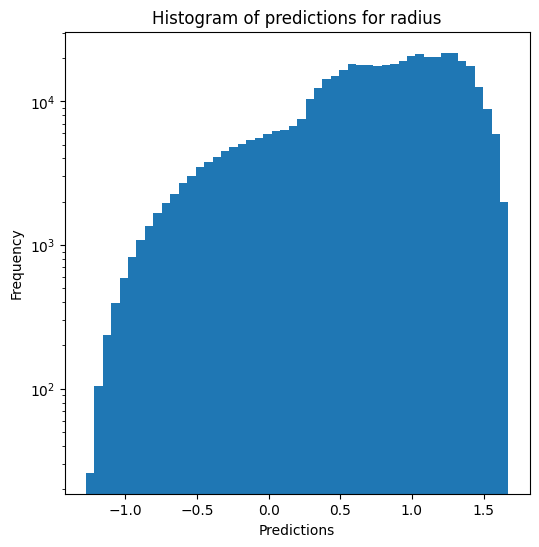

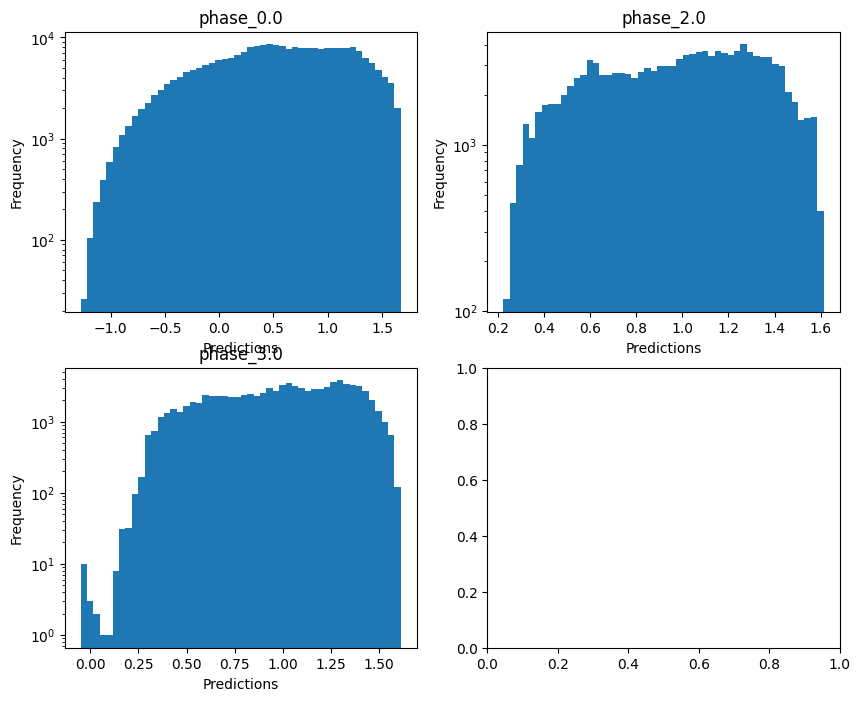

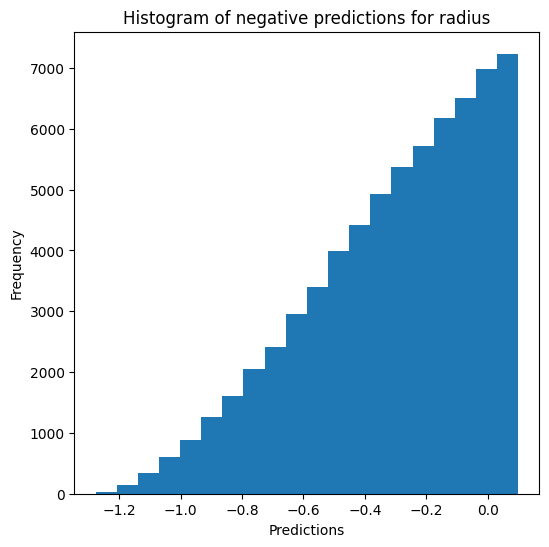

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9603800772684251
  RMSE :  0.07018247562679049
  MAE :  0.011638844294026002
  MedAE :  0.0011585284313053723
  CORR :  0.980401371100485
  MAX_ER :  0.9507131678891638
  Percentiles : 
    75th percentile :  0.002590844683925453
    90th percentile :  0.004747920684724209
    95th percentile :  0.011700663363448528
    99th percentile :  0.3993067604255296

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9591785148023877
  RMSE :  0.0639382138207047
  MAE :  0.023843547804563832
  MedAE :  0.003233346423238359
  CORR :  0.9795348158649451
  MAX_ER :  0.8470942576263263
  Percentiles : 
    75th percentile :  0.007896309888315134
    90th percentile :  0.08237450842339955

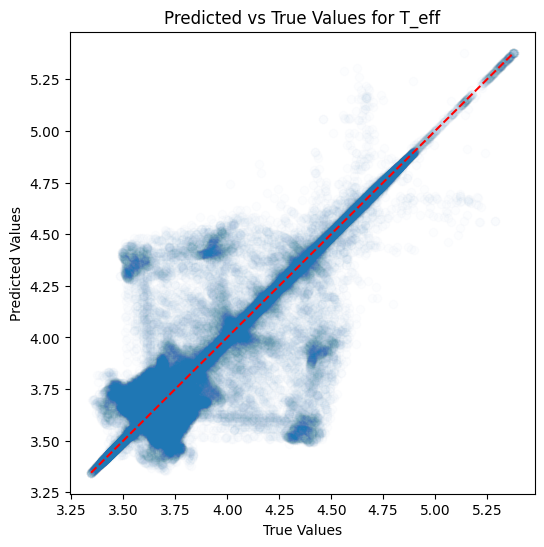

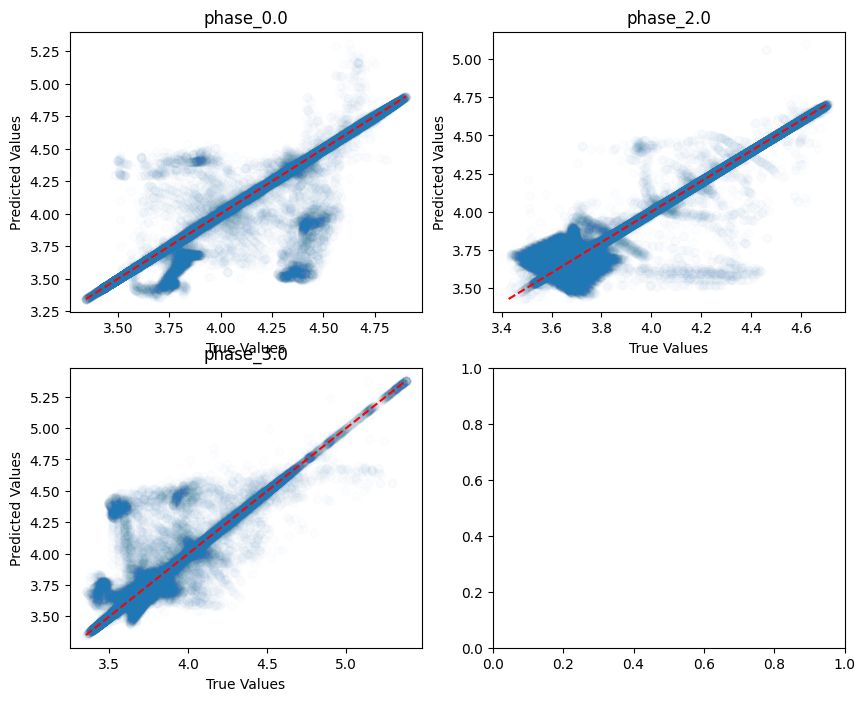

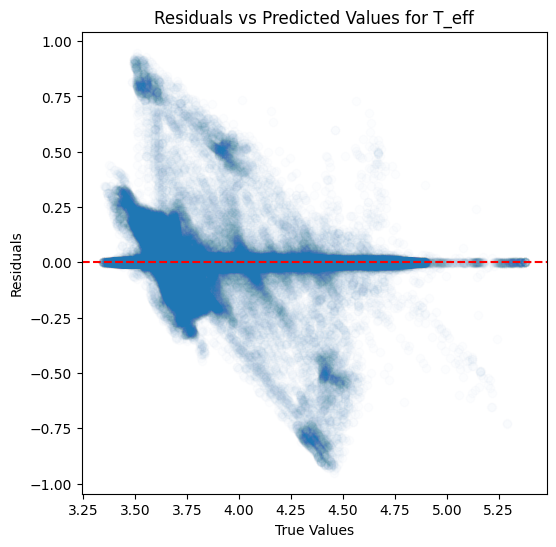

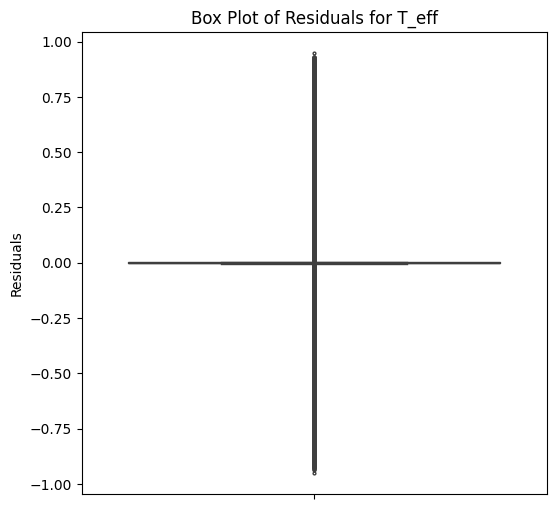

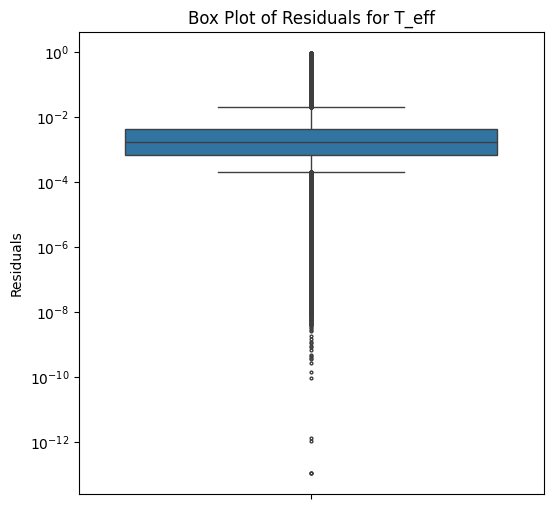

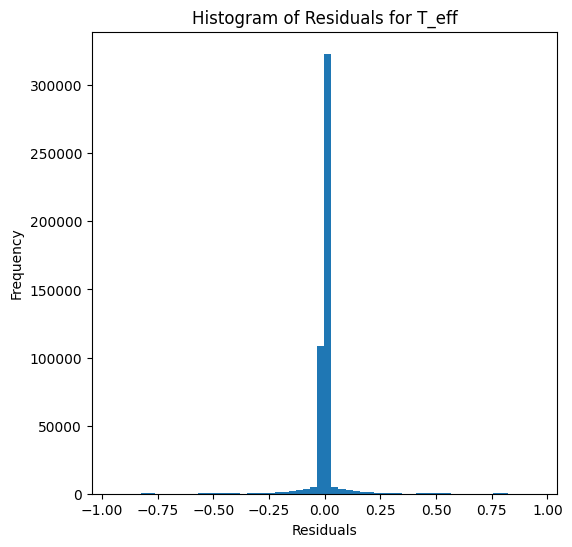

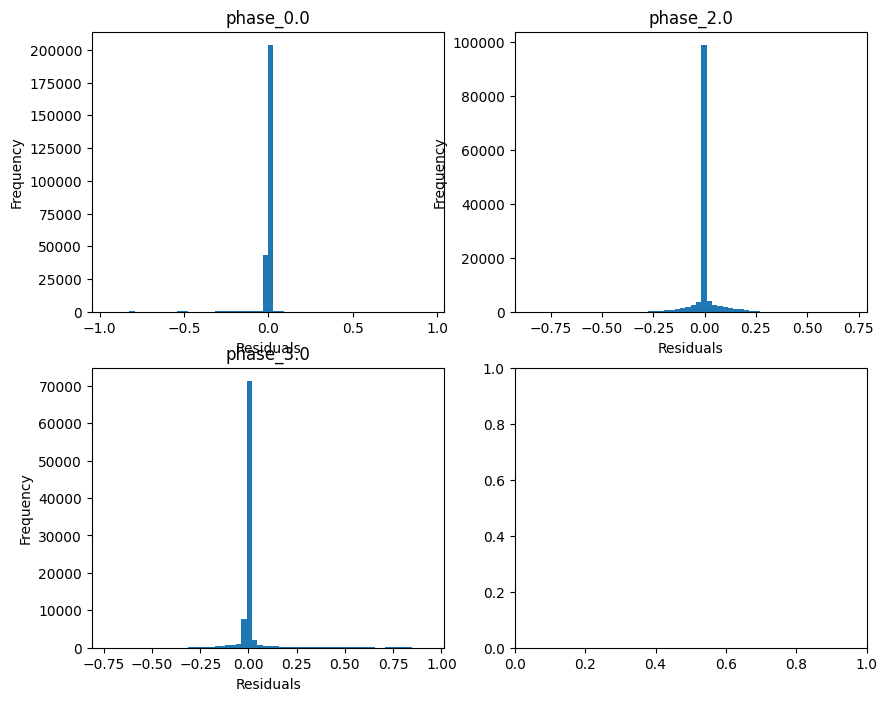

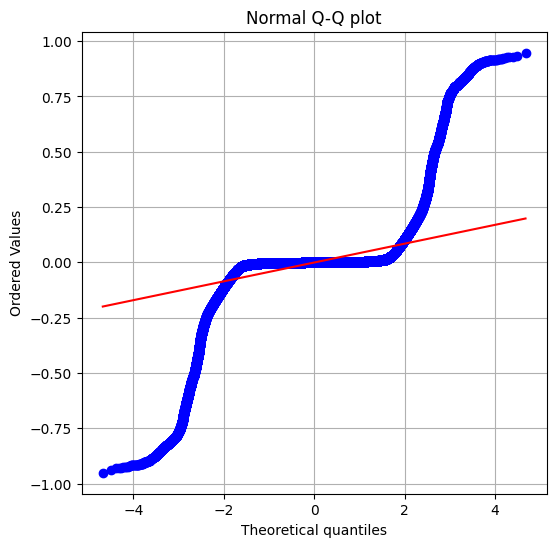

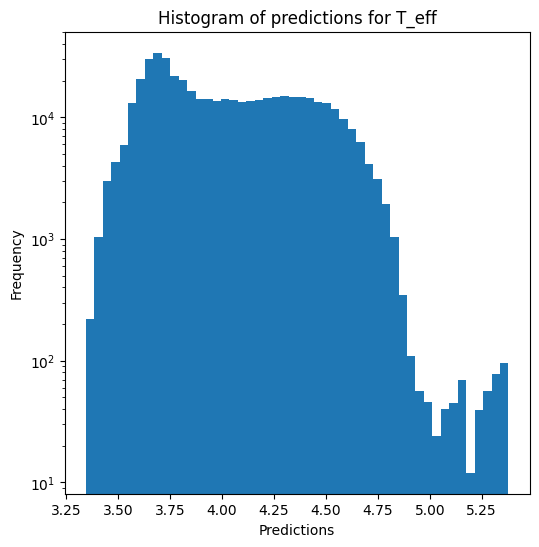

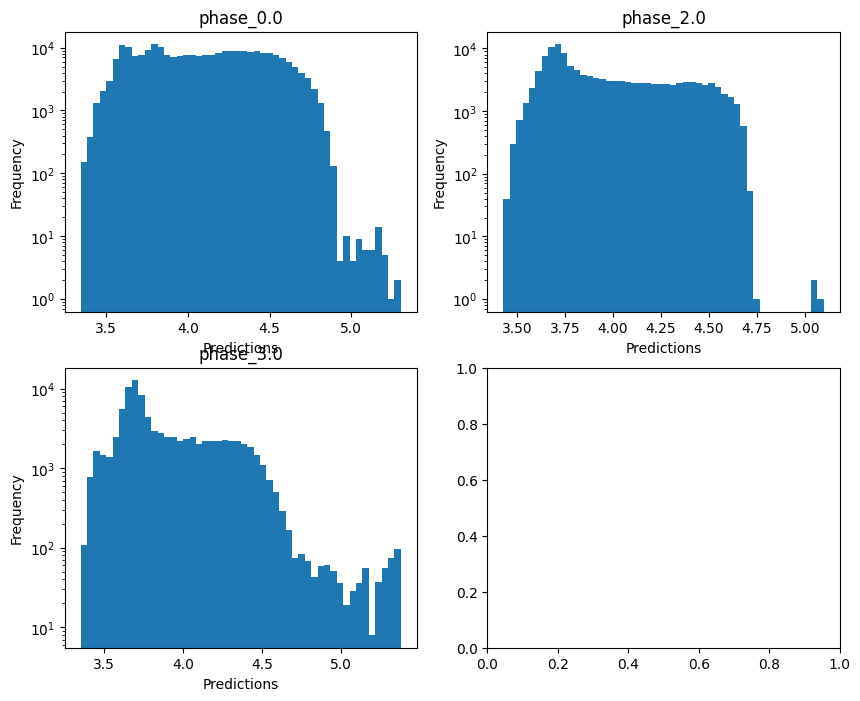


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.4611116829745463
  RMSE :  0.4625552287682627
  MAE :  0.07407538268564537
  MedAE :  0.004125884468703767
  CORR :  0.8070422546237424
  MAX_ER :  5.681742527263148
  Percentiles : 
    75th percentile :  0.008250690467752175
    90th percentile :  0.01713869521247142
    95th percentile :  0.03656253587197256
    99th percentile :  3.0852529930119763

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.11027369794462605
  RMSE :  0.858720034523065
  MAE :  0.3509534873206561
  MedAE :  0.01591936587188414
  CORR :  0.5526584178143672
  MAX_ER :  4.585015970670848
  Percentiles : 
    75th percentile :  0.04518579946333556
    90th percentile :  1.503353177822976
    95th percentile :  2.33288520003593
    99th percentile :  3.4598144355207747

log_g results for the phase category with a v

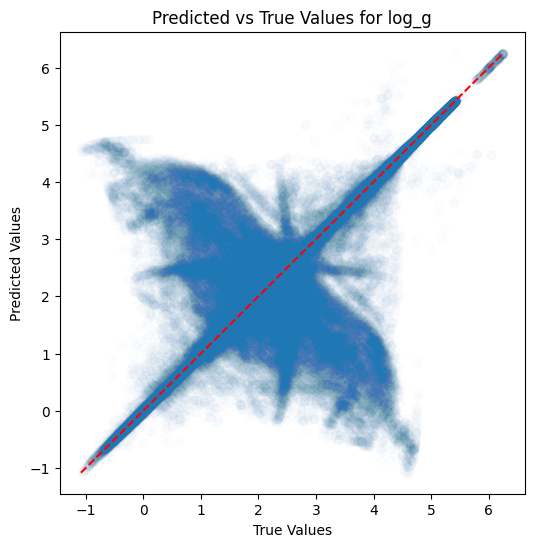

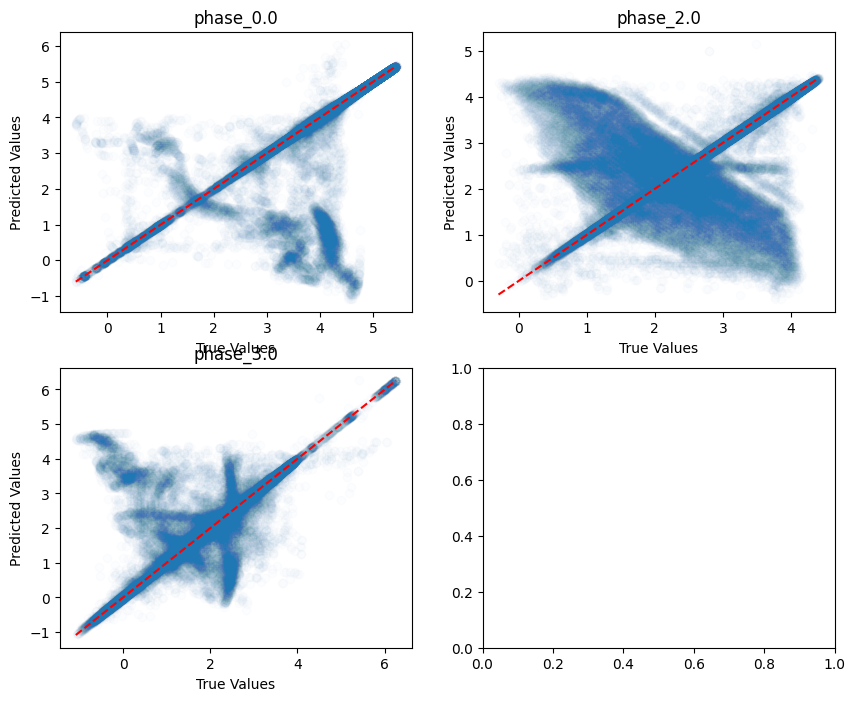

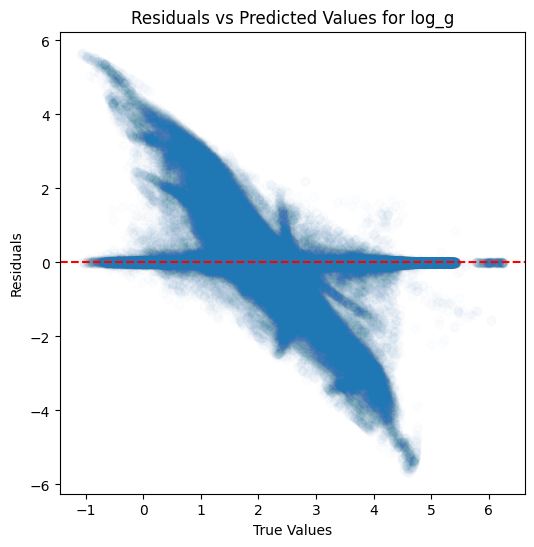

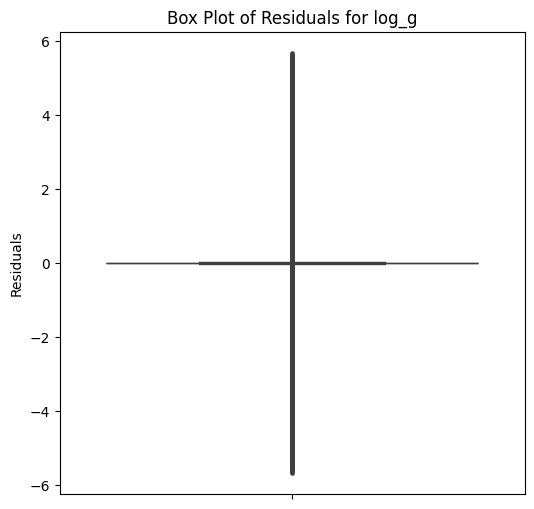

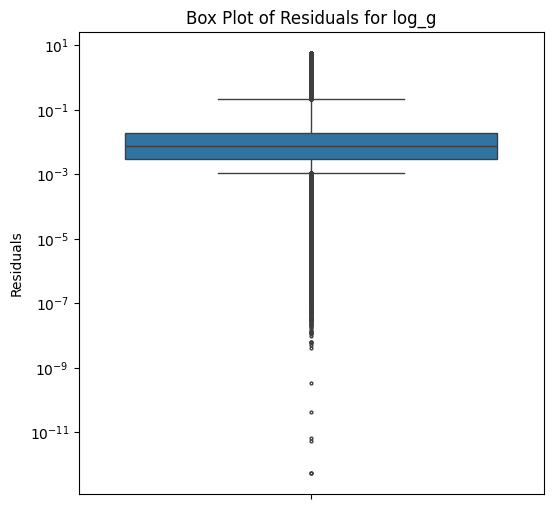

...

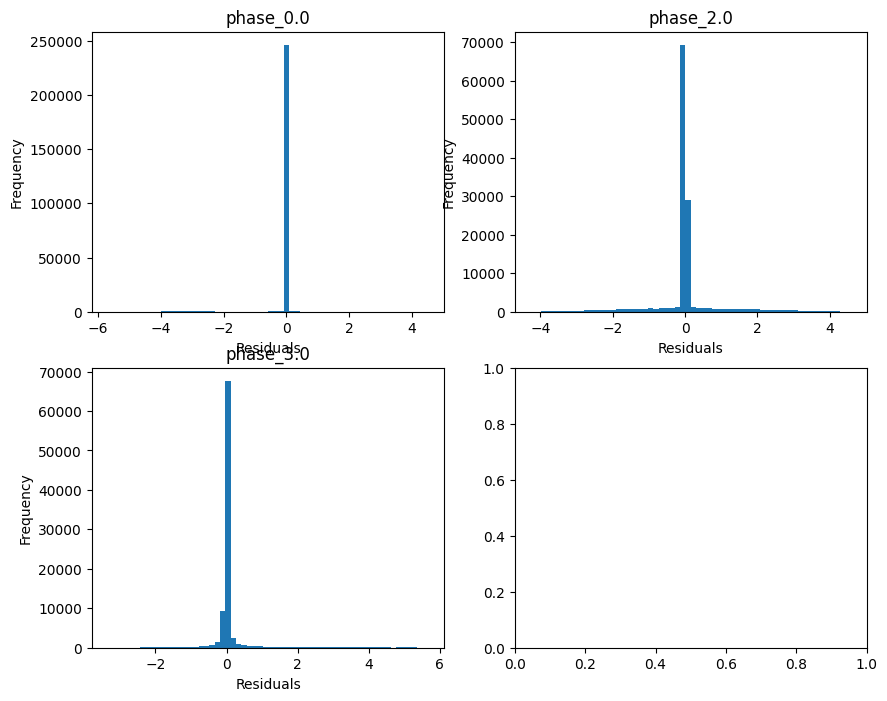

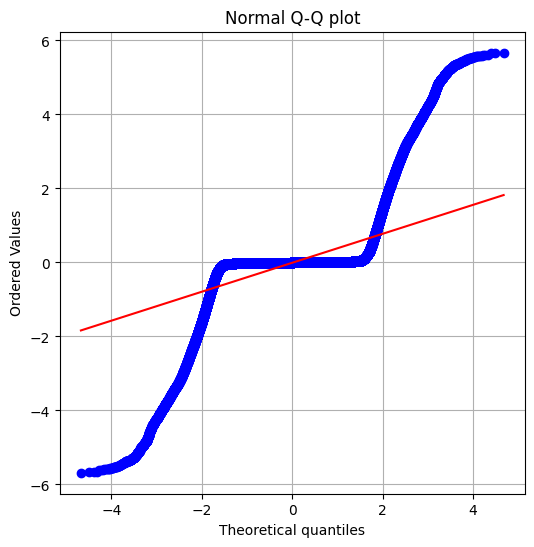

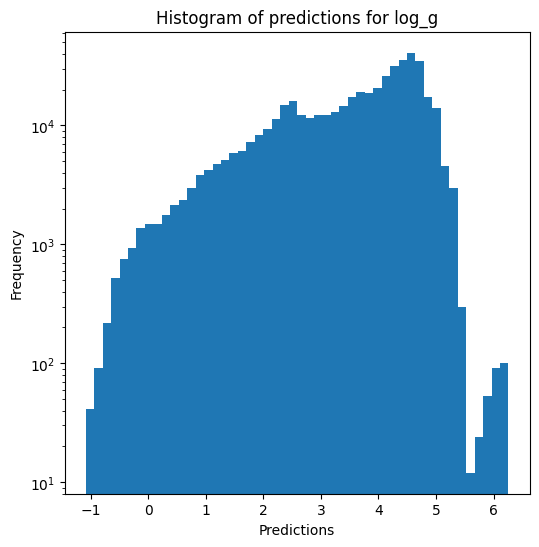

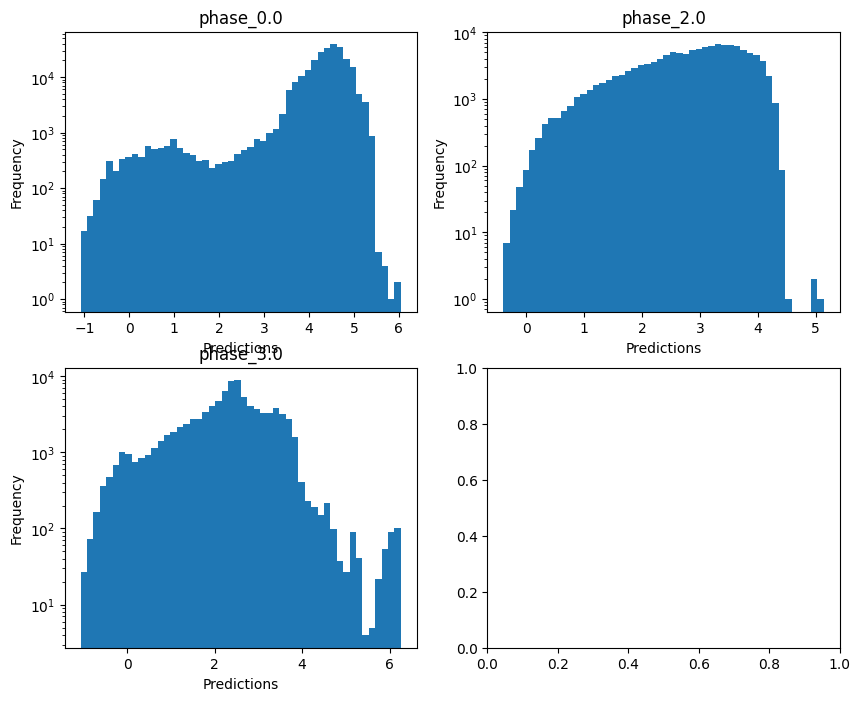

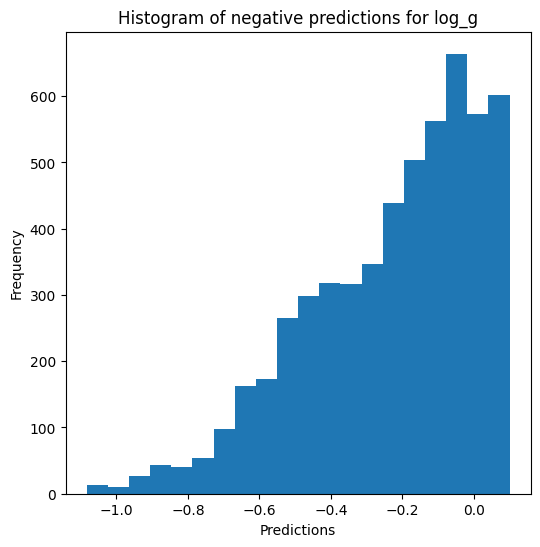


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8371235729987013
  RMSE :  0.23154992693797444
  MAE :  0.03801173682795359
  MedAE :  0.0028576243545894164
  CORR :  0.9269582354951056
  MAX_ER :  2.8409947115068483
  Percentiles : 
    75th percentile :  0.005417530625094202
    90th percentile :  0.010991980302291166
    95th percentile :  0.02126535820707785
    99th percentile :  1.543694055404311

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.2346952273274595
  RMSE :  0.42935273828041487
  MAE :  0.17548609223642136
  MedAE :  0.007974628827651875
  CORR :  0.6246854400472203
  MAX_ER :  2.2923746376311427
  Percentiles : 
    75th percentile :  0.02264776896493015
    90th percentile :  0.7515880218963698
    95th percentile :  1.1657582505063337
    99th percentile :  1.729989754170579

radius results for the phase categ

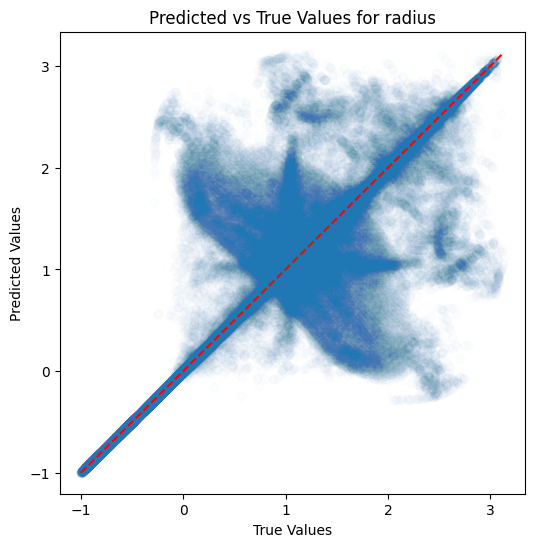

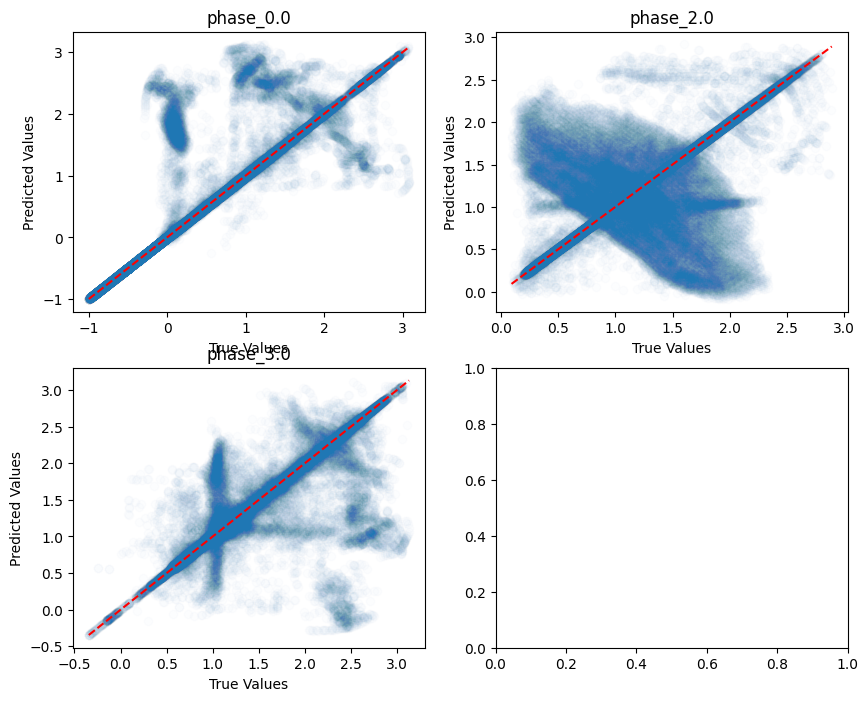

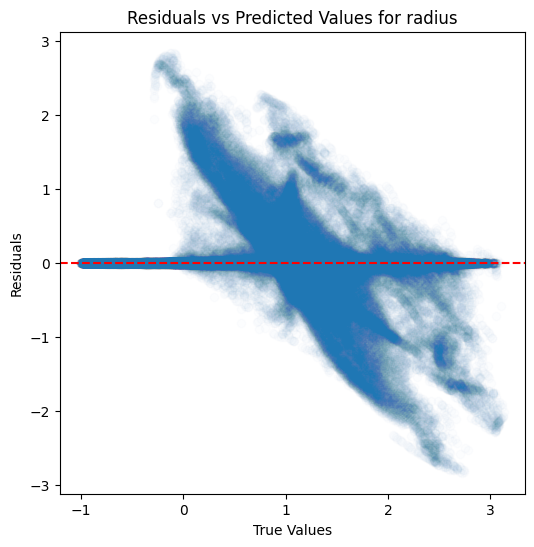

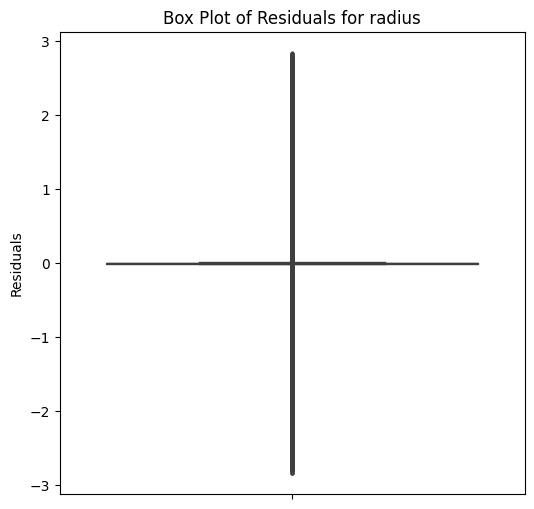

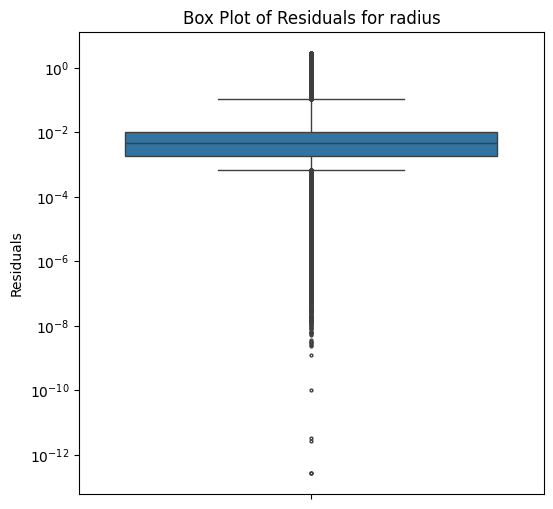

...

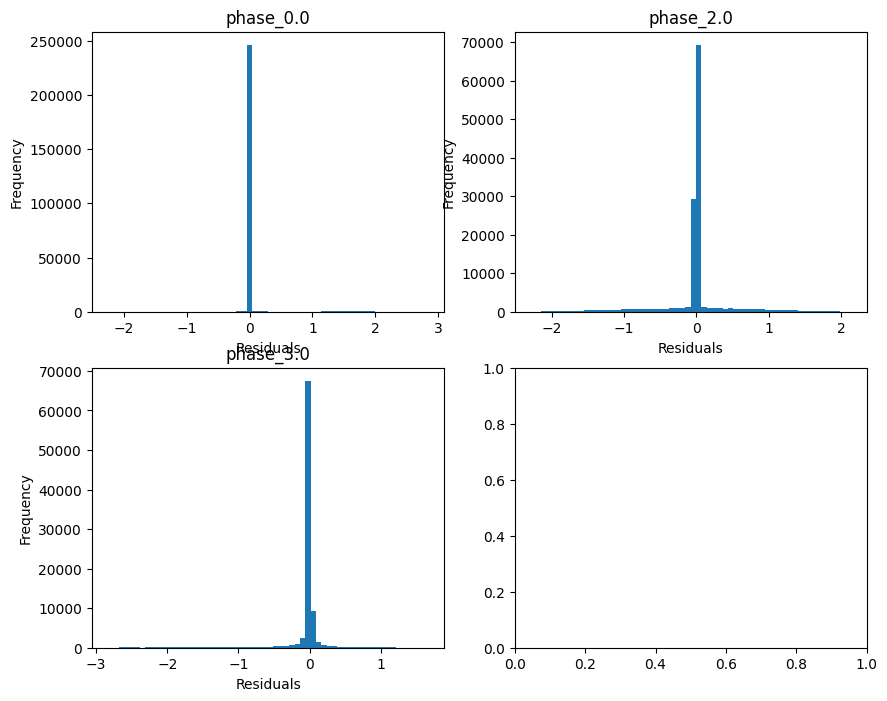

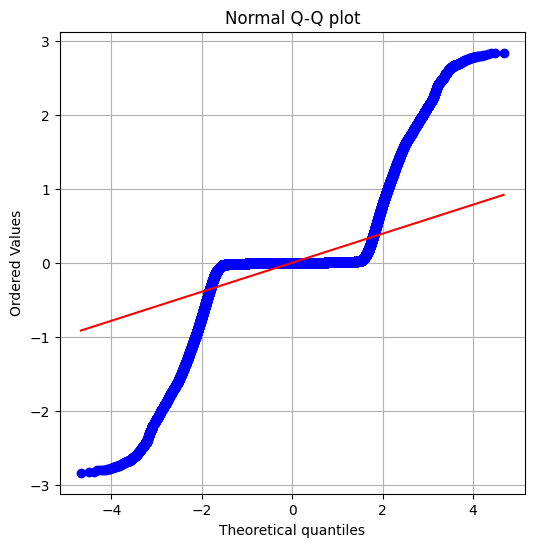

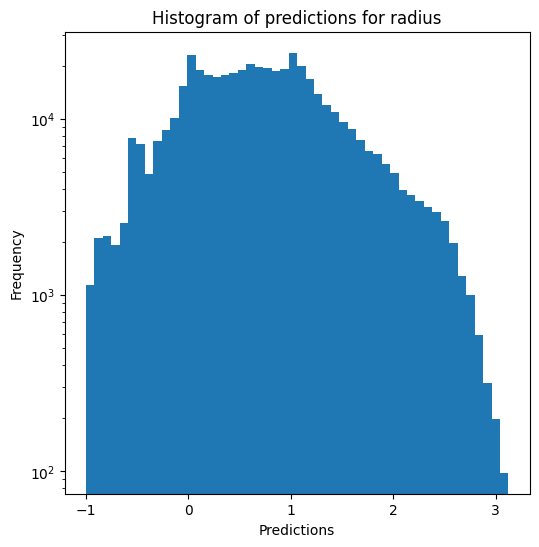

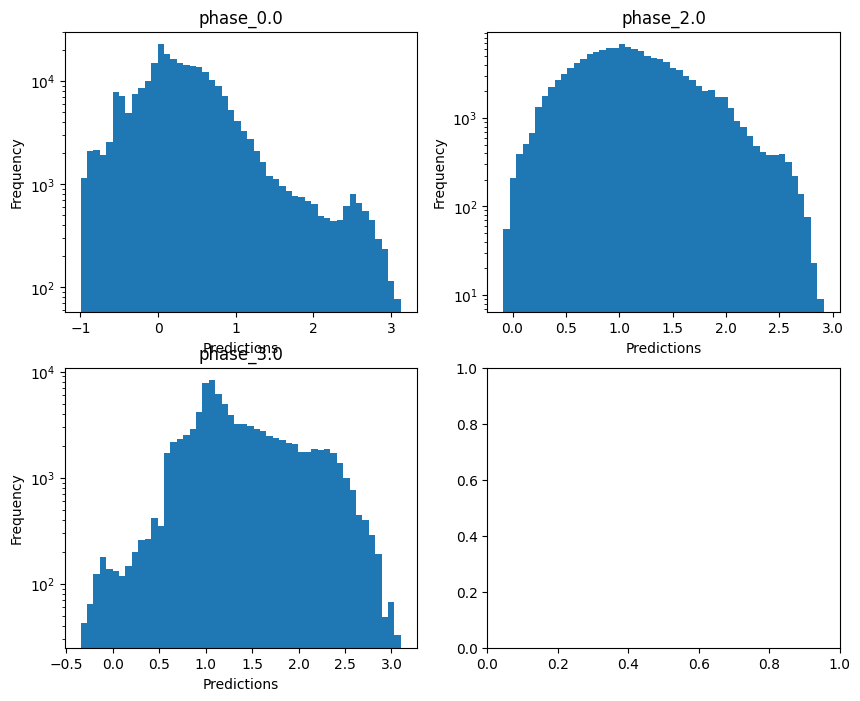

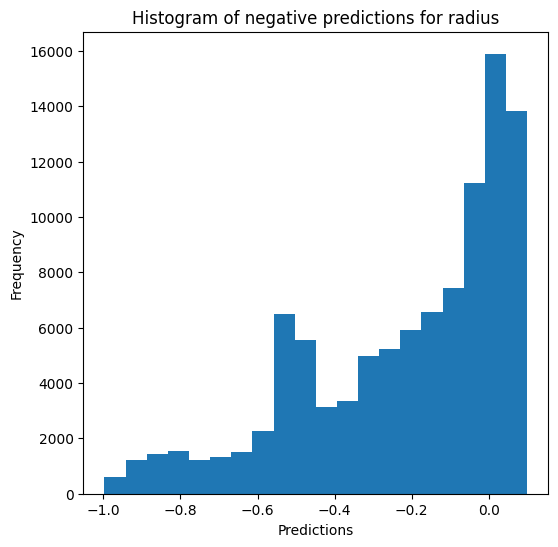

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9805307662414631
  RMSE :  0.049239595443656706
  MAE :  0.009220337820262547
  MedAE :  0.0012841989541987342
  CORR :  0.990274803695282
  MAX_ER :  0.9155860253438819
  Percentiles : 
    75th percentile :  0.0026179374852975945
    90th percentile :  0.005049030361149587
    95th percentile :  0.011136401038494776
    99th percentile :  0.24498859616358987

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9845943556106616
  RMSE :  0.03928551768630054
  MAE :  0.01646409414079189
  MedAE :  0.00218470368045498
  CORR :  0.9922729012911393
  MAX_ER :  0.7125480731818836
  Percentiles : 
    75th percentile :  0.010464065181133186
    90th percentile :  0.056372964863480

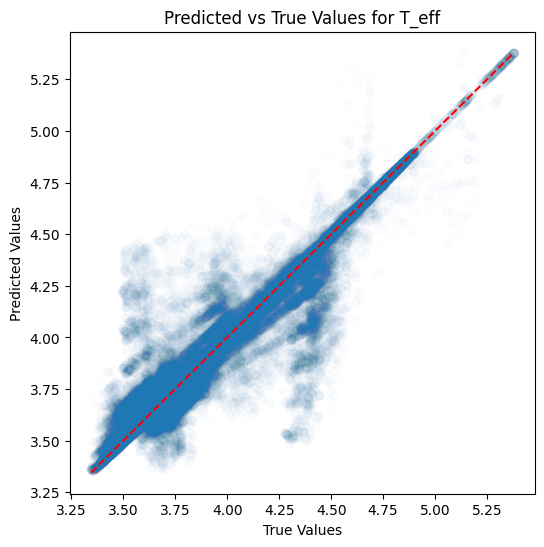

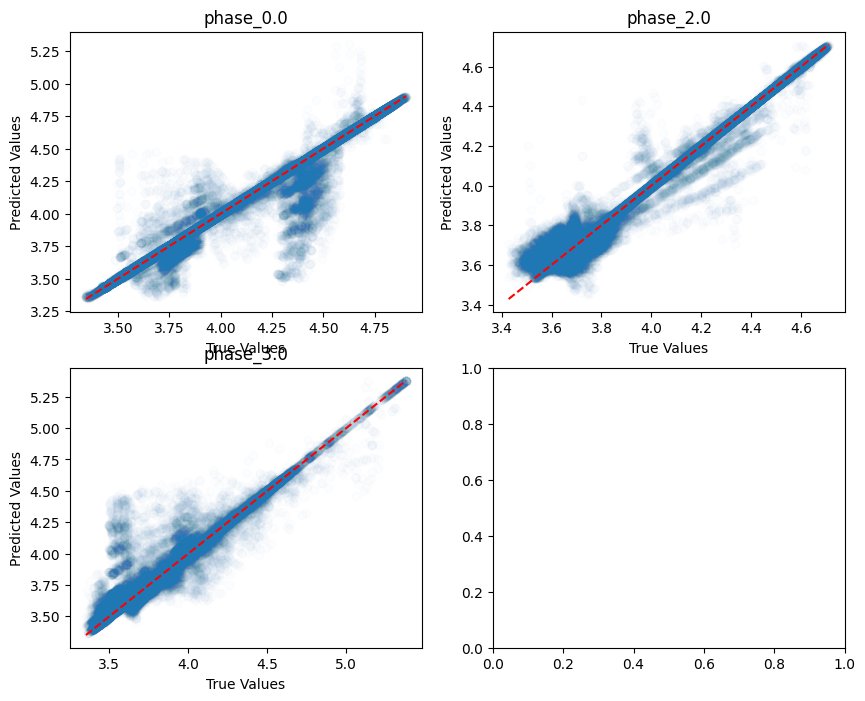

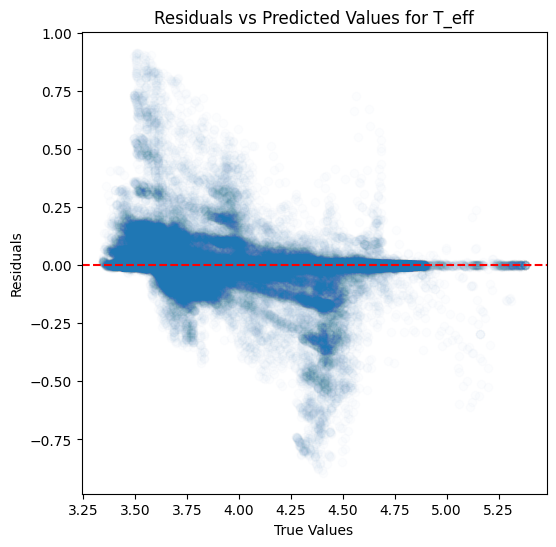

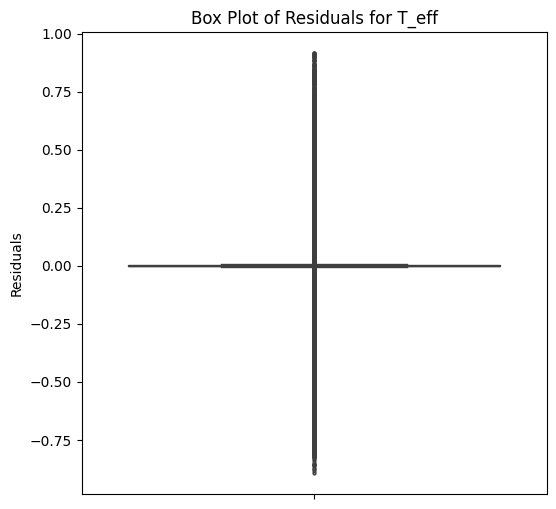

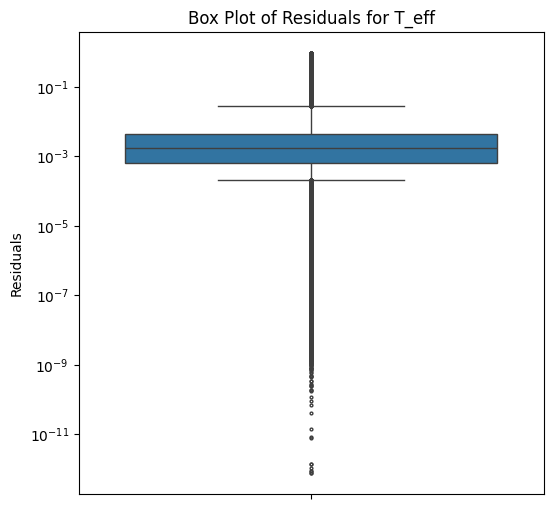

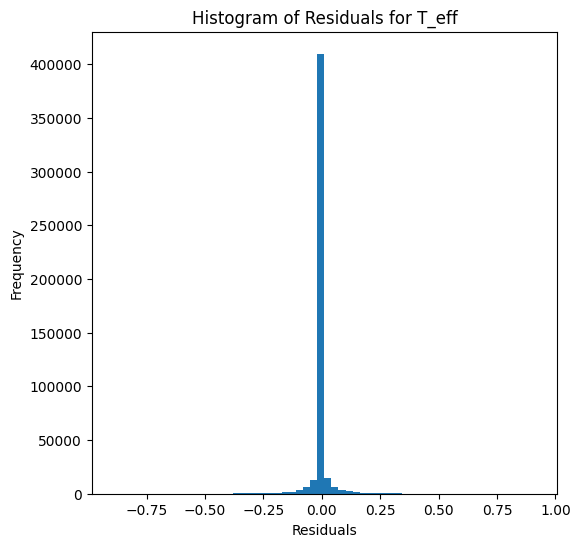

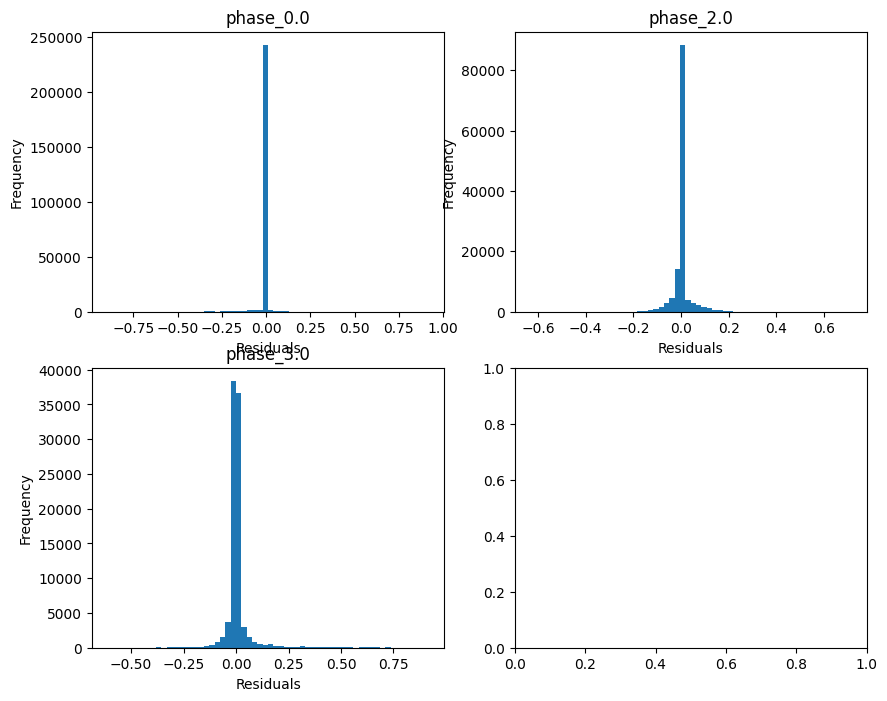

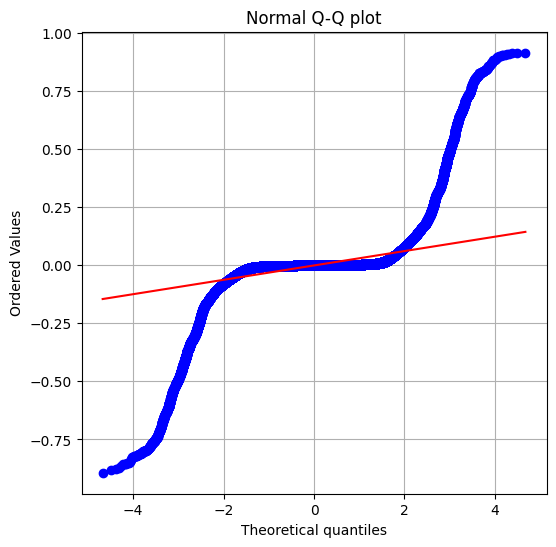

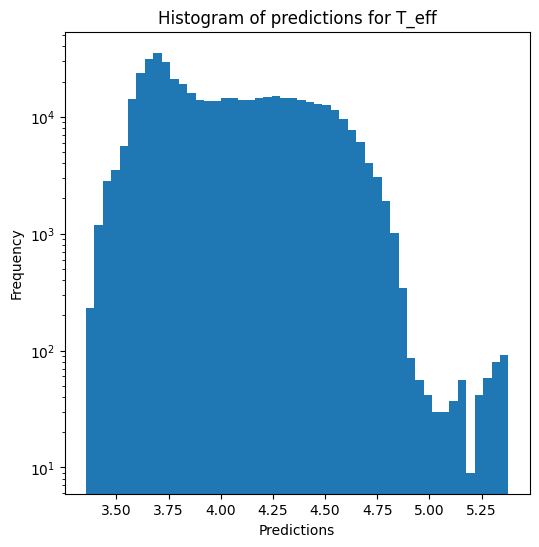

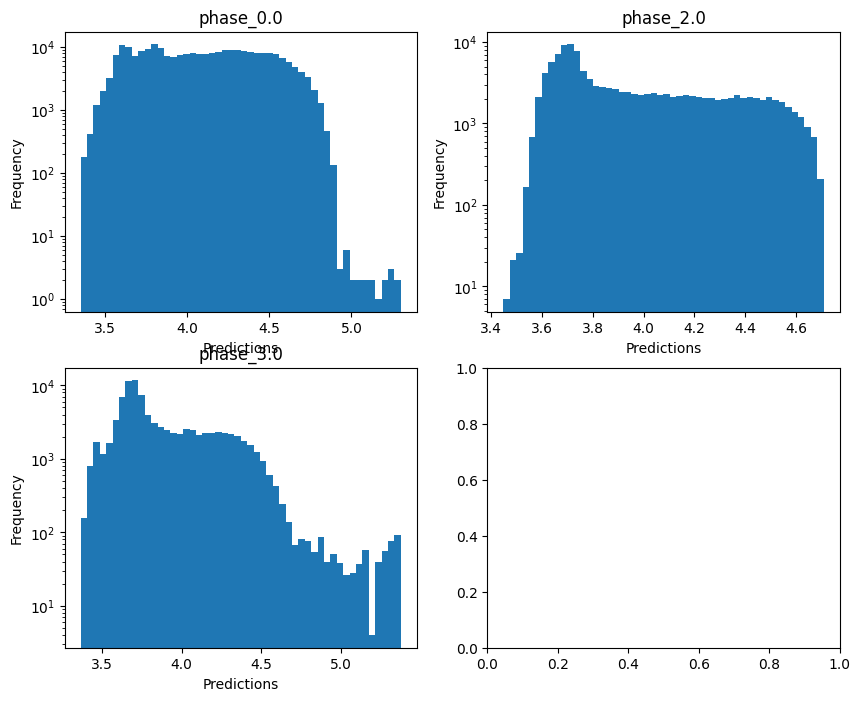


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.7299559107290954
  RMSE :  0.32810421198879247
  MAE :  0.05807523118763597
  MedAE :  0.002752059975103638
  CORR :  0.8884189357626322
  MAX_ER :  5.572704498947318
  Percentiles : 
    75th percentile :  0.007020431118020087
    90th percentile :  0.017153140527551618
    95th percentile :  0.042219038108757524
    99th percentile :  1.796652598626393

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.5959314274255119
  RMSE :  0.5789540724385903
  MAE :  0.24696935611052068
  MedAE :  0.01052283411359145
  CORR :  0.7760255102457181
  MAX_ER :  4.594663378913672
  Percentiles : 
    75th percentile :  0.13894325849124023
    90th percentile :  0.9737469711395585
    95th percentile :  1.4667115573444092
    99th percentile :  2.3197640818234917

log_g results for the phase category wi

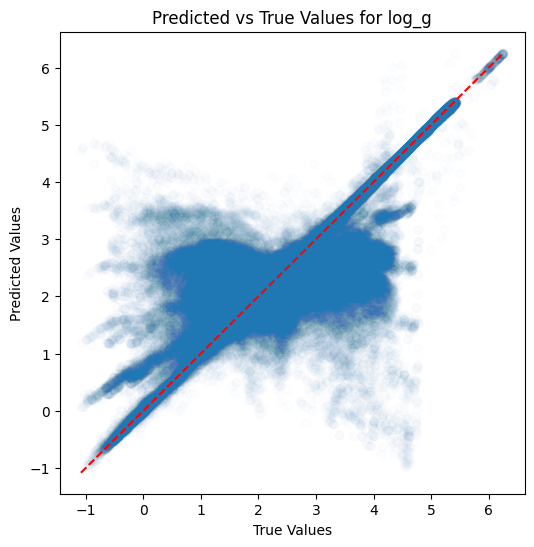

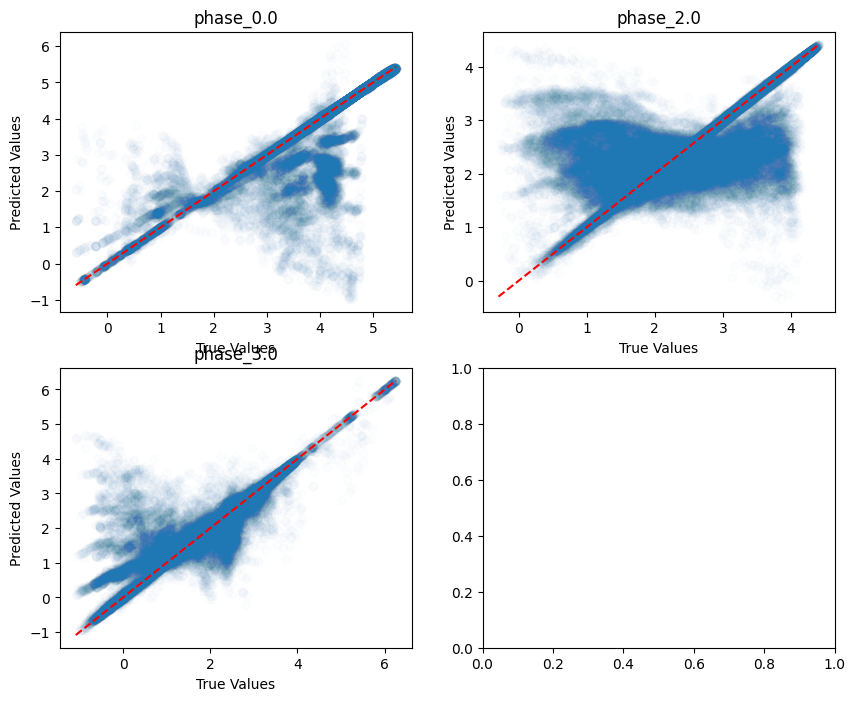

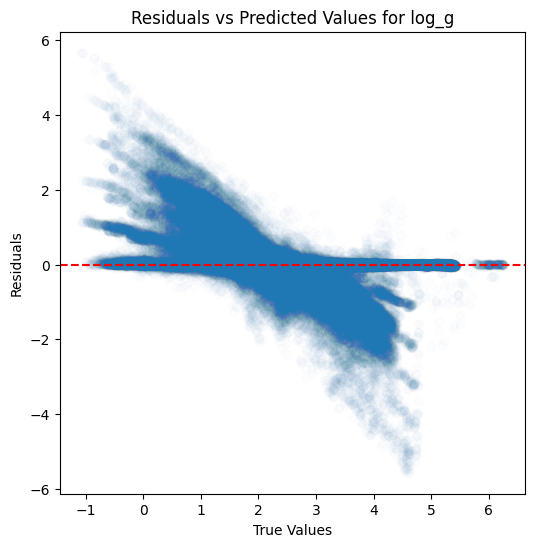

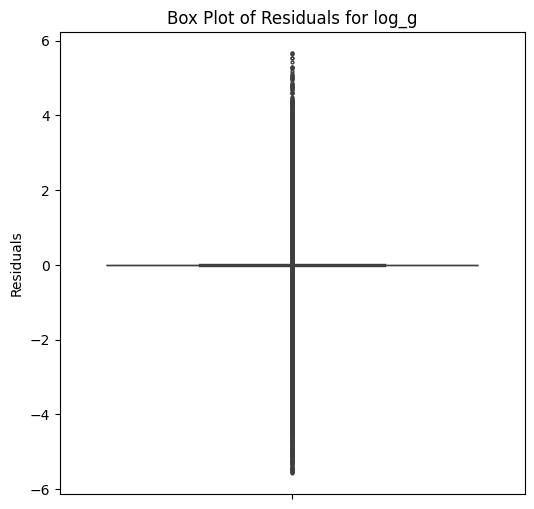

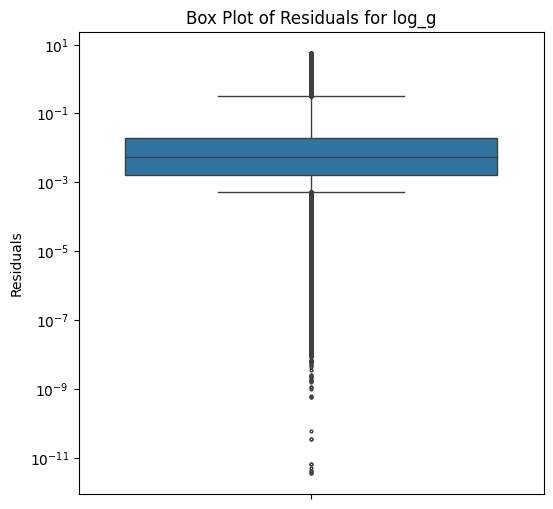

...

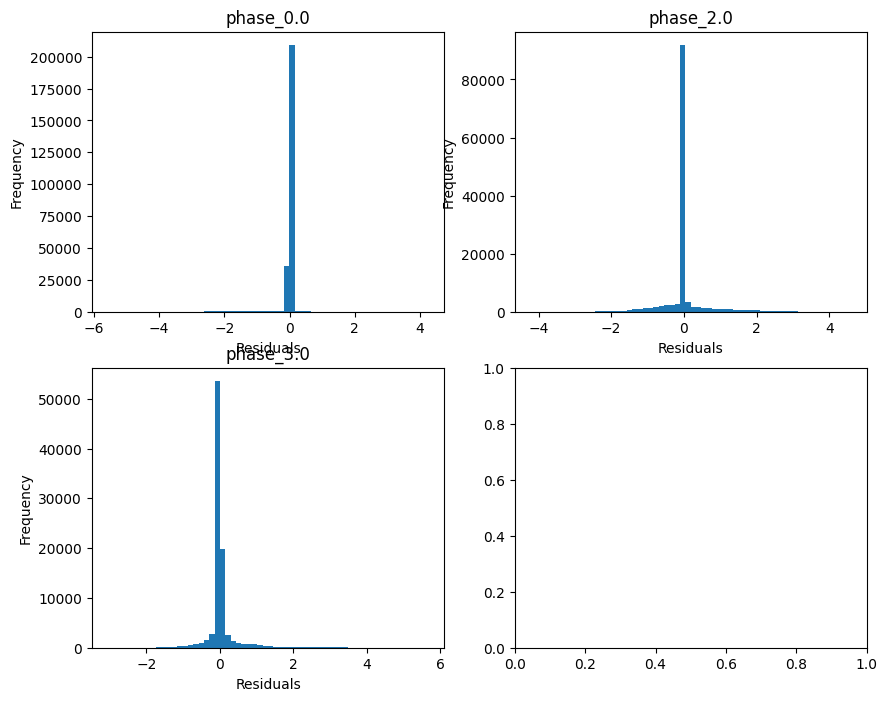

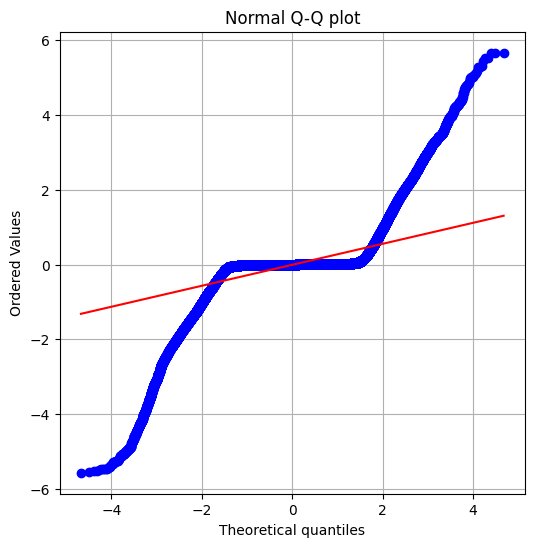

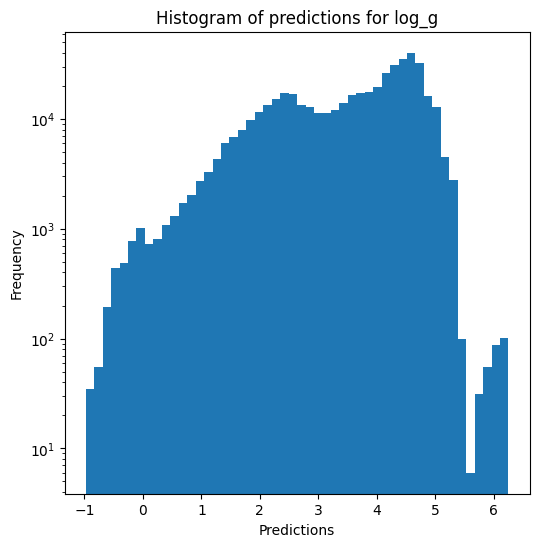

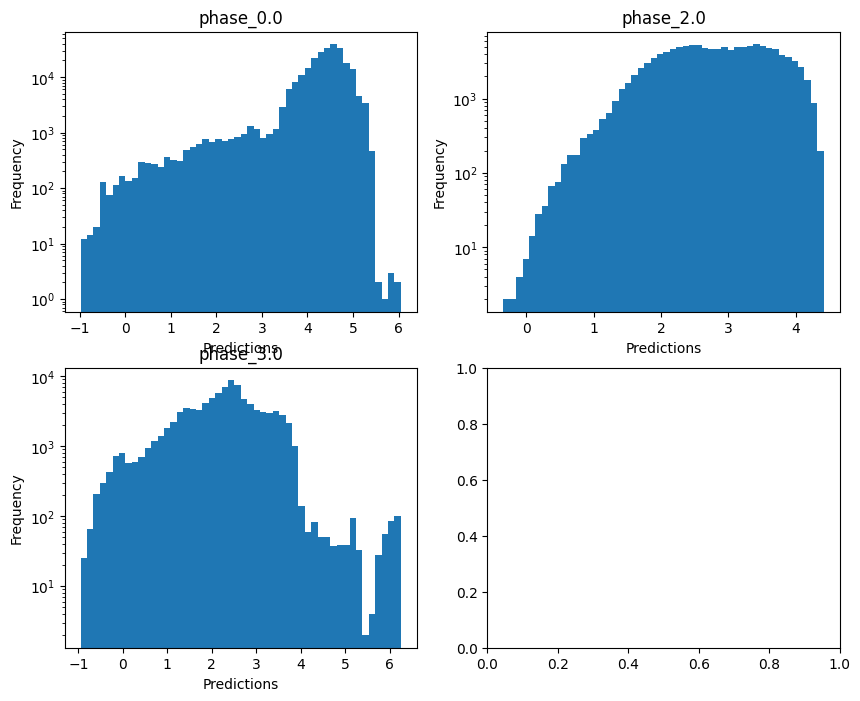

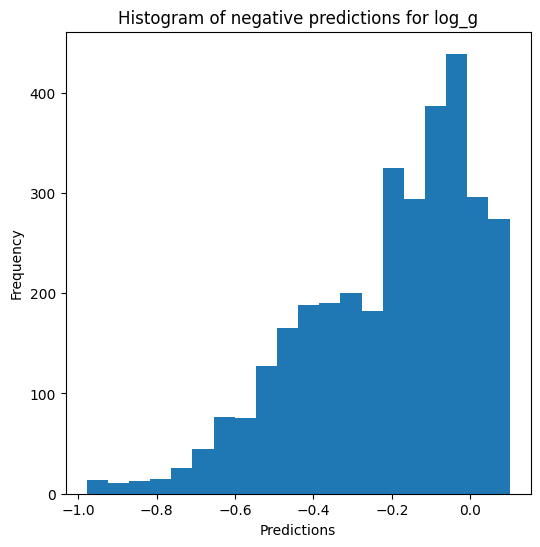


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.9183151403797886
  RMSE :  0.16431965779997781
  MAE :  0.03070488789978646
  MedAE :  0.0026077413664791216
  CORR :  0.9614204425767404
  MAX_ER :  2.788066779003325
  Percentiles : 
    75th percentile :  0.005673608294586708
    90th percentile :  0.013166341296974205
    95th percentile :  0.03347938145209197
    99th percentile :  0.8993242002382632

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.6524352649306052
  RMSE :  0.2894729209177083
  MAE :  0.12349303211022152
  MedAE :  0.0052744936012849575
  CORR :  0.8126475875403749
  MAX_ER :  2.2978126650602078
  Percentiles : 
    75th percentile :  0.06947056680133934
    90th percentile :  0.4869043814800708
    95th percentile :  0.7333716820526736
    99th percentile :  1.1599643208841683

radius results for the phase cate

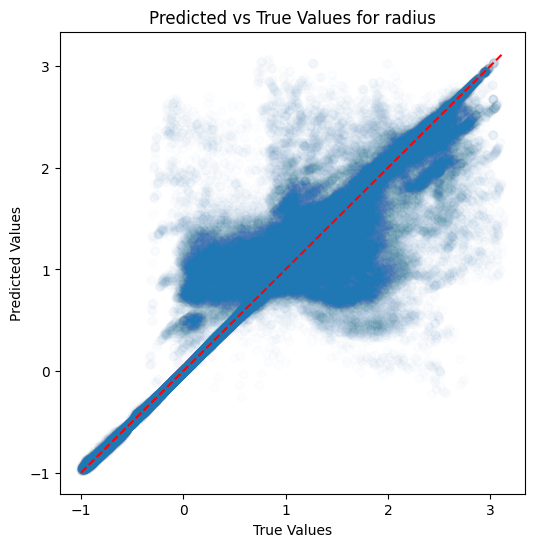

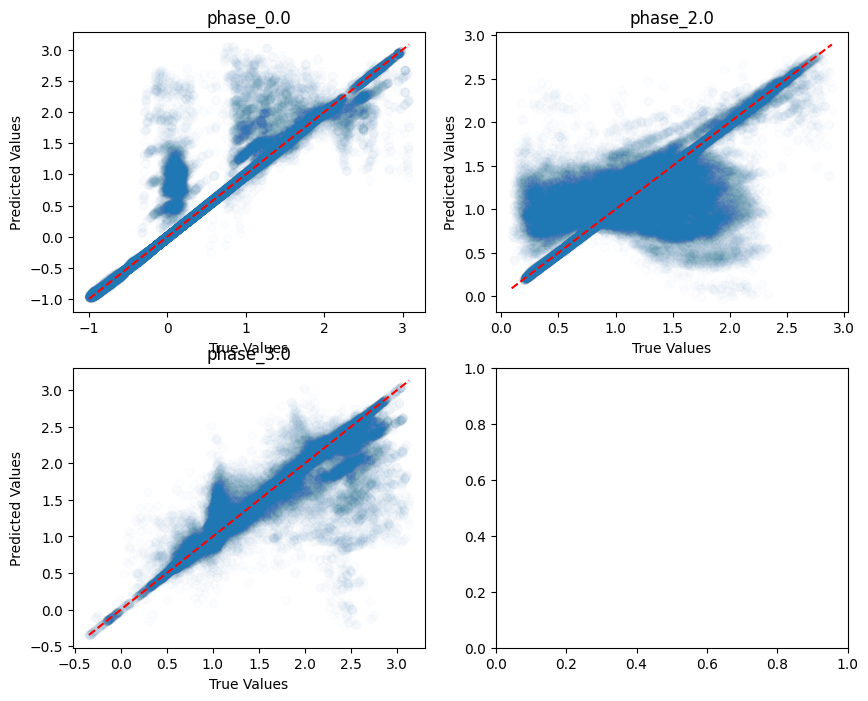

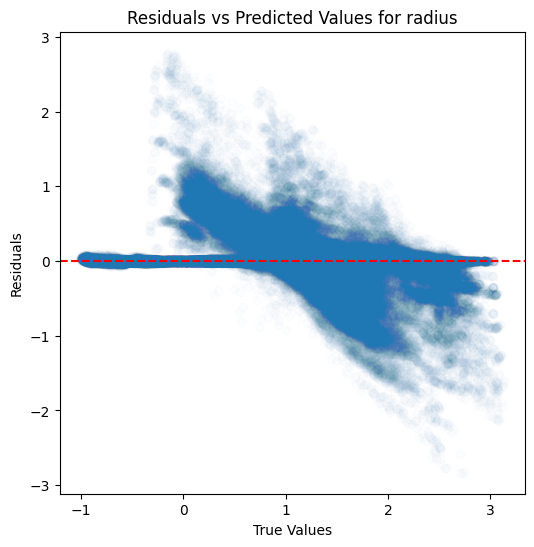

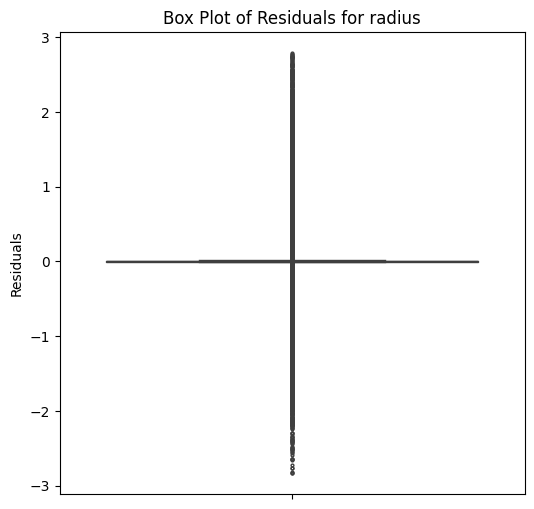

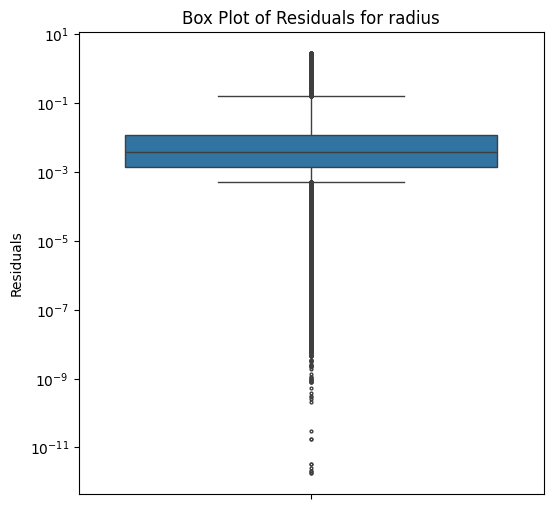

...

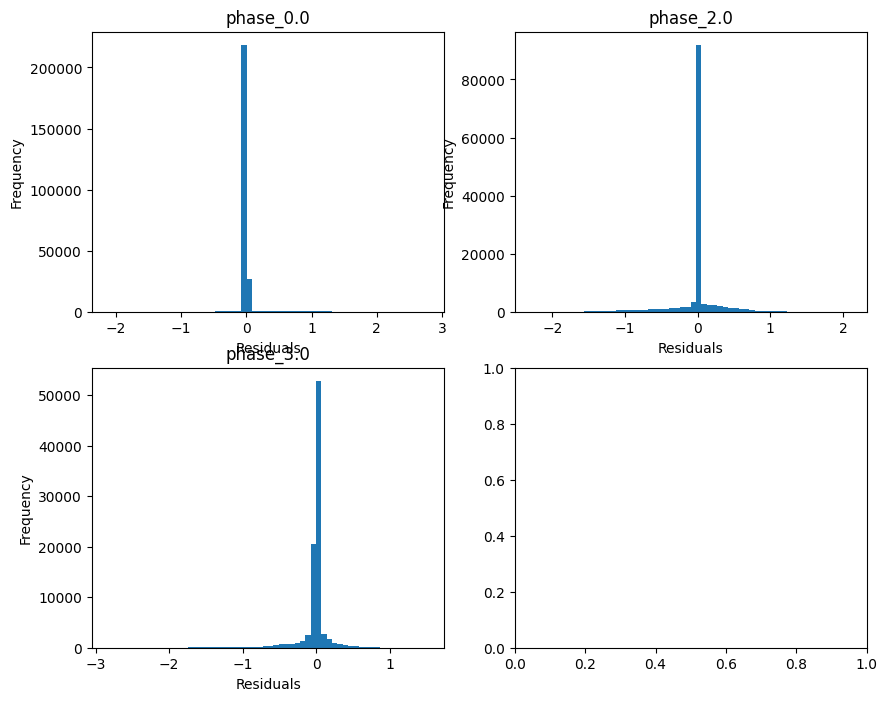

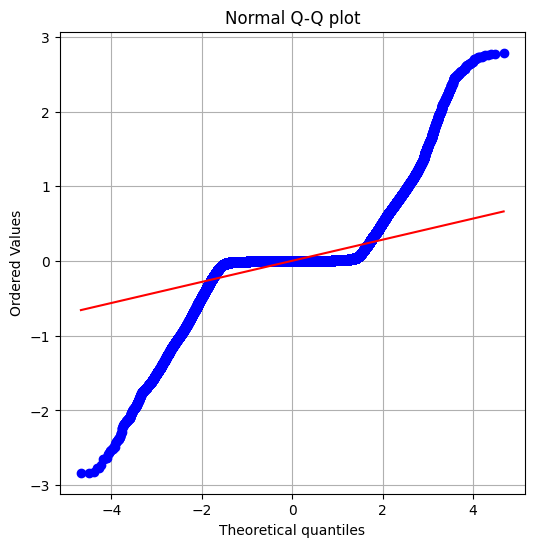

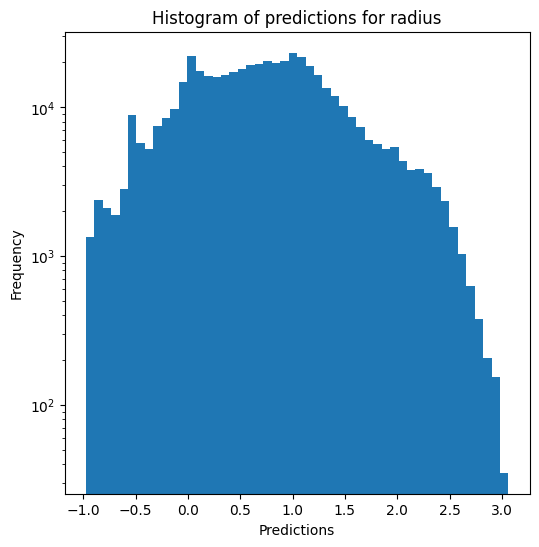

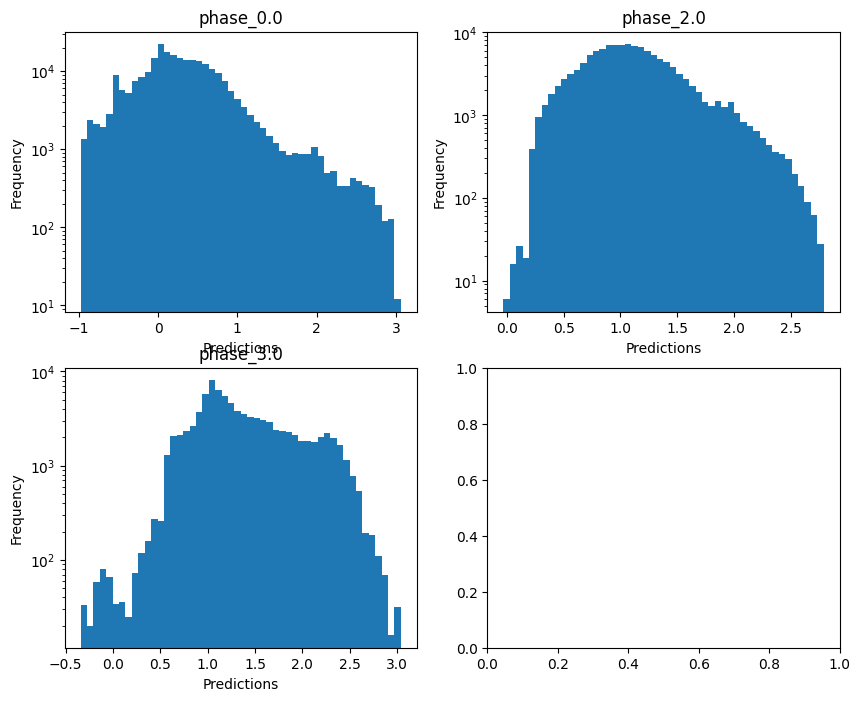

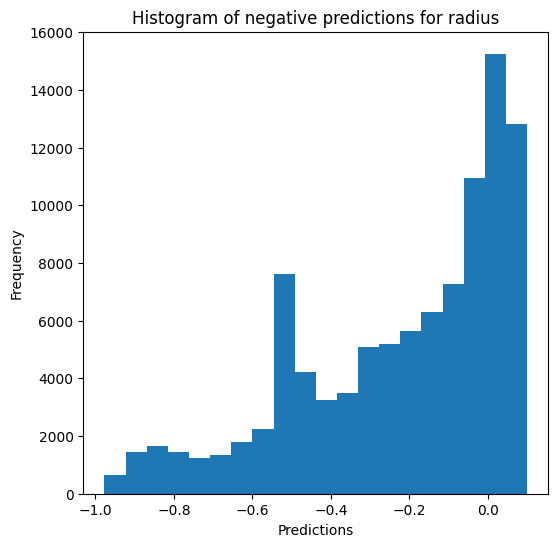

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.974284415249455
  RMSE :  0.05662617330987693
  MAE :  0.01022983428945772
  MedAE :  0.0006009555745529749
  CORR :  0.9871786907114718
  MAX_ER :  0.9149703953721264
  Percentiles : 
    75th percentile :  0.0015300986720403476
    90th percentile :  0.005011064488538123
    95th percentile :  0.02252867358283723
    99th percentile :  0.3070188454362579

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9749101598261279
  RMSE :  0.05013168232796197
  MAE :  0.019877543980195988
  MedAE :  0.0020768630827014967
  CORR :  0.9873793086840453
  MAX_ER :  0.7055334138123719
  Percentiles : 
    75th percentile :  0.011266010732195797
    90th percentile :  0.0687026237139340

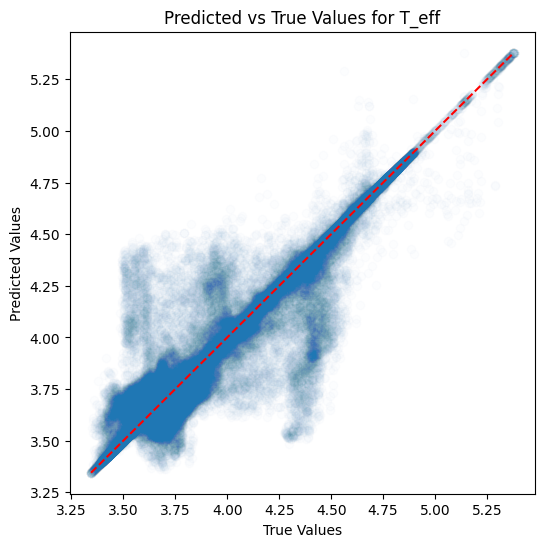

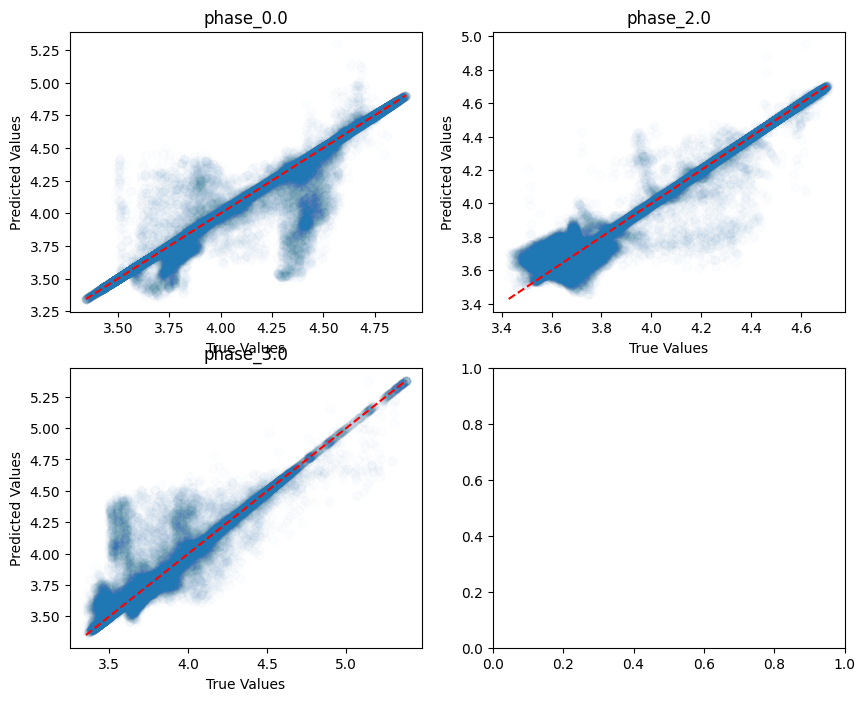

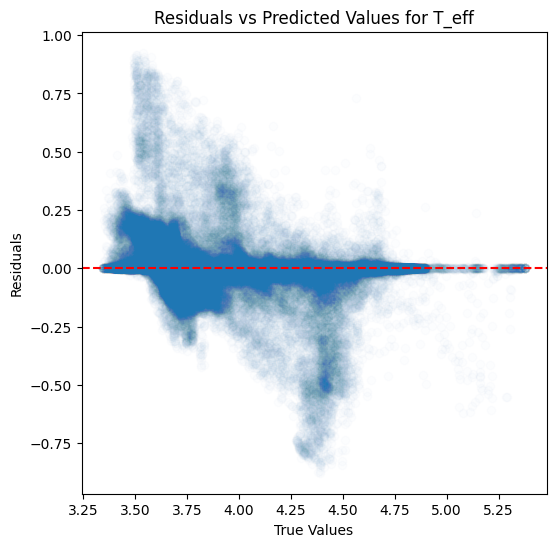

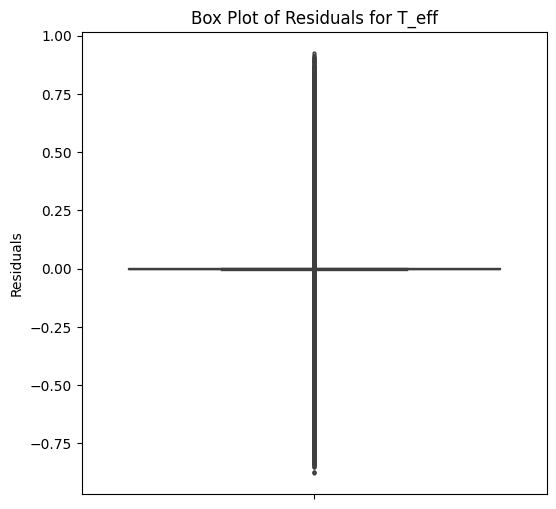

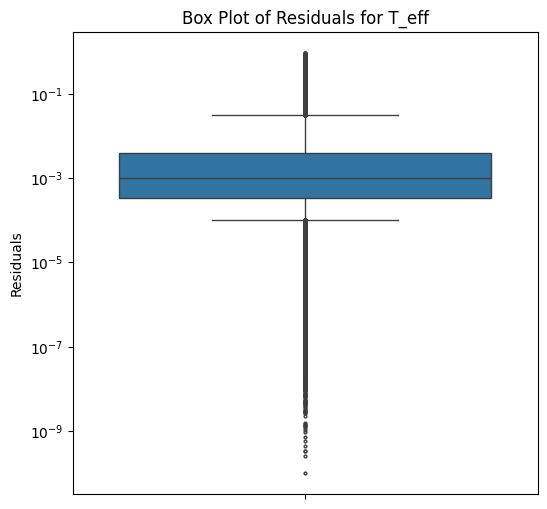

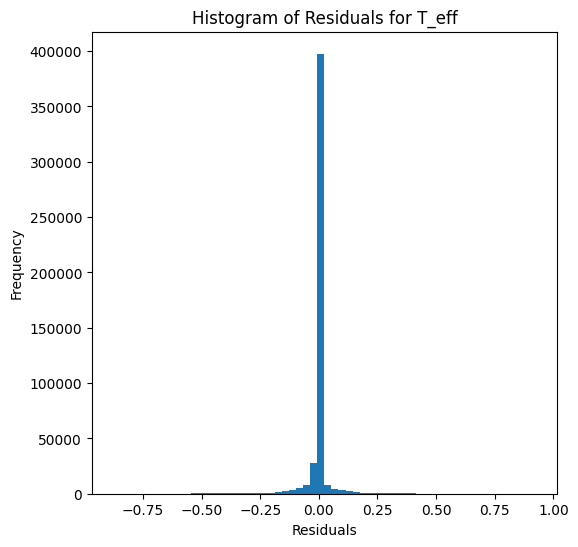

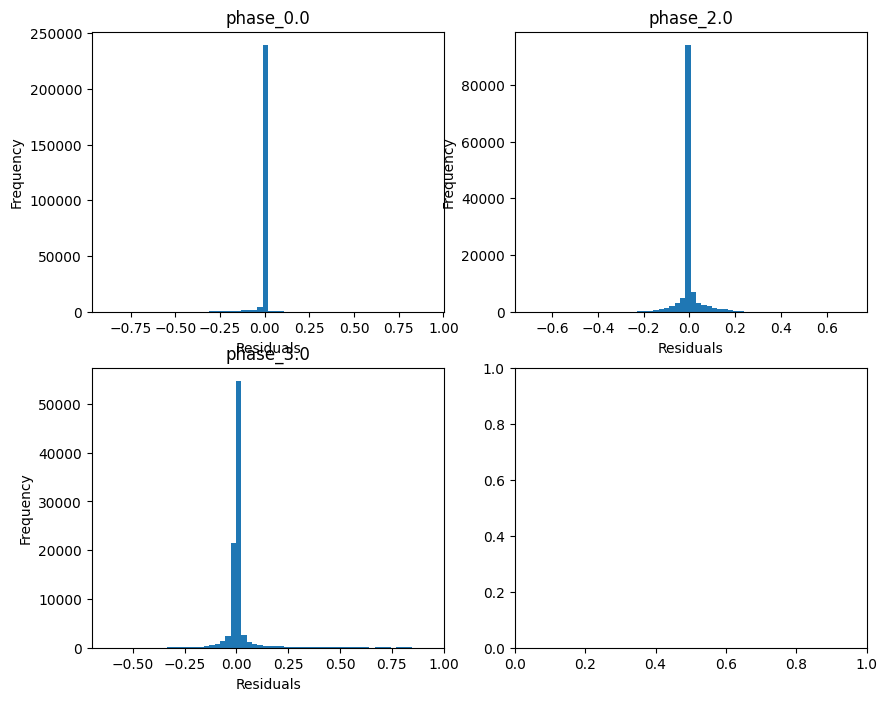

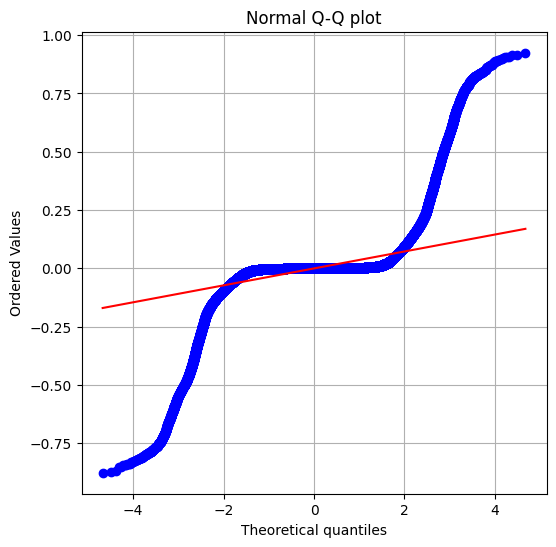

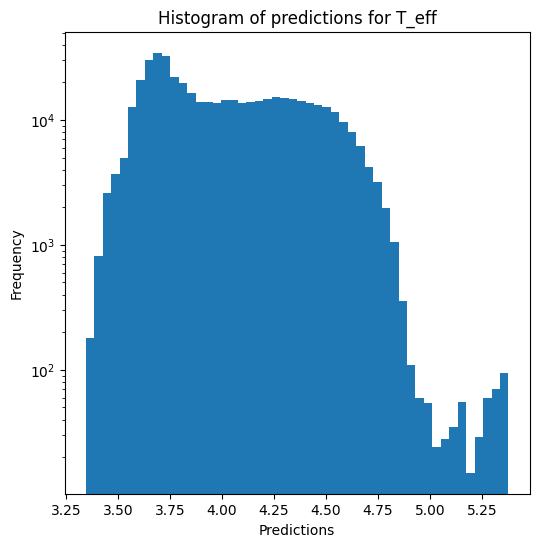

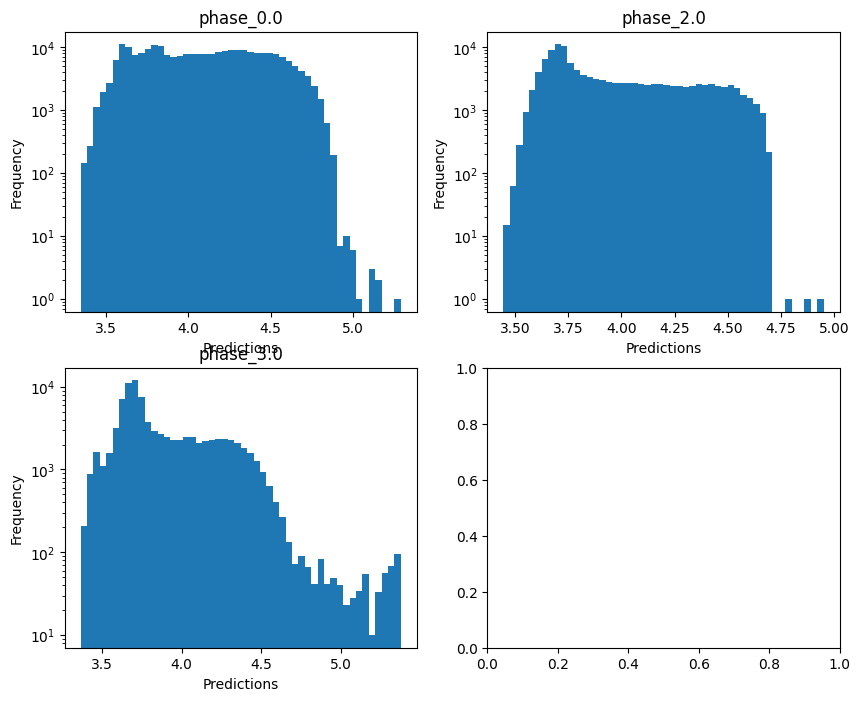


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.6563309508568553
  RMSE :  0.37054226825213293
  MAE :  0.06803496300258531
  MedAE :  0.0017673862896612214
  CORR :  0.8639749511783242
  MAX_ER :  5.575023210374365
  Percentiles : 
    75th percentile :  0.005296567990151102
    90th percentile :  0.019338078335956344
    95th percentile :  0.1405925564797915
    99th percentile :  2.1912725423679063

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.38804695967478287
  RMSE :  0.7123979735088546
  MAE :  0.3011889892198139
  MedAE :  0.01018441230335343
  CORR :  0.6641131757934536
  MAX_ER :  4.589700979030136
  Percentiles : 
    75th percentile :  0.13765254310171204
    90th percentile :  1.2326195374807873
    95th percentile :  1.8598661878826703
    99th percentile :  2.8671173221298156

log_g results for the phase category wi

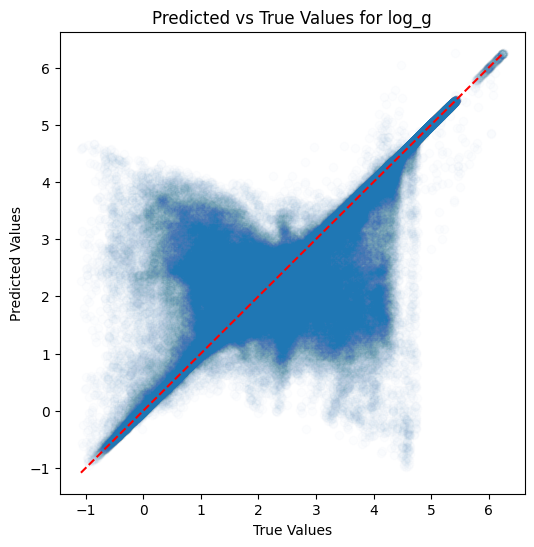

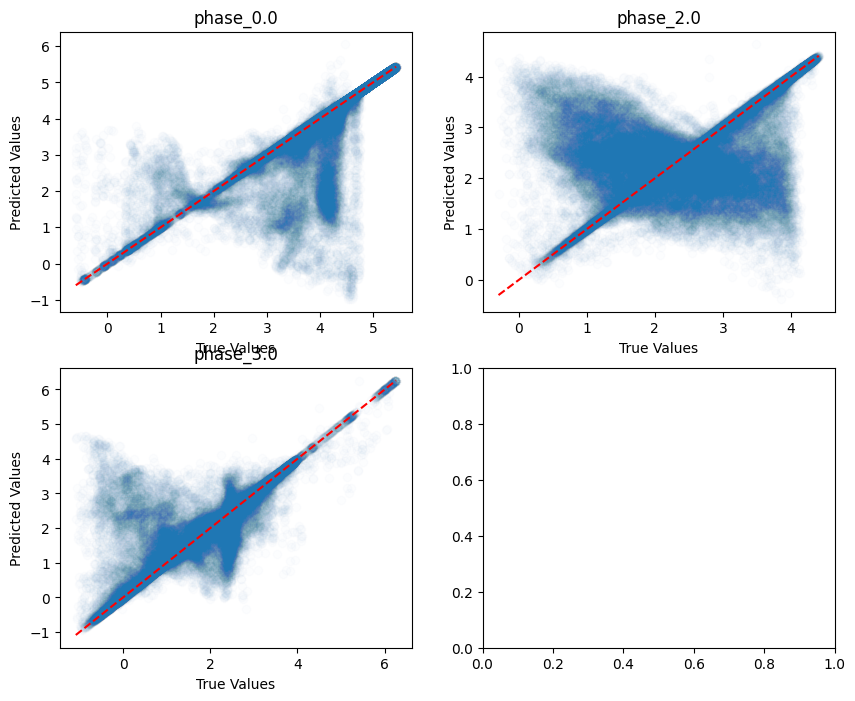

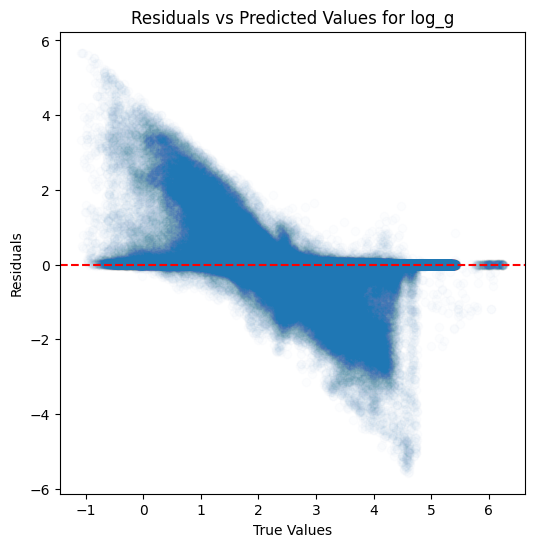

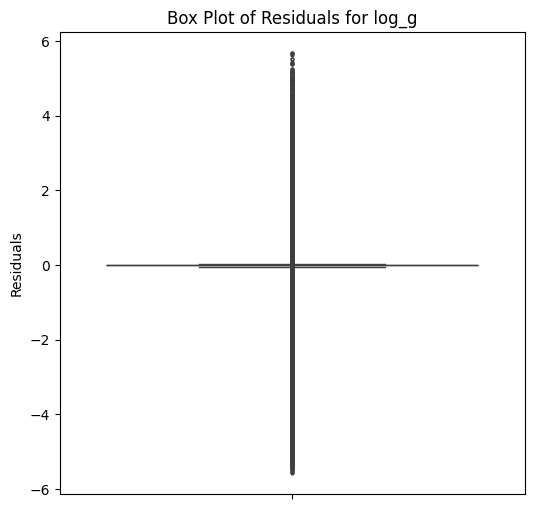

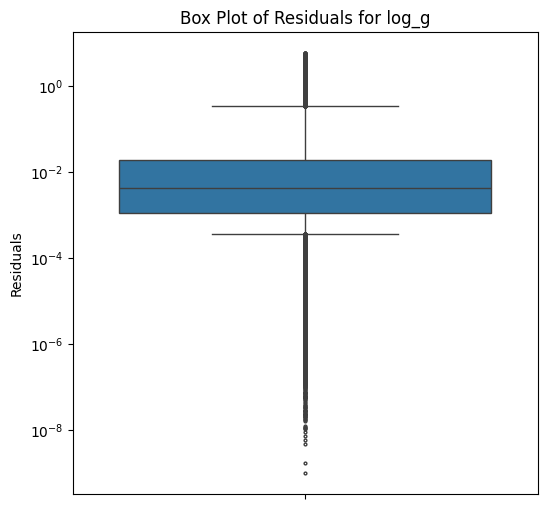

...

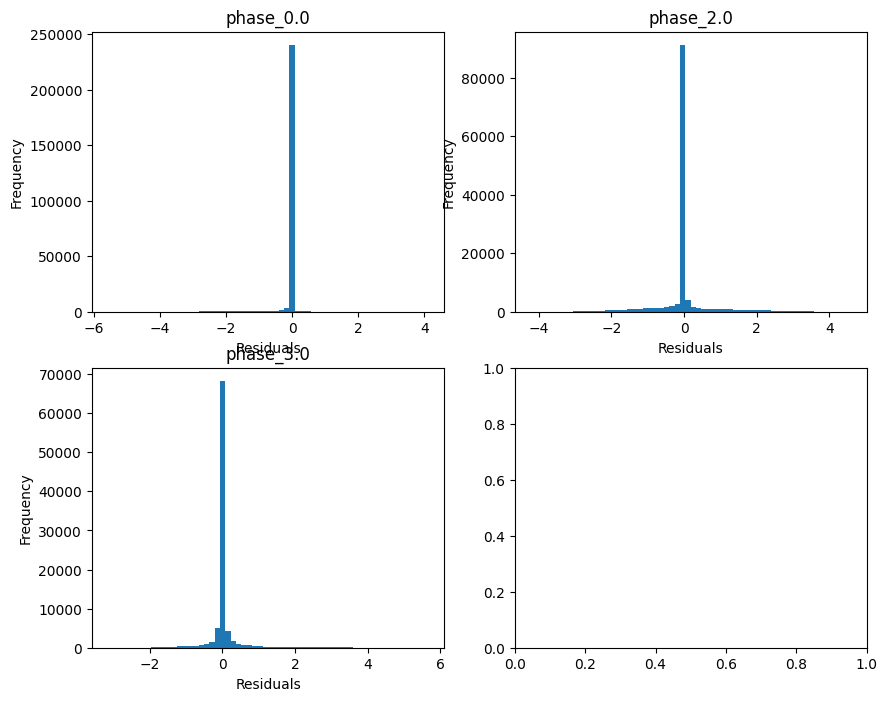

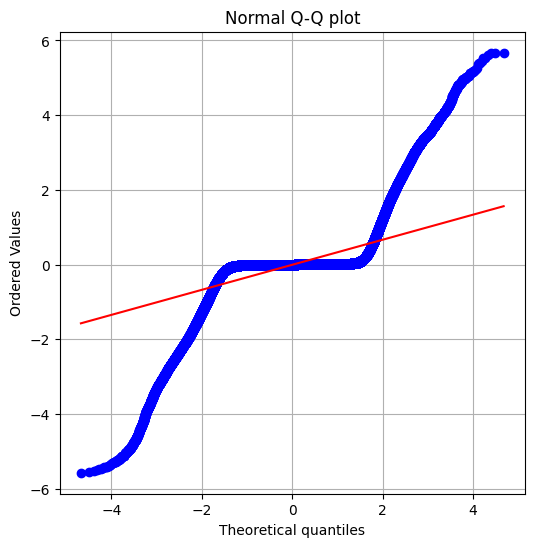

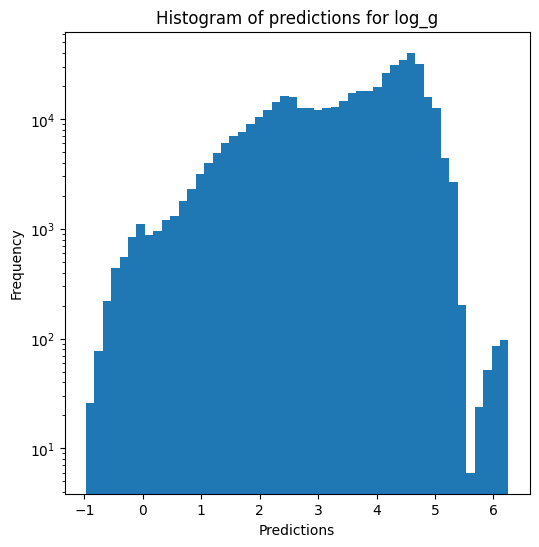

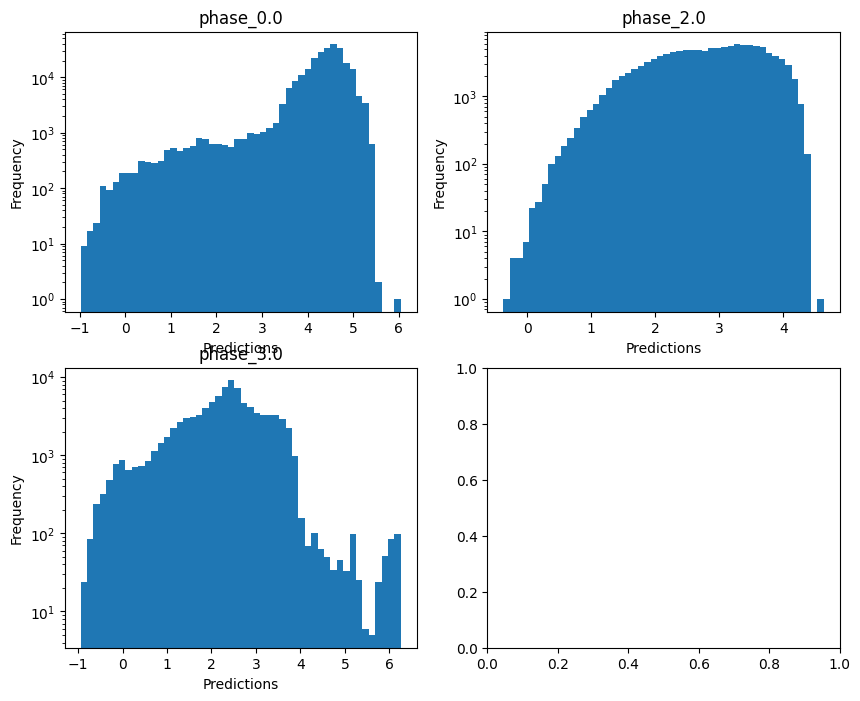

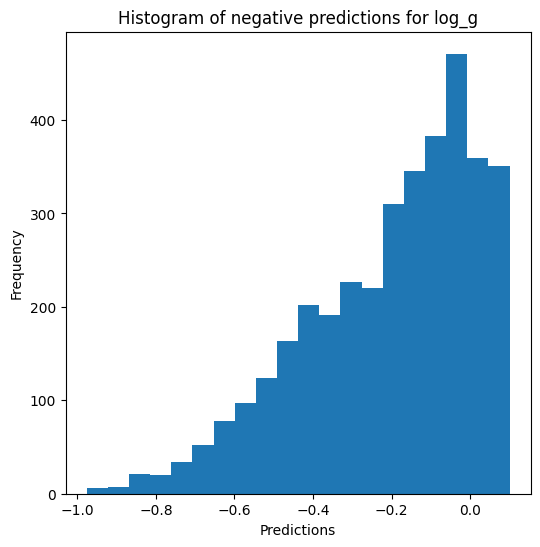


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8961531518373833
  RMSE :  0.18546932202127558
  MAE :  0.034391975482250224
  MedAE :  0.0011666938101525248
  CORR :  0.9516381646896326
  MAX_ER :  2.789263327787865
  Percentiles : 
    75th percentile :  0.003224031250238041
    90th percentile :  0.010727710276726405
    95th percentile :  0.07080226344560747
    99th percentile :  1.097033342103201

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.4736281752365703
  RMSE :  0.3561915998437559
  MAE :  0.1505967467498467
  MedAE :  0.005100899664603142
  CORR :  0.7213476731217772
  MAX_ER :  2.2949618622133015
  Percentiles : 
    75th percentile :  0.06884338198710505
    90th percentile :  0.6163177945341207
    95th percentile :  0.9300106914136828
    99th percentile :  1.4336013301594996

radius results for the phase catego

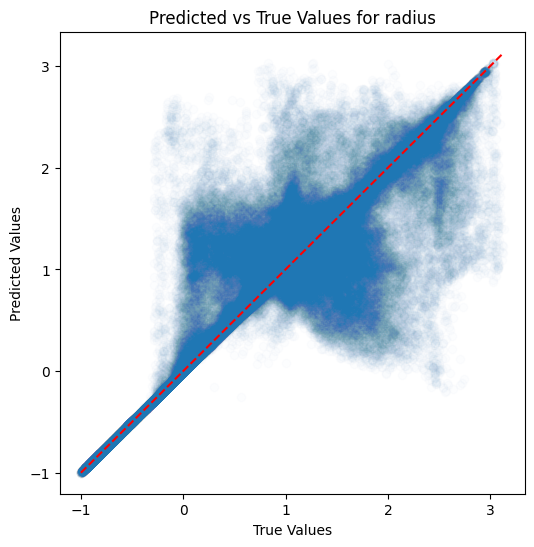

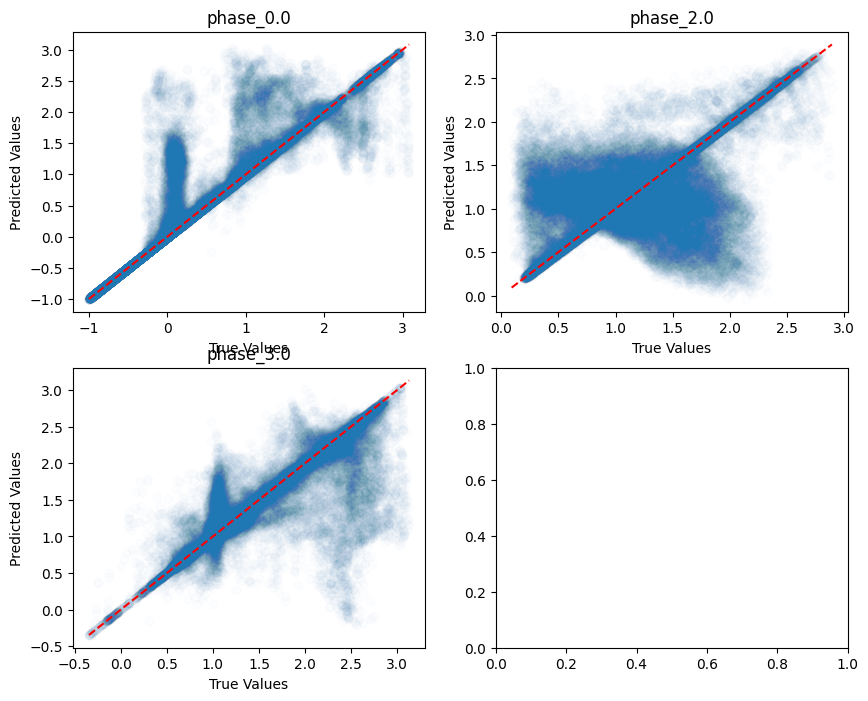

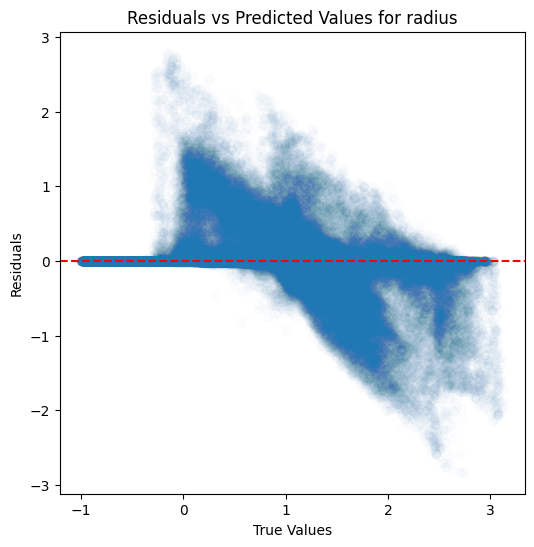

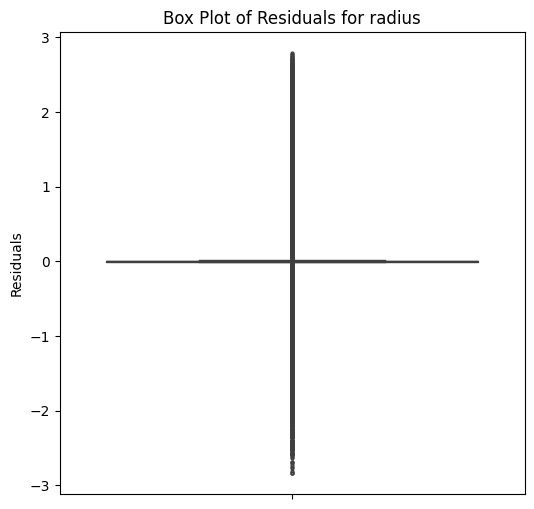

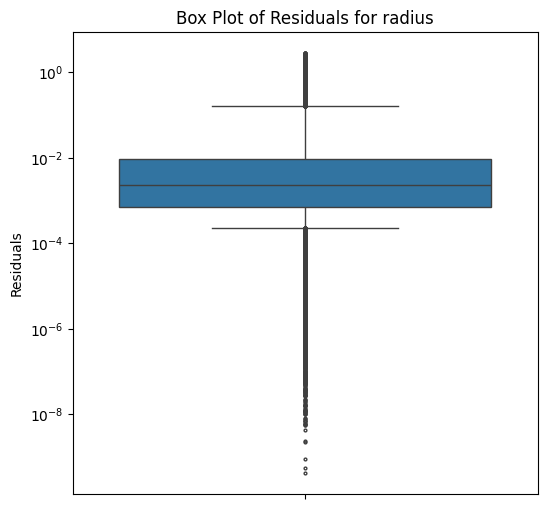

...

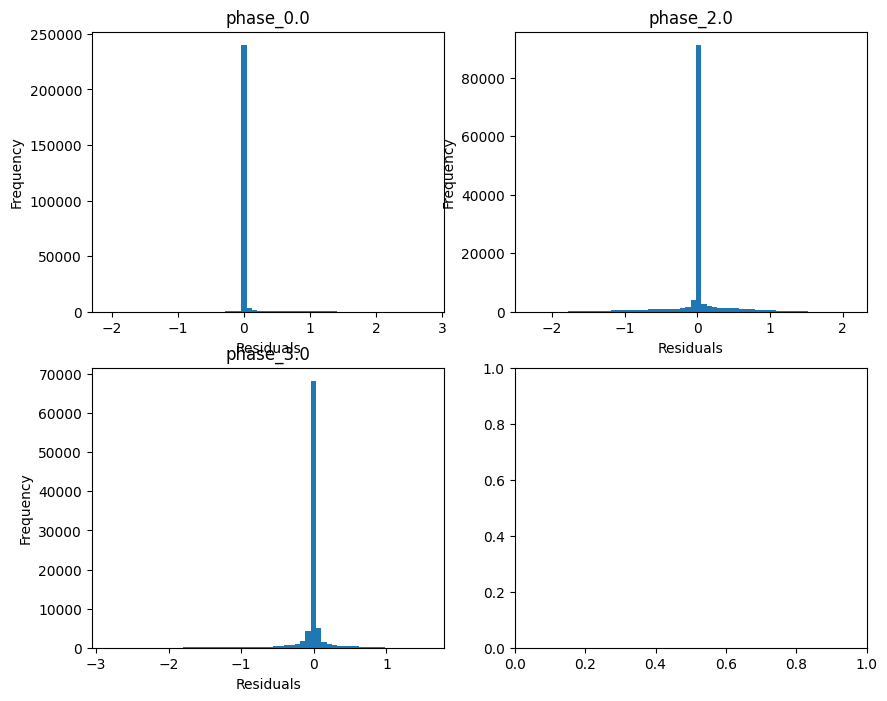

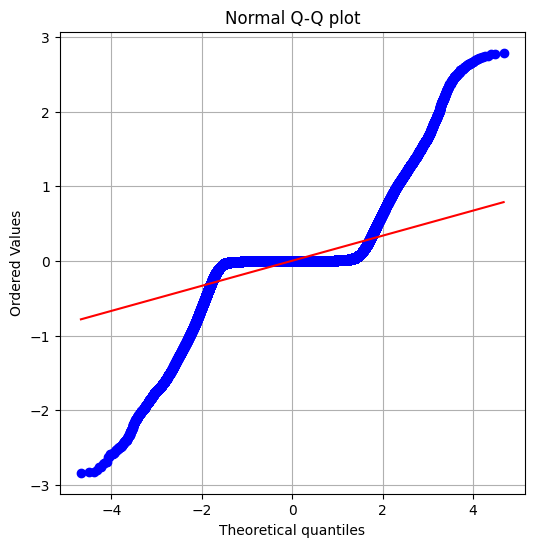

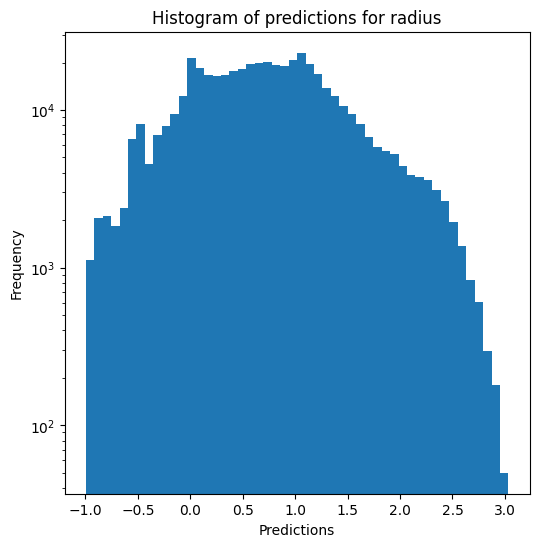

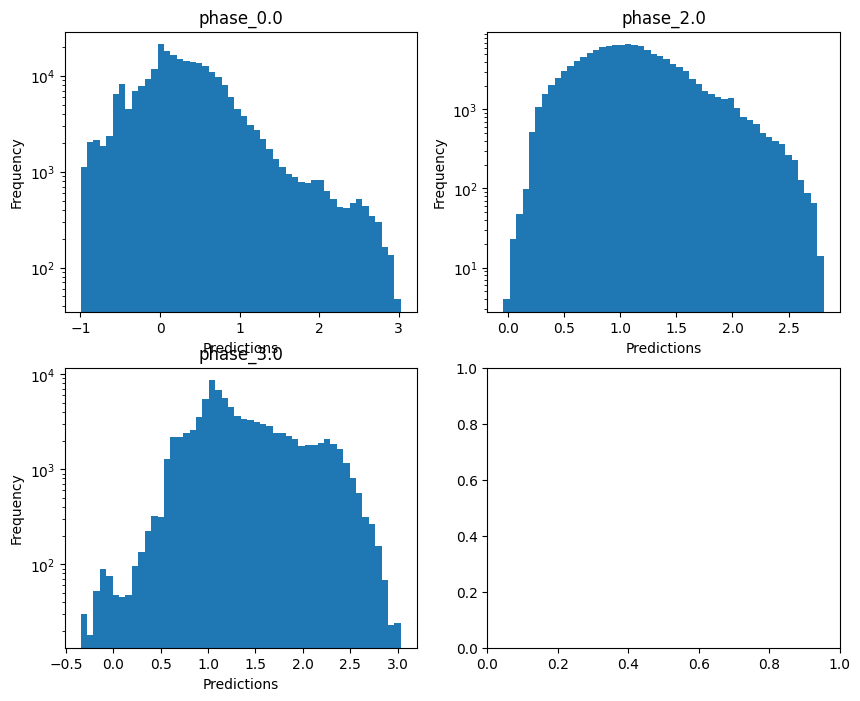

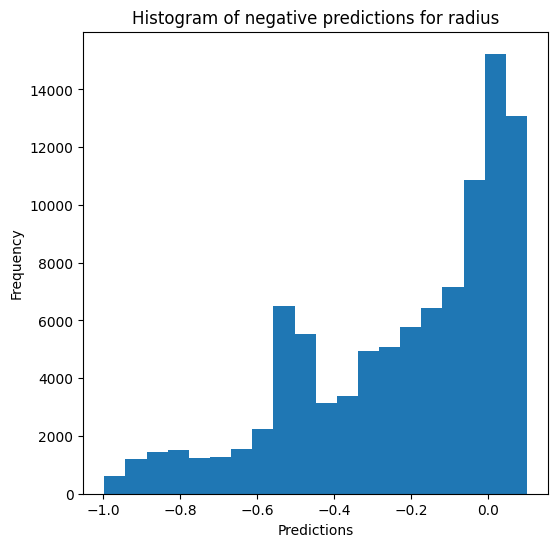

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9410809021703103
  RMSE :  0.09204812799920381
  MAE :  0.050773972186110614
  MedAE :  0.016009488800638128
  CORR :  0.9703614392032379
  MAX_ER :  0.7858403193142509
  Percentiles : 
    75th percentile :  0.0622734725199503
    90th percentile :  0.15681240936084073
    95th percentile :  0.22127754848116052
    99th percentile :  0.34583208916691555

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.8744853198333601
  RMSE :  0.11414830869092125
  MAE :  0.0851568577236038
  MedAE :  0.06455674415759205
  CORR :  0.9358424119856497
  MAX_ER :  0.5065591748628897
  Percentiles : 
    75th percentile :  0.11851926231811705
    90th percentile :  0.18809654840388854
    9

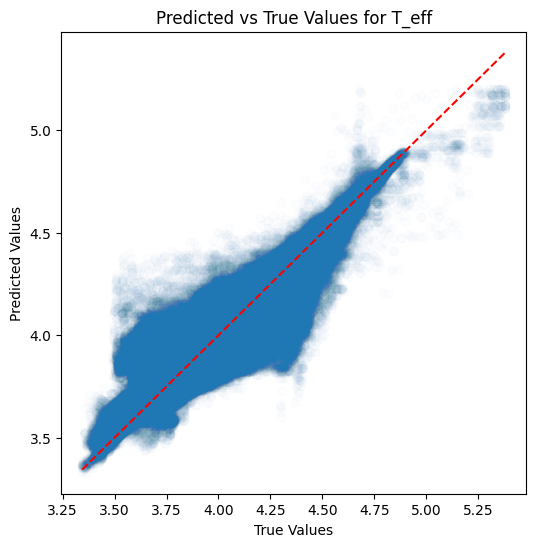

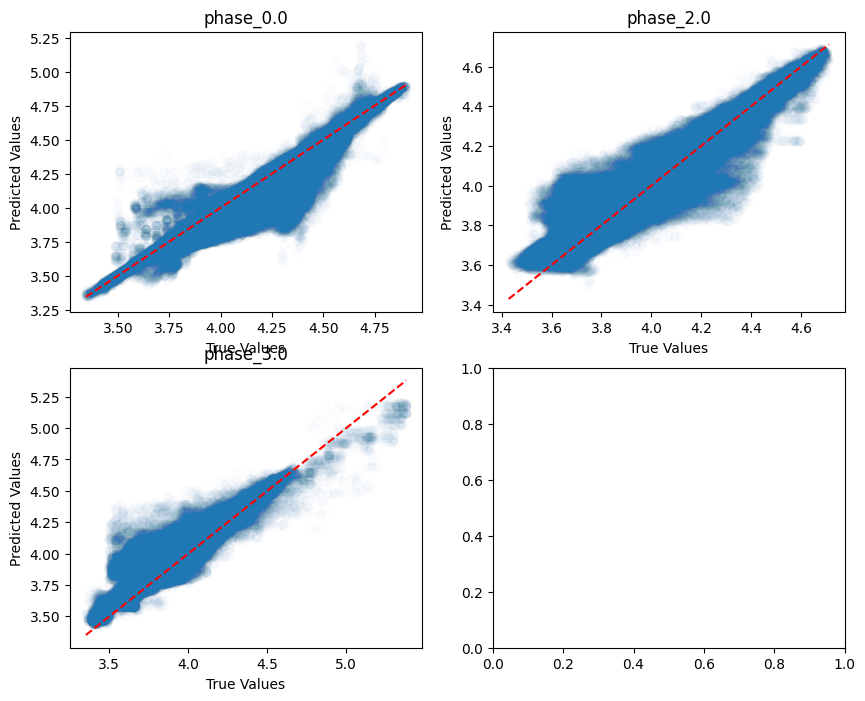

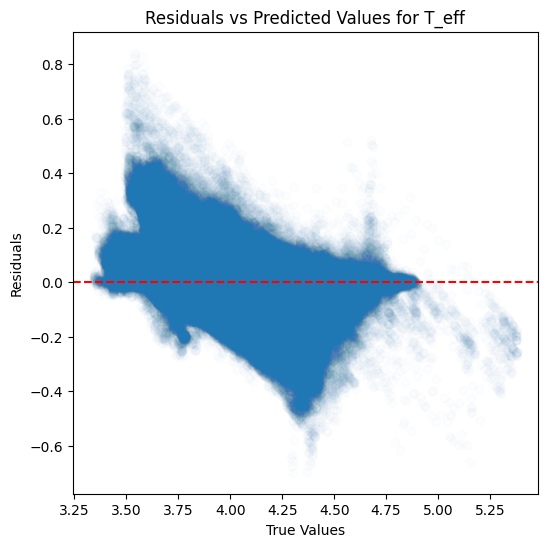

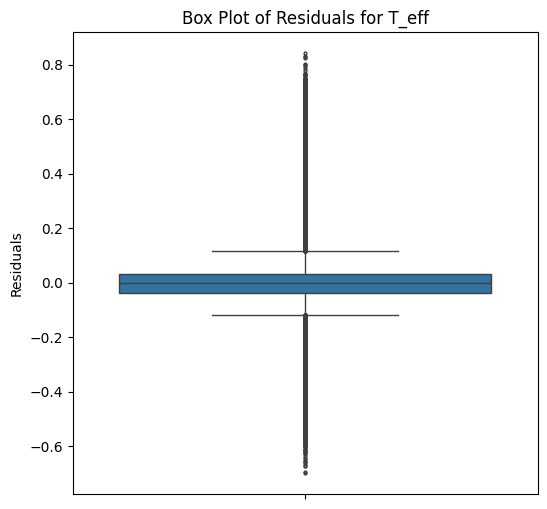

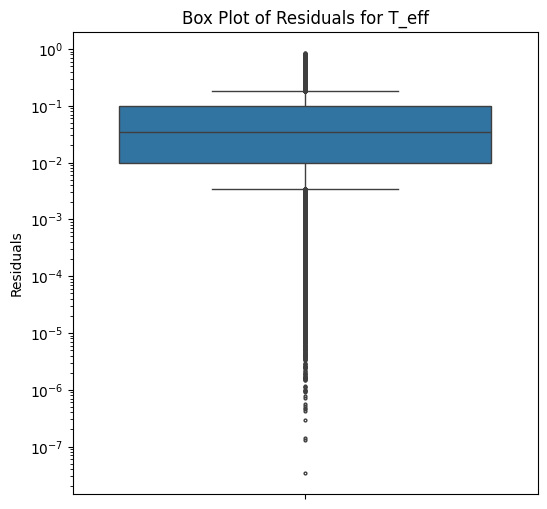

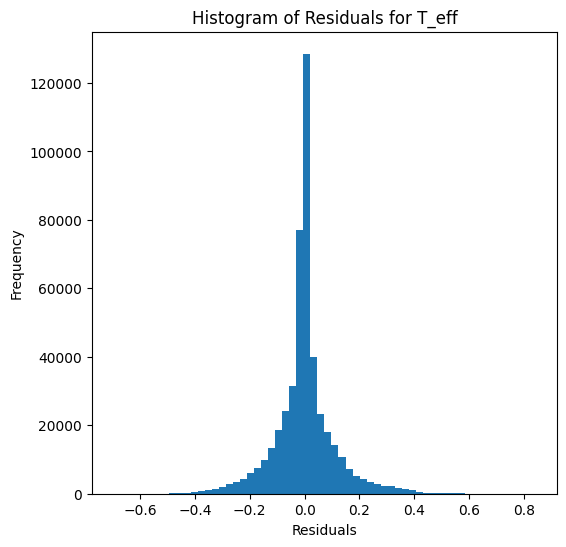

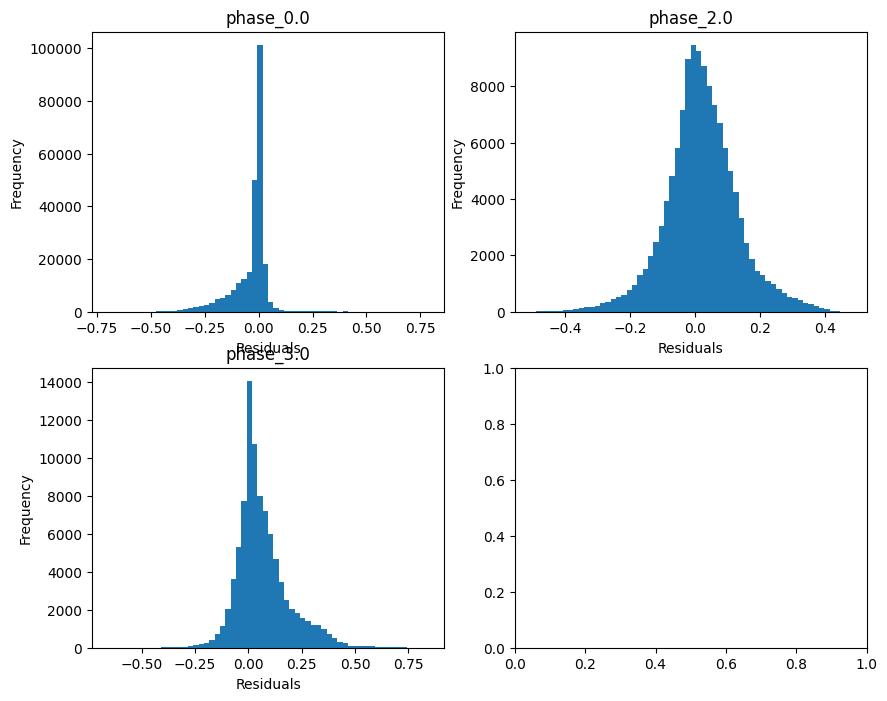

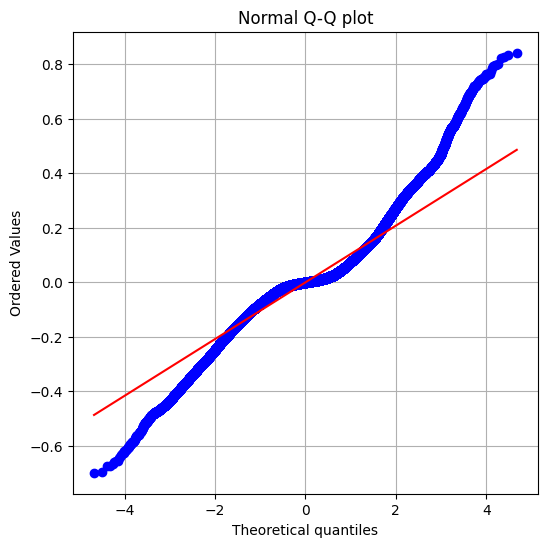

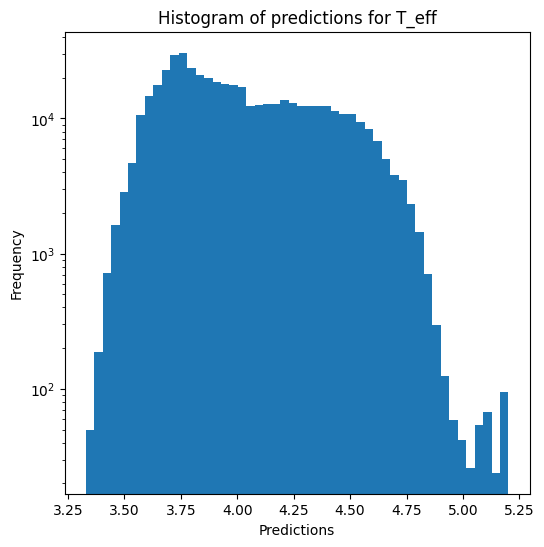

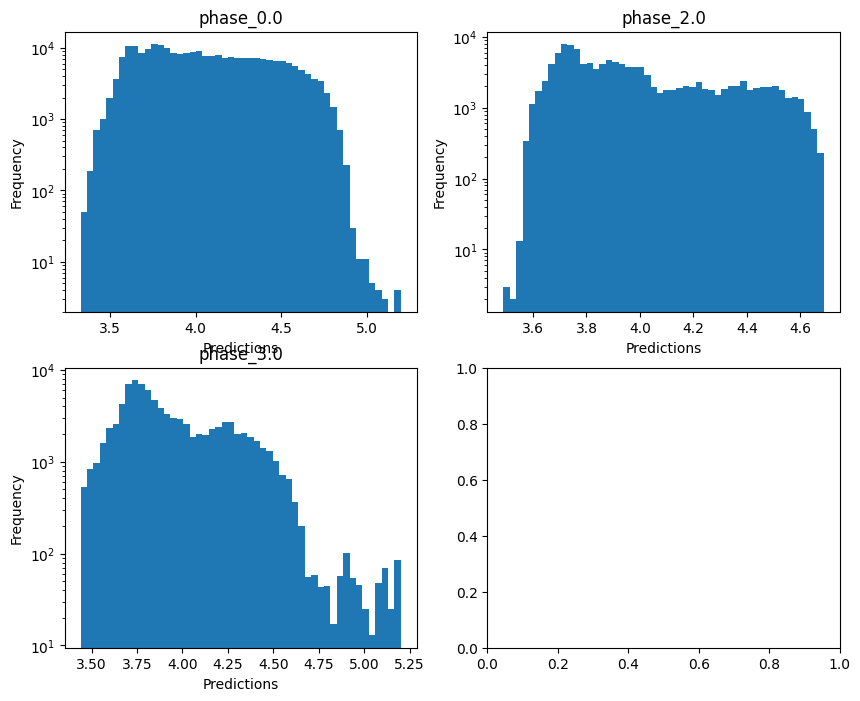


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.44645242431657517
  RMSE :  0.5081906053245573
  MAE :  0.28332604493619384
  MedAE :  0.08375350096342515
  CORR :  0.8348530960370989
  MAX_ER :  4.796913001595129
  Percentiles : 
    75th percentile :  0.37184458911236096
    90th percentile :  0.886663639477277
    95th percentile :  1.188925896717784
    99th percentile :  1.7254712211204082

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.41844544202242595
  RMSE :  0.7007639471279791
  MAE :  0.5265784044444262
  MedAE :  0.39549993837053865
  CORR :  0.6471204358980626
  MAX_ER :  3.7271737976631583
  Percentiles : 
    75th percentile :  0.768789563921905
    90th percentile :  1.173983339683651
    95th percentile :  1.4442045218075525
    99th percentile :  2.027370779667253

log_g results for the phase category with a value

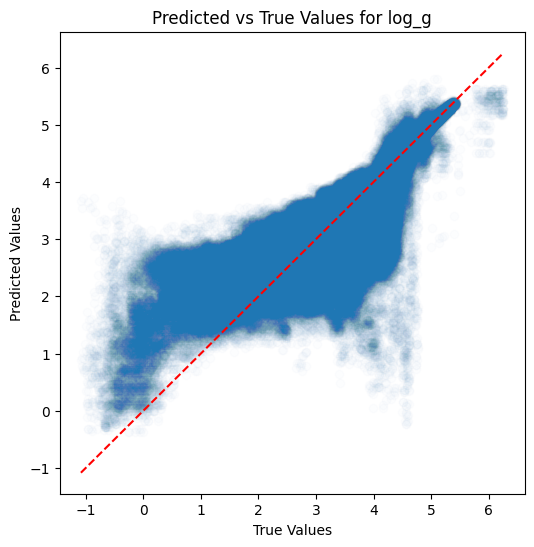

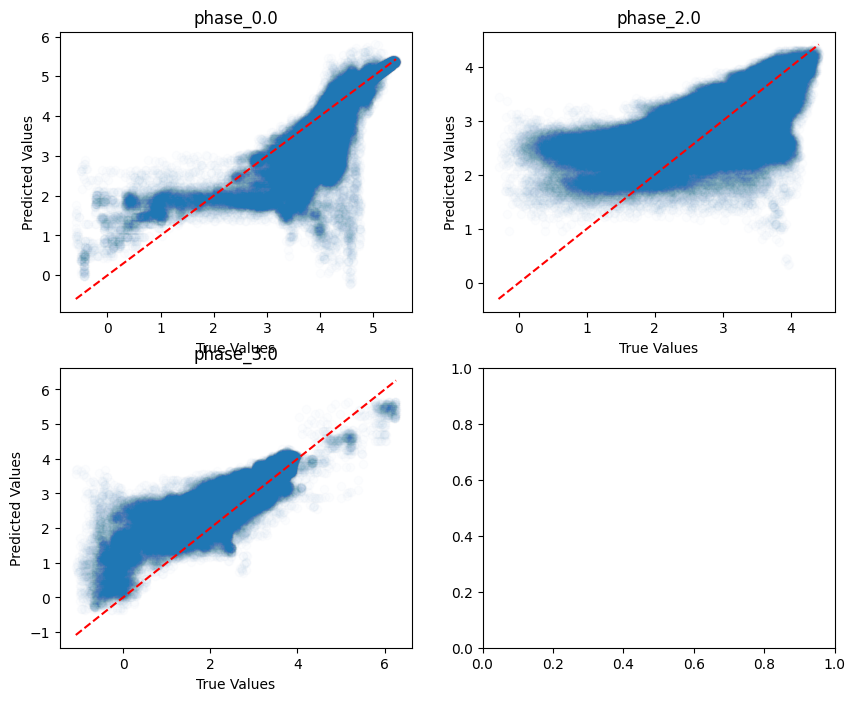

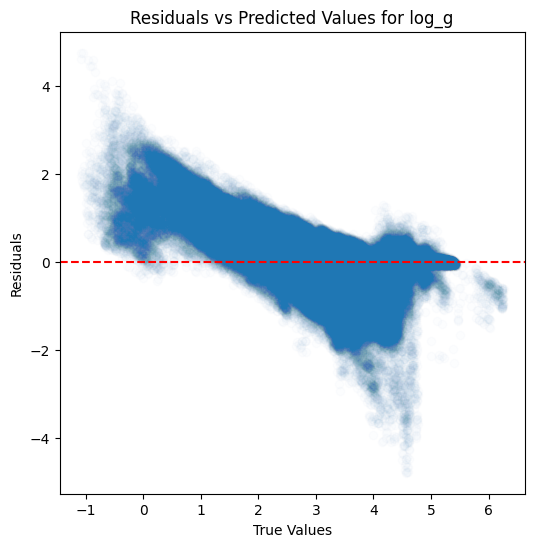

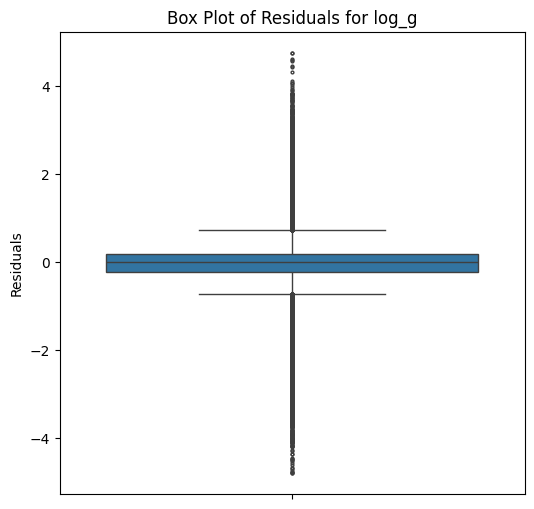

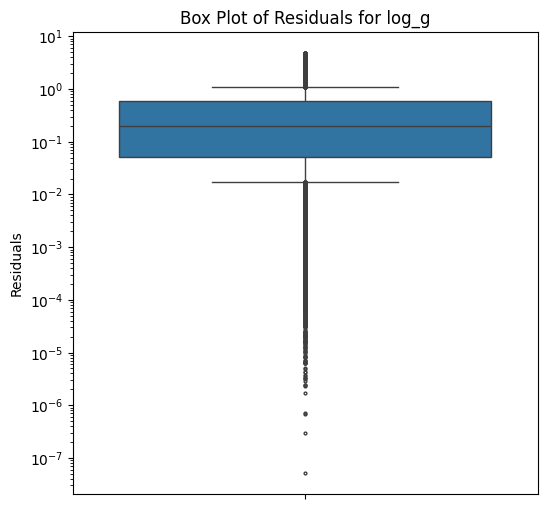

...

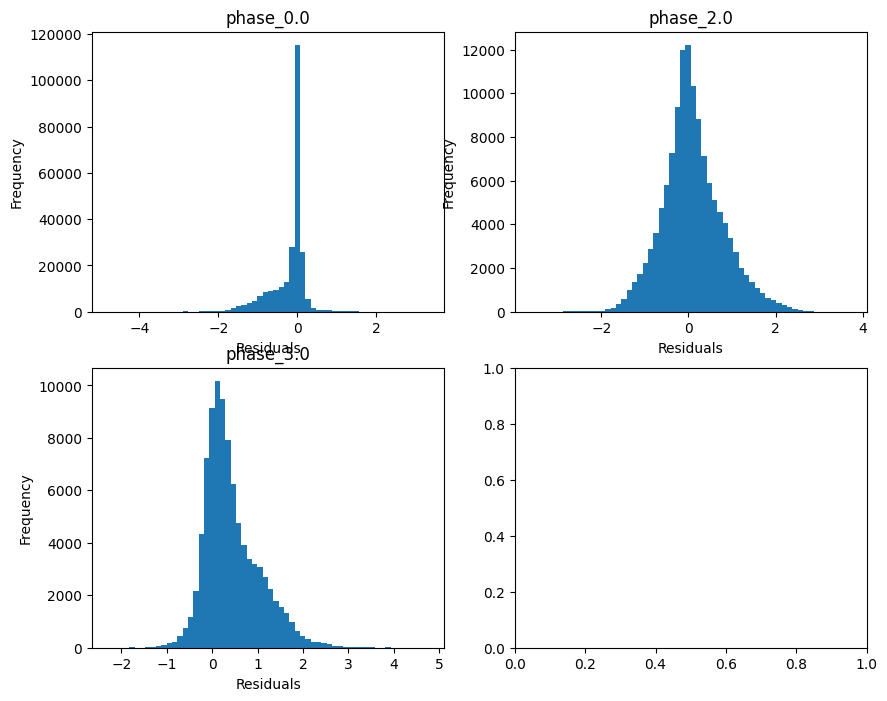

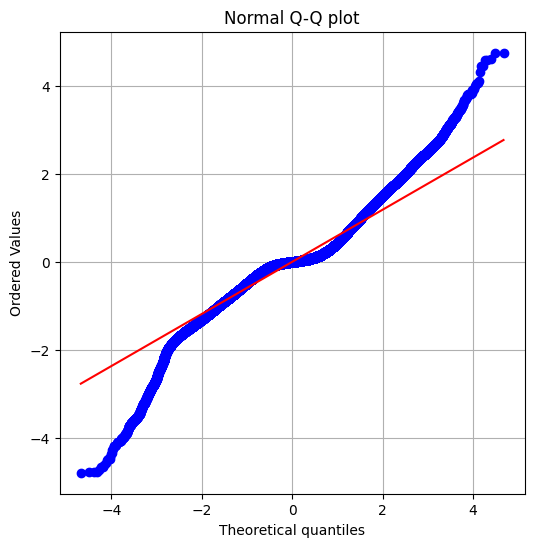

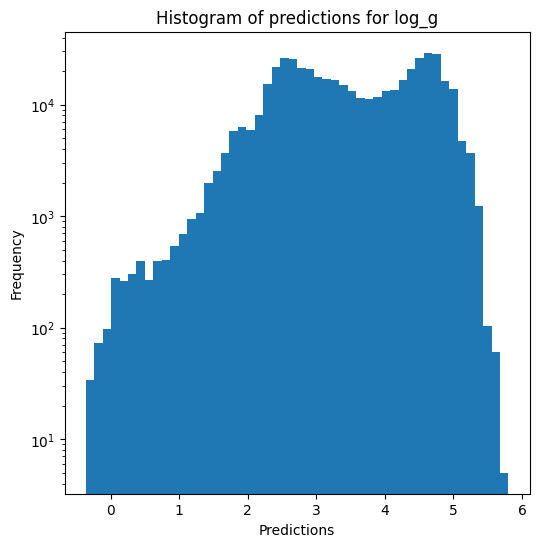

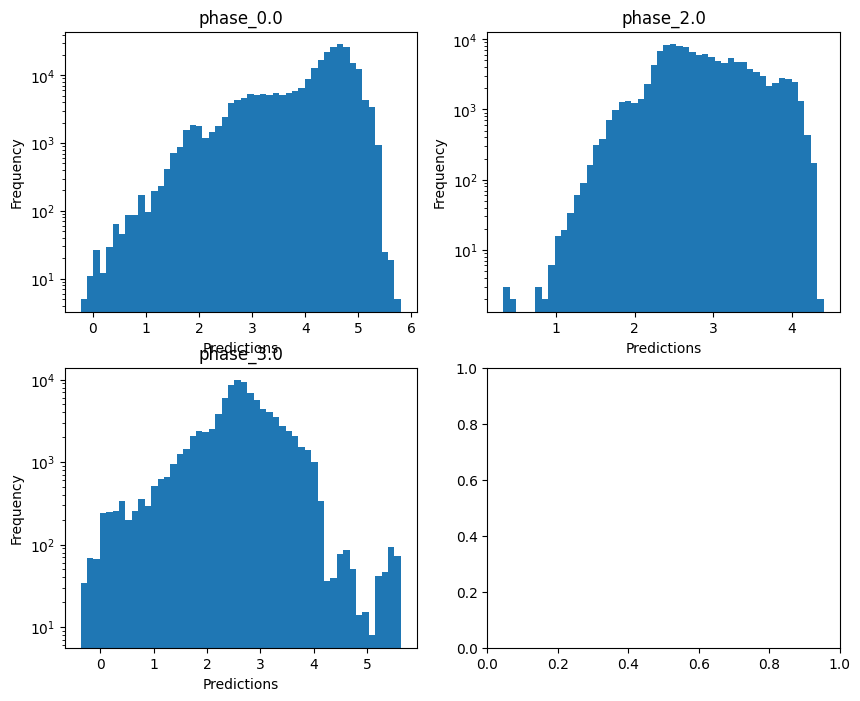

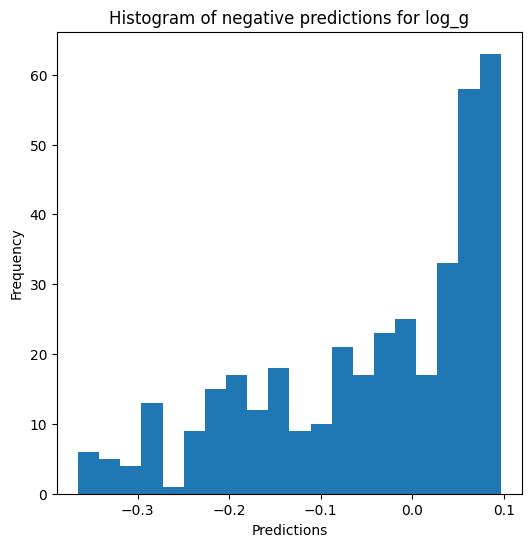


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8323670112776573
  RMSE :  0.25476258019059805
  MAE :  0.1413900976265402
  MedAE :  0.03920323278550922
  CORR :  0.9316678916643752
  MAX_ER :  2.448665856245023
  Percentiles : 
    75th percentile :  0.18534813178879378
    90th percentile :  0.44504135971814257
    95th percentile :  0.5978493061914039
    99th percentile :  0.8608596021068368

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.49632700428706644
  RMSE :  0.3515551948260074
  MAE :  0.2641720579900968
  MedAE :  0.19819338942339515
  CORR :  0.7058041407041973
  MAX_ER :  1.9725703090557898
  Percentiles : 
    75th percentile :  0.3852646471438793
    90th percentile :  0.5894289390915031
    95th percentile :  0.7254149583716943
    99th percentile :  1.0173096677418232

radius results for the phase category with

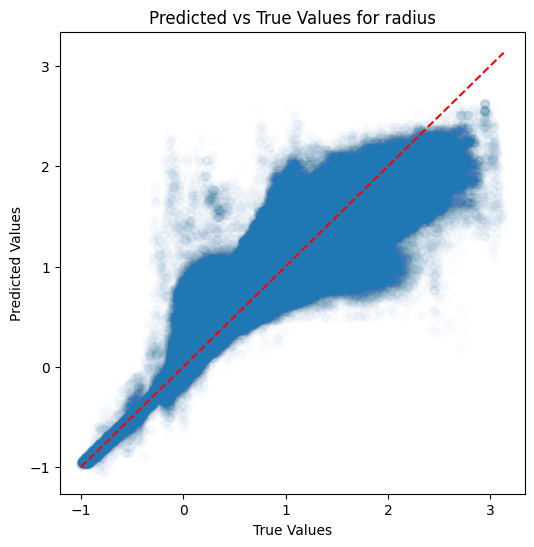

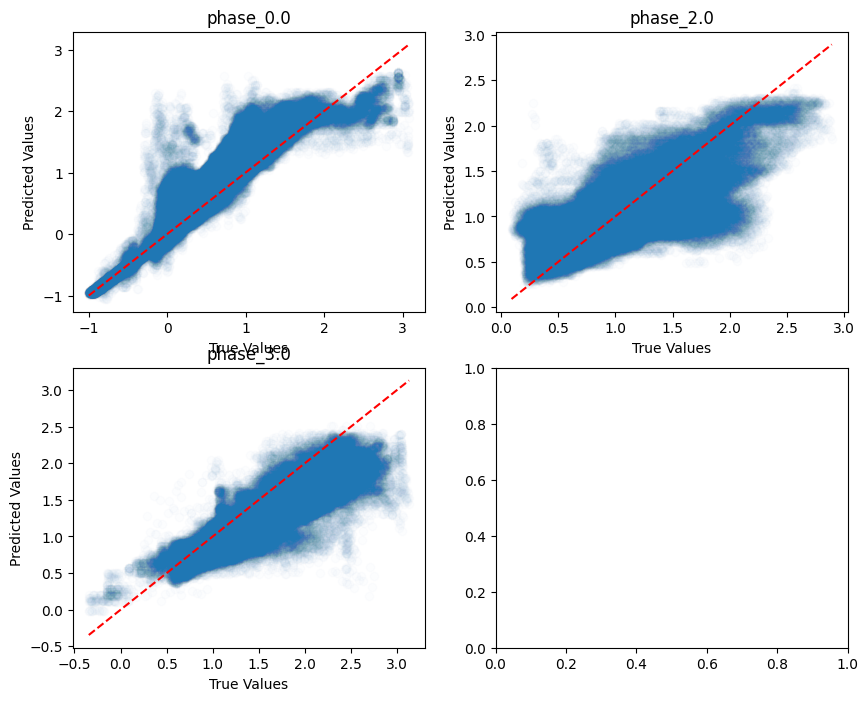

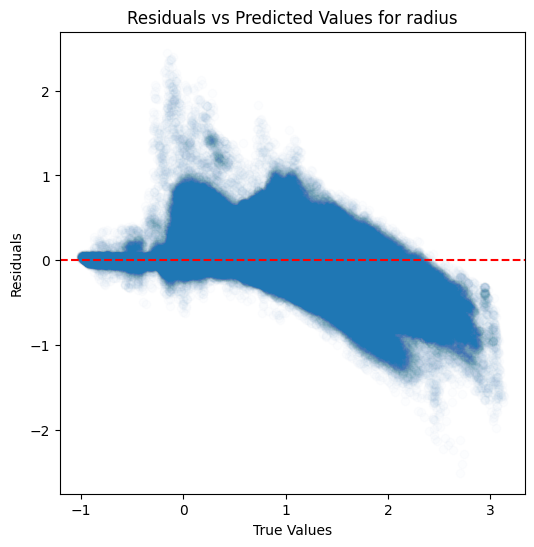

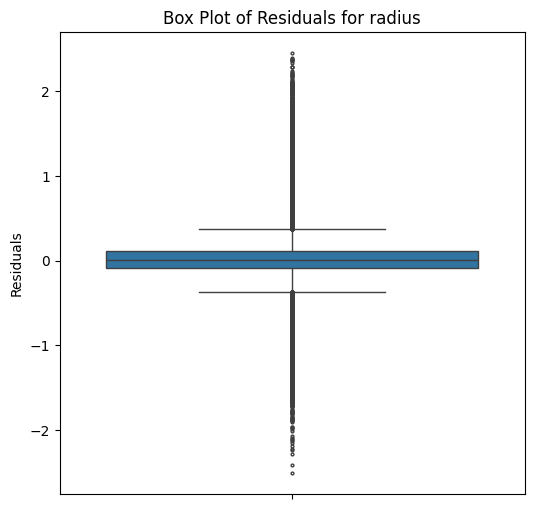

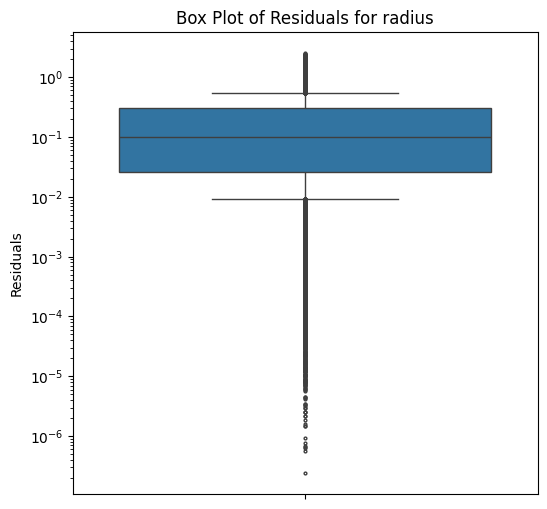

...

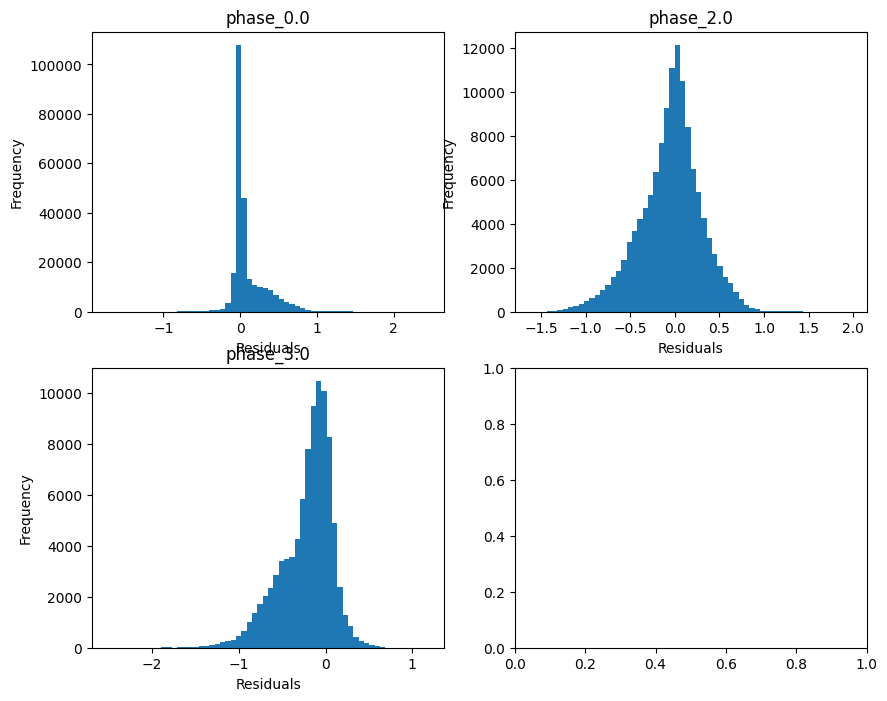

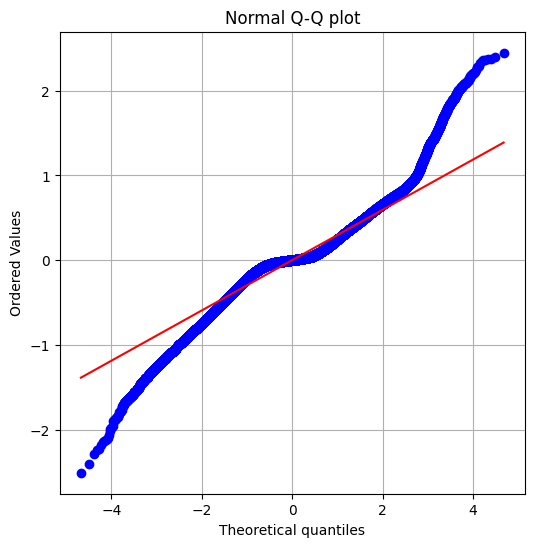

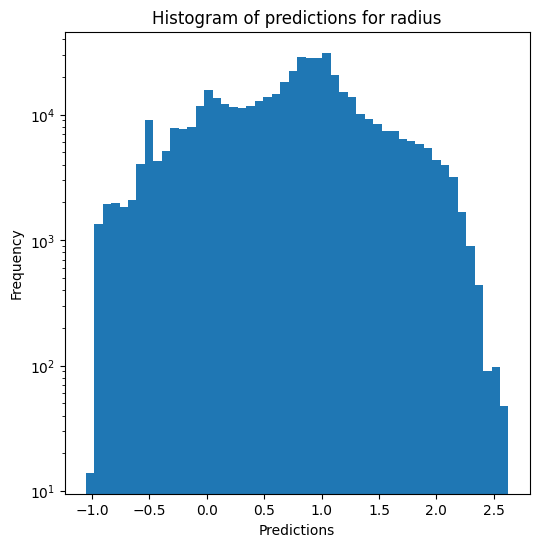

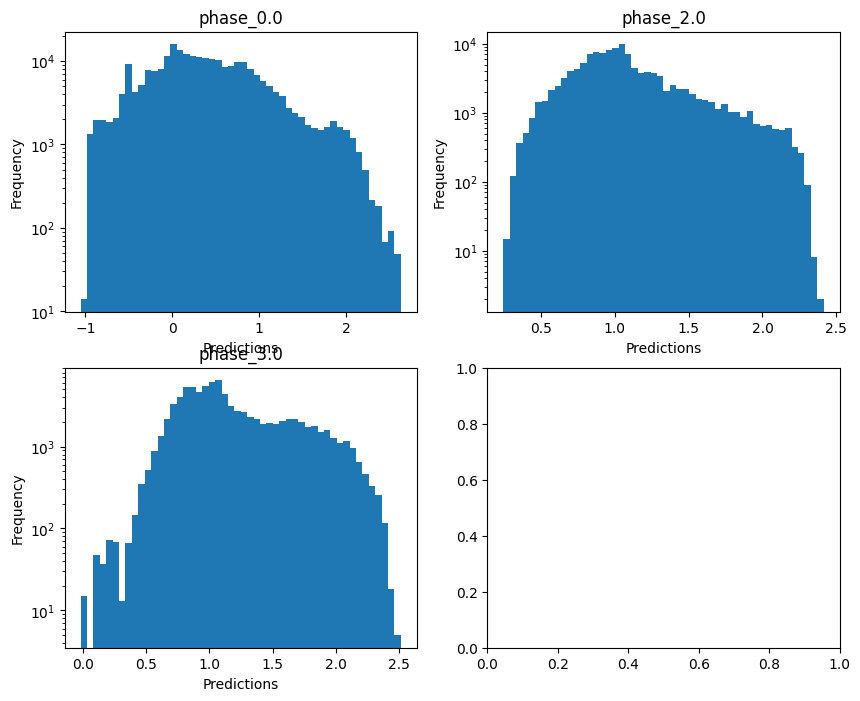

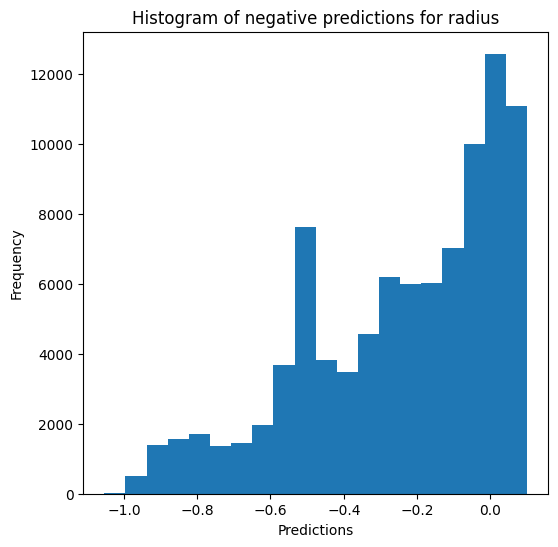

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09234780681059741
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08839882191023463
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08963582324046615
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08961681460711458
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09019081666194434

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9301163502931963
  RMSE :  0.09466681883059101
  MAE :  0.055922370789001995
  MedAE :  0.029503532396116583
  CORR :  0.9648971639094235
  MAX_ER :  0.7075548513713428
  Percentiles : 
    75th percentile :  0.05541314791374363
    90th percentile :  0.14598864660085184
    95th percentile :  0.23998530661928197
    99th percentile :  0.37110912055205003

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.8504797312207428
  RMSE :  0.12416349111106922
  MAE :  0.0923792729536393
  MedAE :  0.06875078426690884
  CORR :  0.9222263515967575
  MAX_ER :  0.6127179875519189
  Percentiles : 
    75th percentile :  0.12671312080042973
    90th percentile :  0.209229982156896
    95th percentile :  0.26755900724706516
    99th percentile 

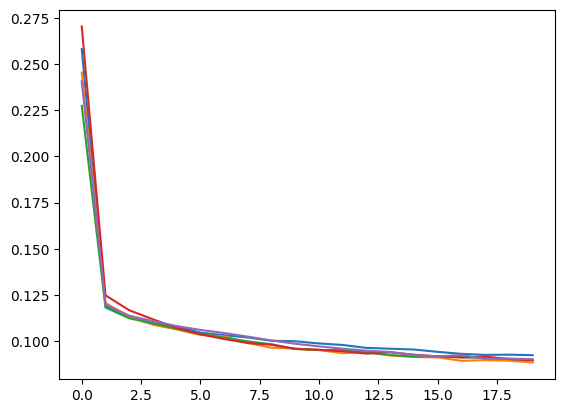

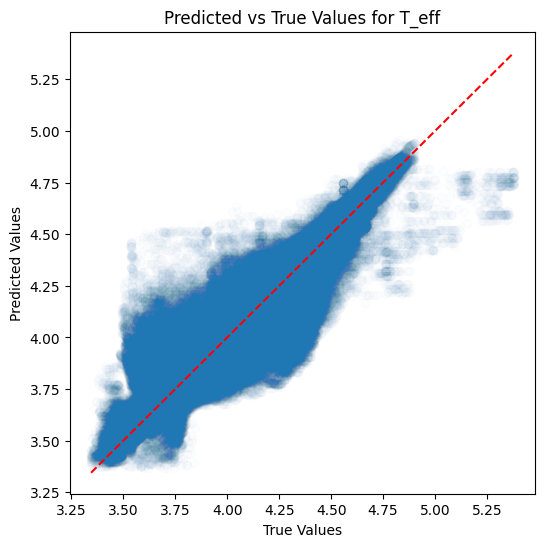

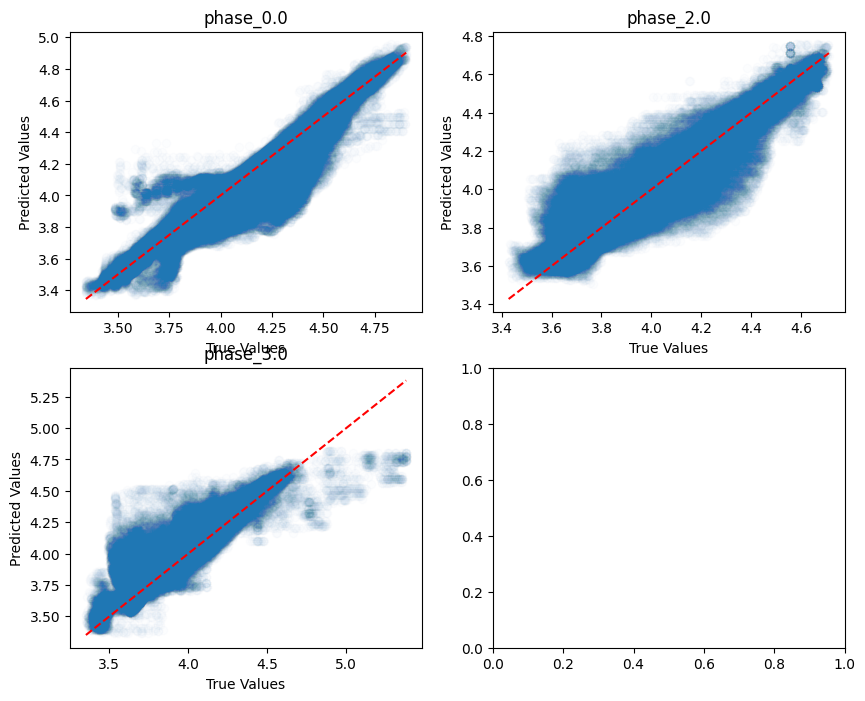

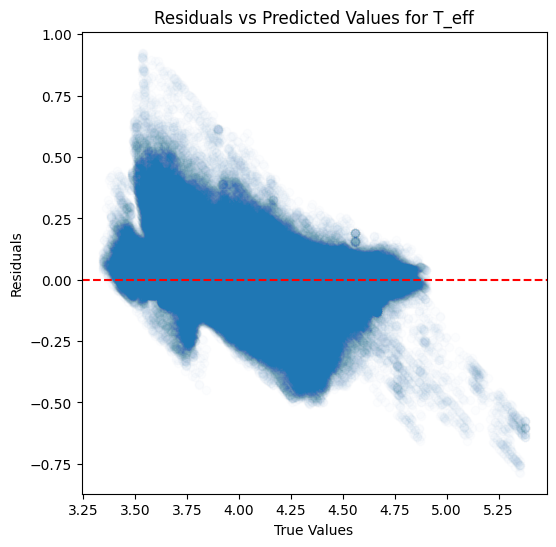

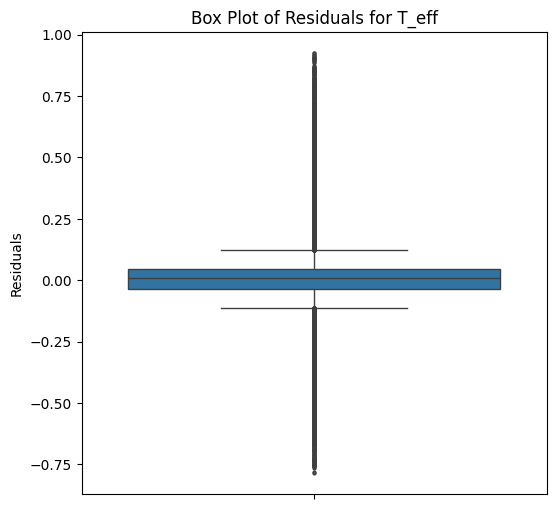

...

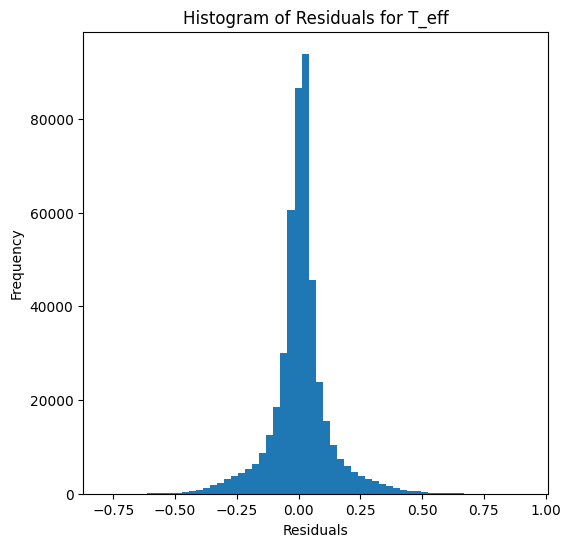

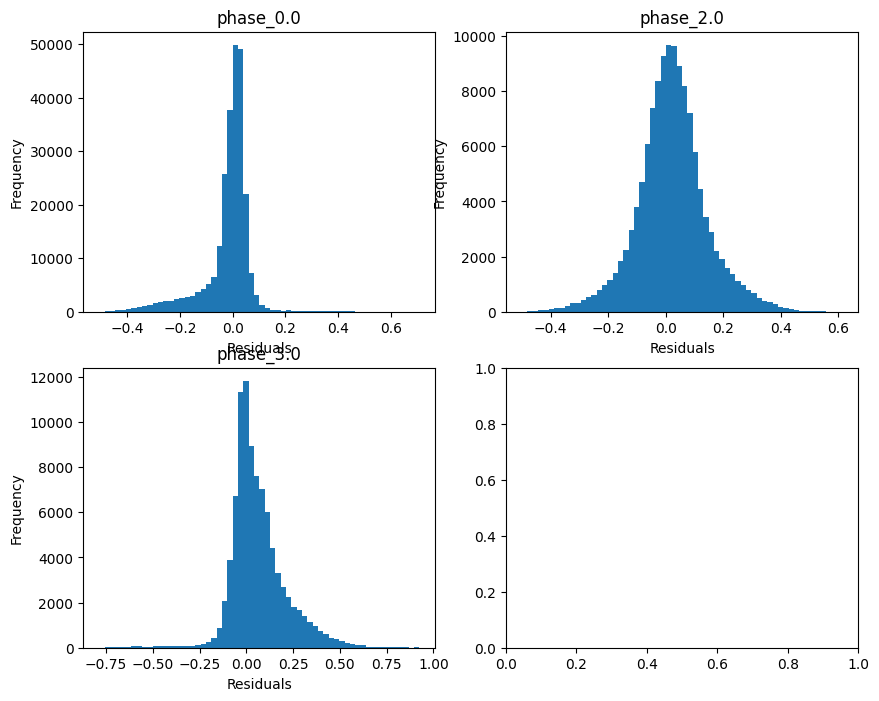

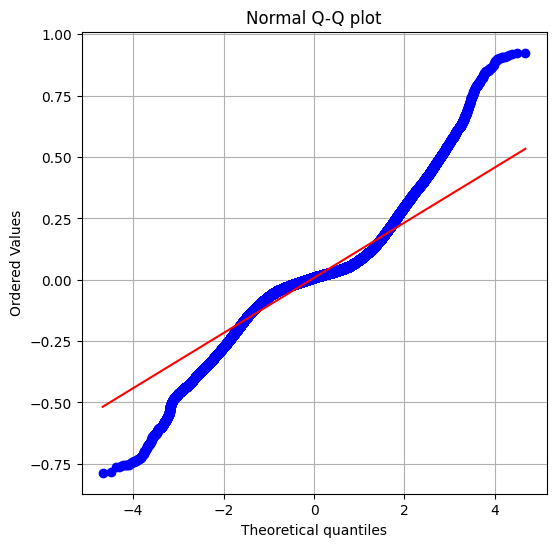

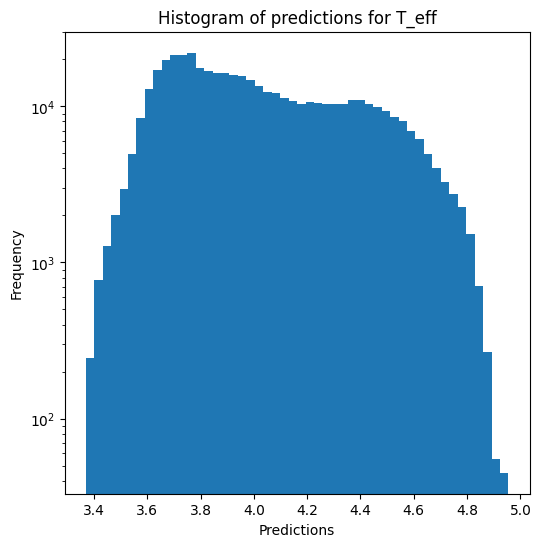

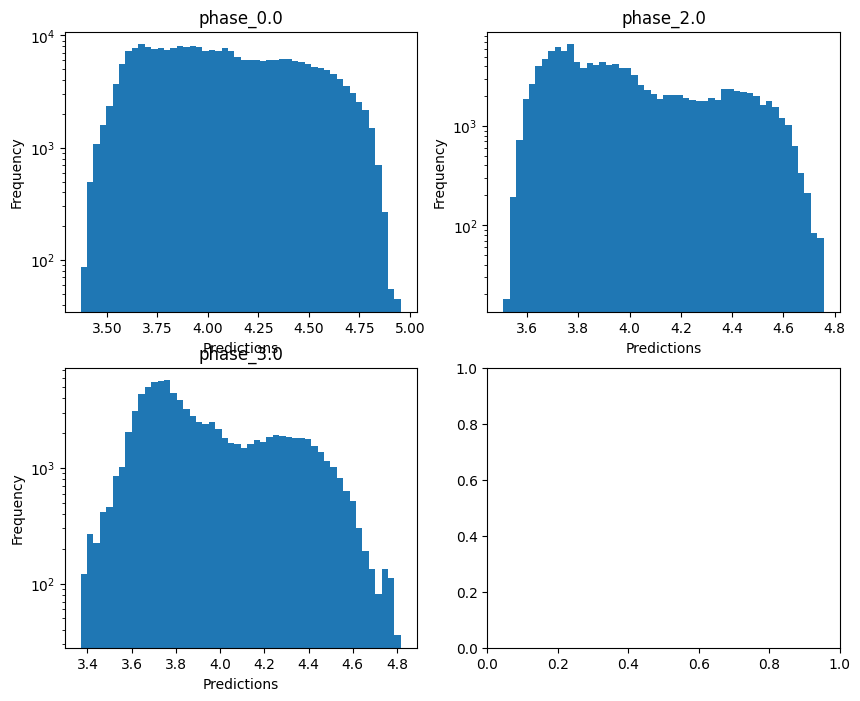


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.39673337884952586
  RMSE :  0.5150495128308895
  MAE :  0.23733786632041312
  MedAE :  0.054005201390794344
  CORR :  0.807208078815741
  MAX_ER :  4.789594303906349
  Percentiles : 
    75th percentile :  0.13913835918499395
    90th percentile :  0.8521791969669028
    95th percentile :  1.3049419079560238
    99th percentile :  1.9614244846765965

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.3895086801927977
  RMSE :  0.7130629435160946
  MAE :  0.543240552995336
  MedAE :  0.4144808263284496
  CORR :  0.627652844506561
  MAX_ER :  3.3173855970394155
  Percentiles : 
    75th percentile :  0.7909424045813533
    90th percentile :  1.2167853773784771
    95th percentile :  1.4745649112852555
    99th percentile :  1.958596057515502

log_g results for the phase category with a value

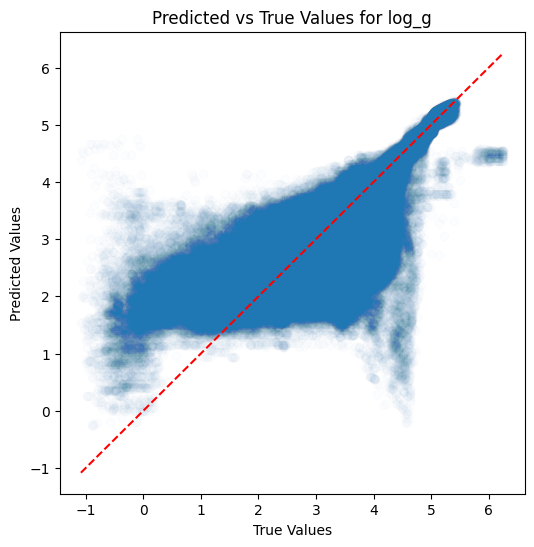

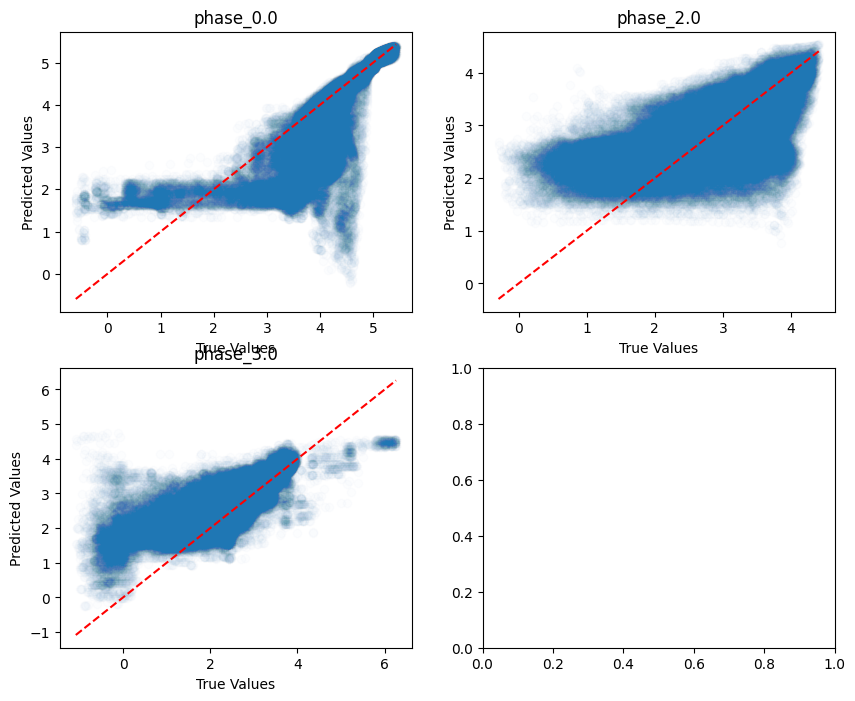

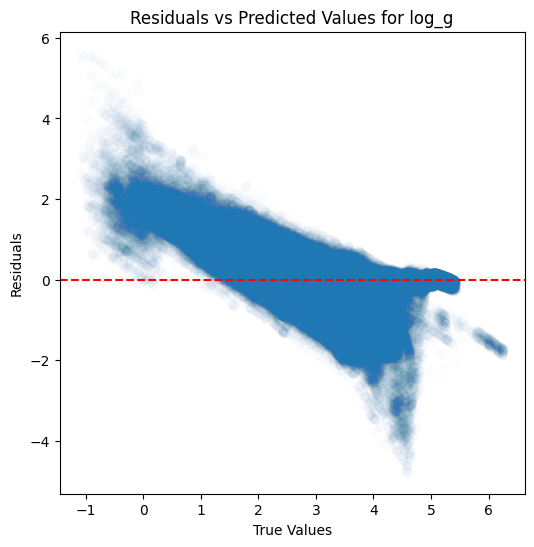

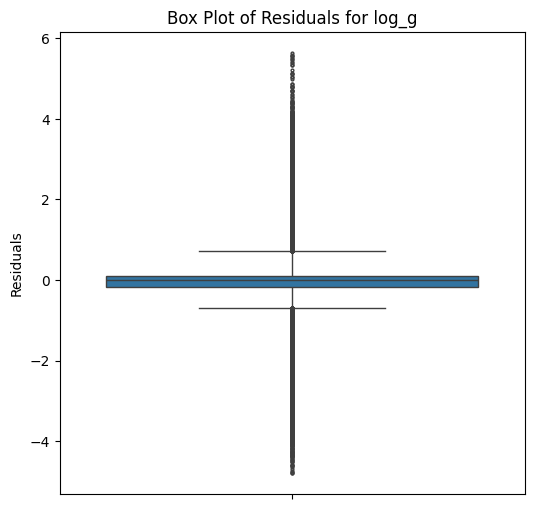

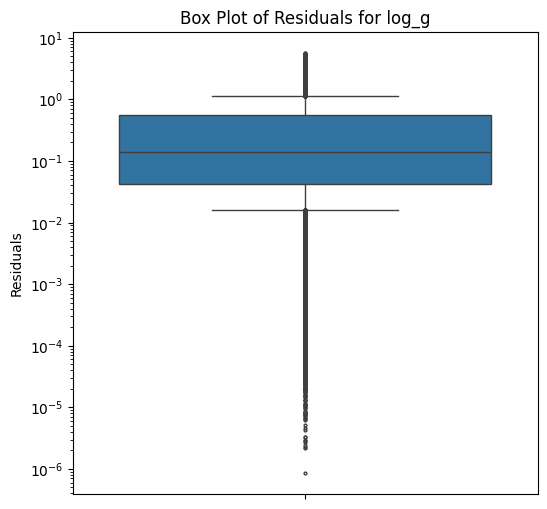

...

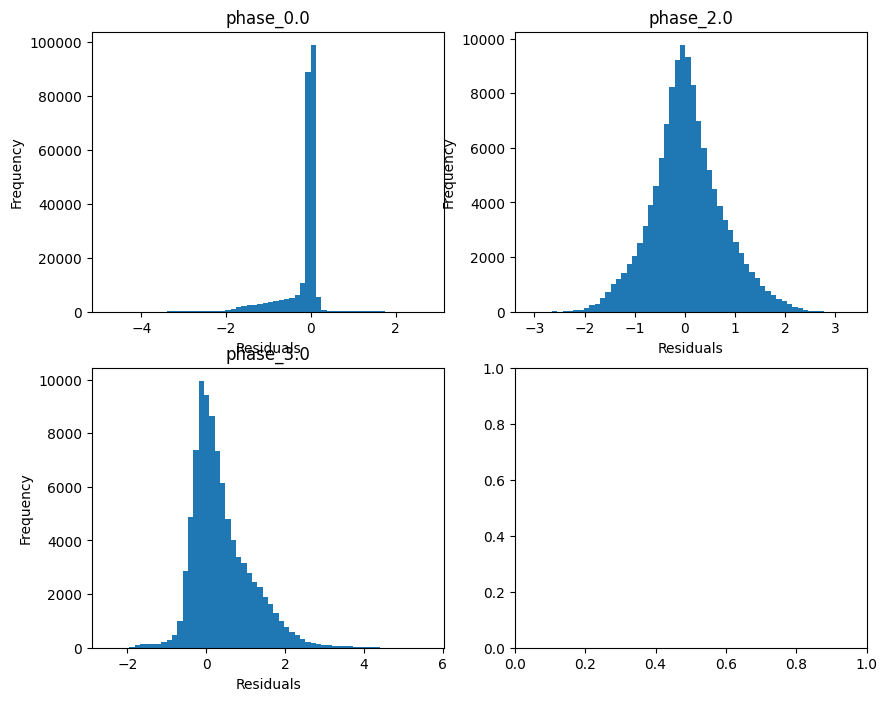

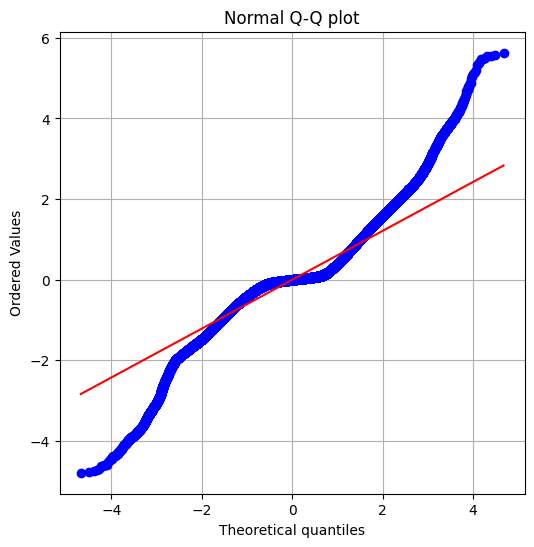

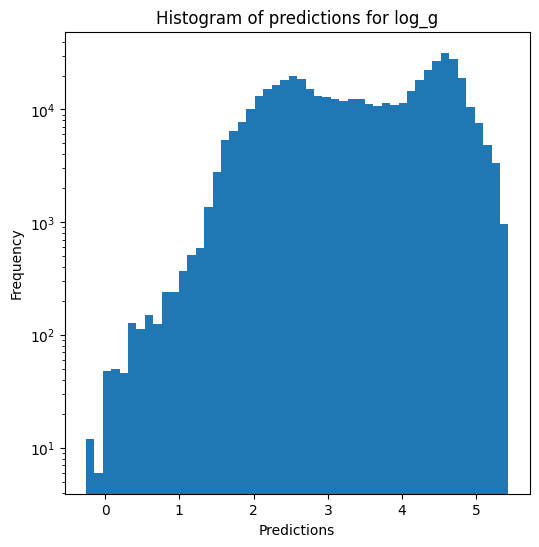

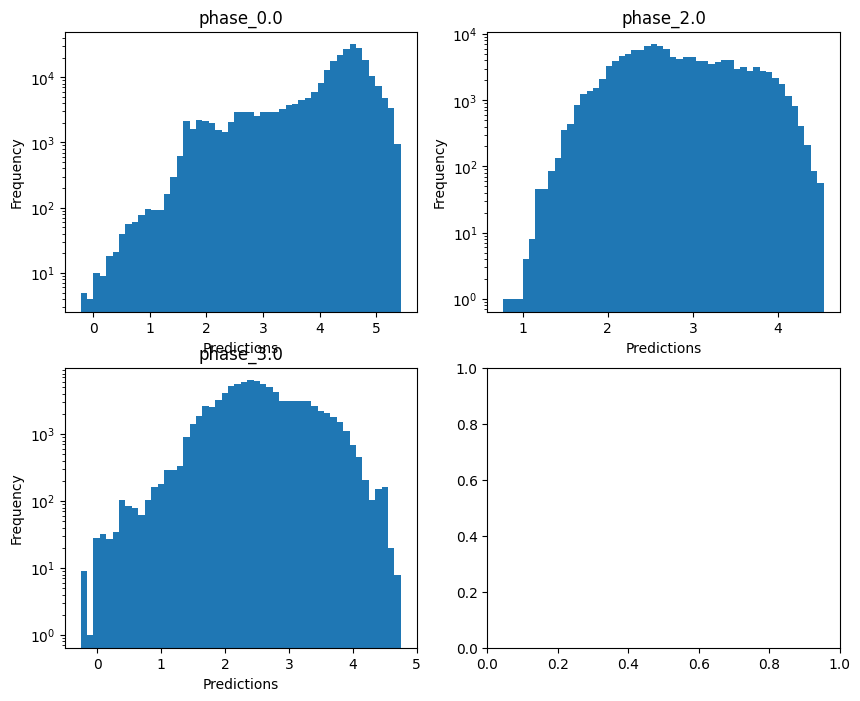

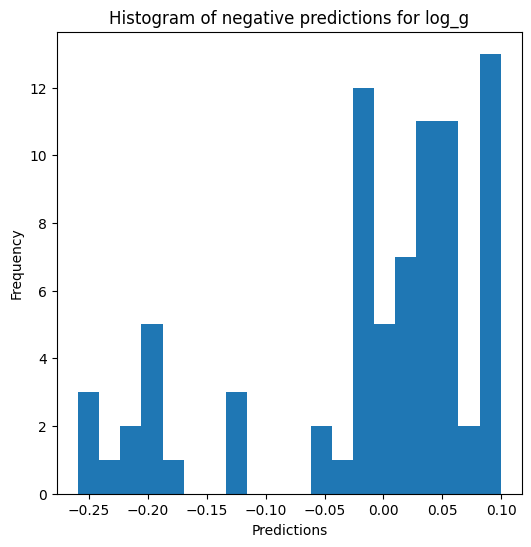


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8154709522675168
  RMSE :  0.25920740046119084
  MAE :  0.12496174391957846
  MedAE :  0.035522125374005675
  CORR :  0.9212710151731694
  MAX_ER :  2.4292051988223586
  Percentiles : 
    75th percentile :  0.08758865057243309
    90th percentile :  0.4270594607391579
    95th percentile :  0.6524353368314854
    99th percentile :  0.9833848147260756

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.47410508002947893
  RMSE :  0.3568101048063551
  MAE :  0.27258209555463975
  MedAE :  0.2089953452663218
  CORR :  0.6930830512506778
  MAX_ER :  1.6488720855723735
  Percentiles : 
    75th percentile :  0.3963032831908626
    90th percentile :  0.6076775765657343
    95th percentile :  0.736172503061332
    99th percentile :  0.9783836353621976

radius results for the phase category wit

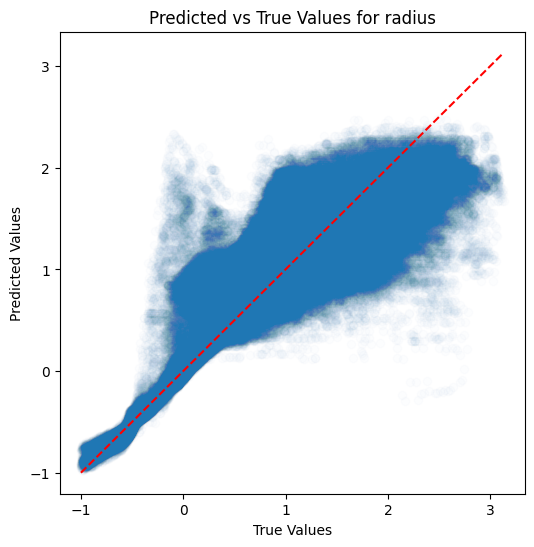

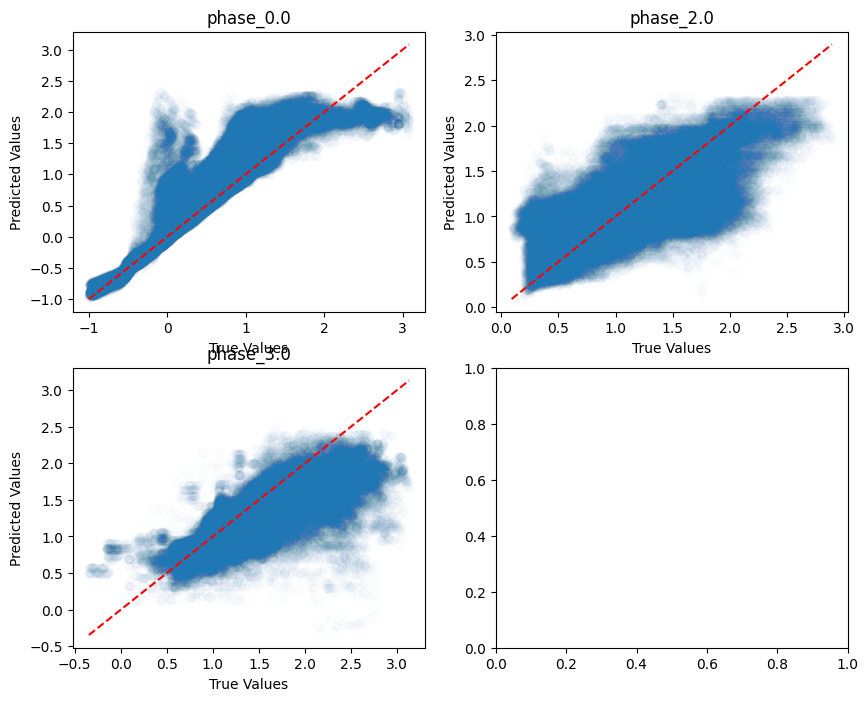

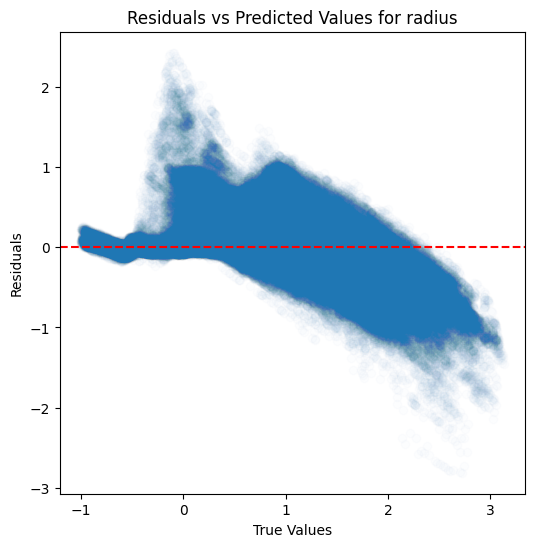

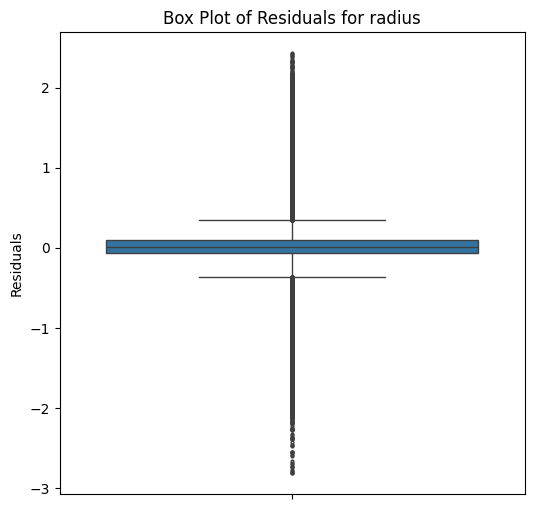

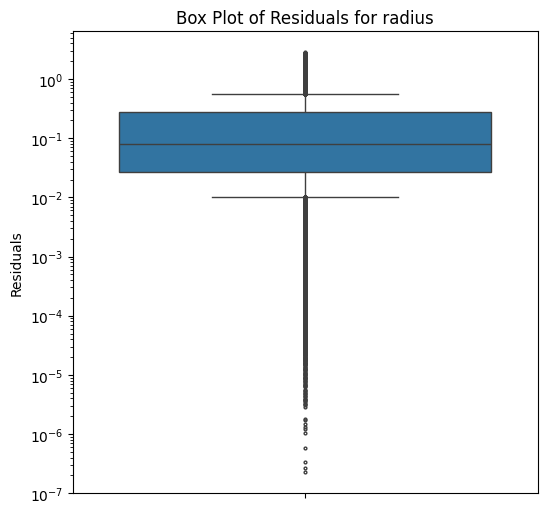

...

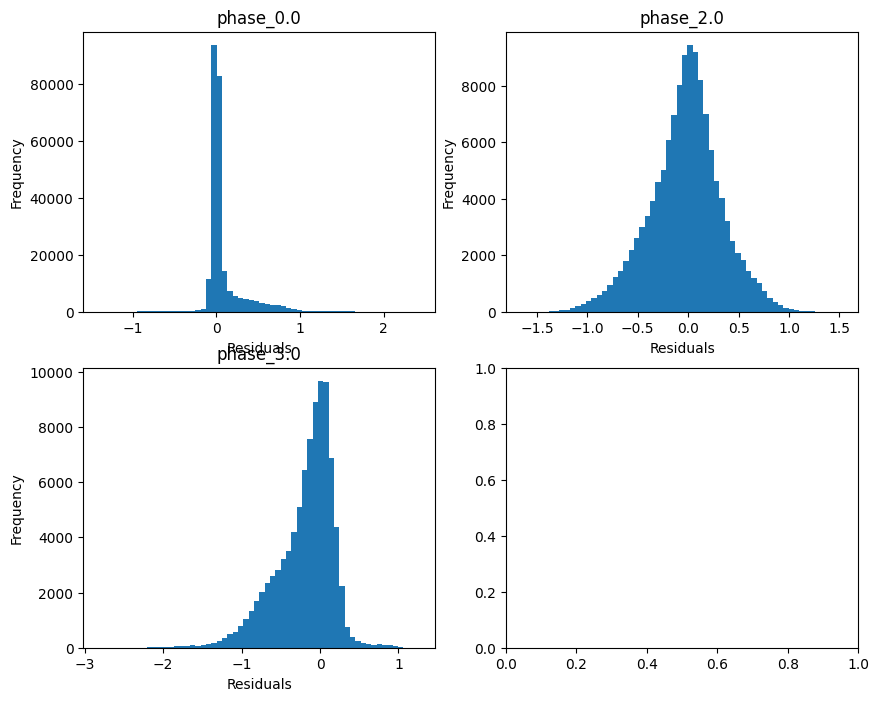

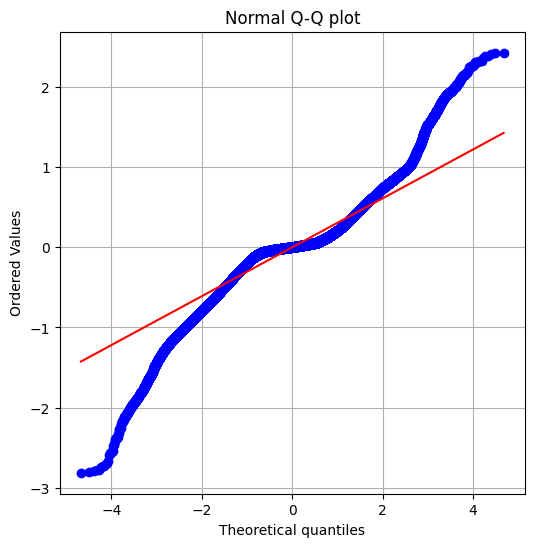

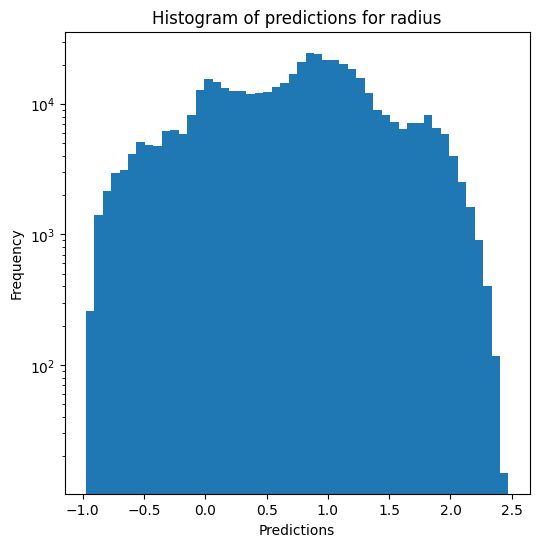

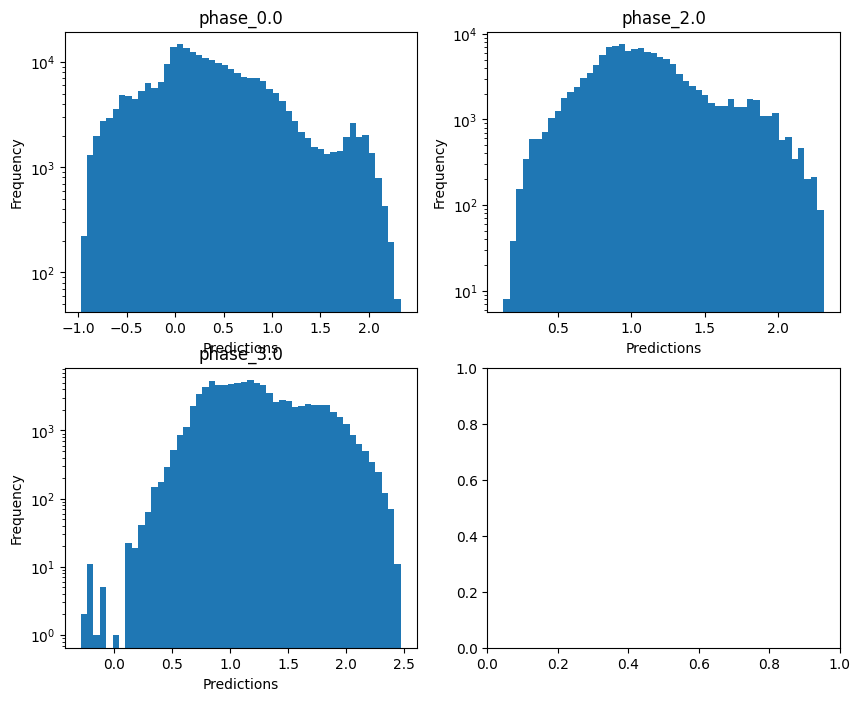

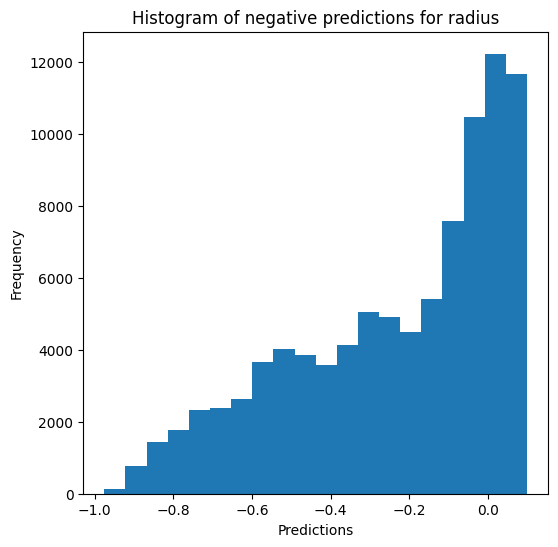

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon